# All oscillation analysis

Brief 1-2 sentence description of notebook.

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import collections
import itertools
from collections import defaultdict

In [3]:
# Imports of all used packages and libraries
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import mannwhitneyu

In [4]:
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import colorsys

In [338]:
from sklearn.metrics import confusion_matrix

In [5]:
from spectral_connectivity import Multitaper, Connectivity
import spectral_connectivity

In [6]:
FONTSIZE = 20

In [7]:
font = {'weight' : 'medium',
        'size'   : 20}

matplotlib.rc('font', **font)

## Inputs & Data

Explanation of each input and where it comes from.

In [8]:
# Inputs and Required data loading
# input varaible names are in all caps snake case
# Whenever an input changes or is used for processing 
# the vairables are all lower in snake case
OUTPUT_DIR = r"./proc" # where data is saved should always be shown in the inputs

In [9]:
CHANNEL_MAP_AND_ALL_TRIALS_DF = pd.read_pickle("./proc/full_baseline_and_trial_lfp_traces.pkl")
MERGED_TRIALS_AND_VIDEO = pd.read_pickle("./proc/trial_SLEAP_and_metadata.pkl")

In [10]:
OUTCOME_TO_COLOR = {'lose': "red",
 'omission': "orange",
 'rewarded': "green",
 'win': "blue"}

OUTCOME_TO_COLOR = {'lose': "#951a1d",
 'omission': "#af780d",
 'rewarded': "#0499af",
 'win': "#3853a3"}

In [11]:
OUTCOME_COMPARISONS = {"win_lose": ("win", "lose"), "lose_omission": ("lose", "omission"), "win_rewarded": ("win", "rewarded")}

In [12]:
TRIAL_OR_BASELINE_TO_STYLE = {'baseline': "--", "trial": "-"}

In [13]:
TIME_HALFBANDWIDTH_PRODUCT = 2
TIME_WINDOW_DURATION = 1
TIME_WINDOW_STEP = 0.5
RESAMPLE_RATE=1000

In [14]:
BIN_TO_VELOCITY = {0: "0 to 2.5cm/s", 1: "2.5 to 5cm/s", 2: "5 to 10 cm/s", 3: "10cm/s+"}

In [15]:
MIN_VELOCITY = 0
MAX_VELOCITY = 2.5

In [16]:
ALL_BANDS = ["theta", "beta", "gamma"]
BAND_TO_FREQ = {"theta": {"low_freq": 6, "high_freq": 11}, "beta": {"low_freq": 20, "high_freq": 31}, "gamma": {"low_freq": 30, "high_freq": 51}}
BAND_TO_FREQ = {"theta": (6,11), "beta": (20,31), "gamma": (30,51)}

In [17]:
GROUPINGS = "trial_outcome"

In [18]:
FONTSIZE=20

In [19]:
MERGED_TRIALS_AND_VIDEO.head()

,time,recording_dir,recording_file,time_stamp_index,video_file,video_frame,video_number,subject_info,competition_closeness,video_name,...,baseline_thorax_velocity,trial_thorax_velocity,trial_chunked_thorax_velocity,baseline_chunked_thorax_velocity,trial_chunked_ephys_timestamp,baseline_chunked_ephys_timestamp,trial_chunked_lfp_index,baseline_chunked_lfp_index,binned_baseline_thorax_velocity,binned_trial_thorax_velocity
0,30950500,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,27998597,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,28574,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[1.2476140081638165, 1.1366289071218907, 1.068...","[0.18170472850681613, 0.16961378983662276, 0.2...","[0.49872187702582166, 0.5847505450273386, 1.07...","[1.6838472335457935, 1.7550373254126983, 1.372...","[(27998597, 28018597), (28008597, 28028597), (...","[(27798597, 27818597), (27808597, 27828597), (...","[(1399929, 1400929), (1400429, 1401429), (1400...","[(1389929, 1390929), (1390429, 1391429), (1390...","[0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 2, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, ..."
1,32550496,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,29598593,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,30569,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[2.7236727895073223, 2.628037603947678, 2.5298...","[0.38577700470932025, 0.16352840888997497, 0.0...","[0.3129891797005337, 0.2588847730730972, 0.210...","[1.458421075097482, 0.5407183310858753, 0.2360...","[(29598593, 29618593), (29608593, 29628593), (...","[(29398593, 29418593), (29408593, 29428593), (...","[(1479929, 1480929), (1480429, 1481429), (1480...","[(1469929, 1470929), (1470429, 1471429), (1470...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,34350494,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,31398591,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,32813,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[5.210405290871598, 5.31421978904958, 5.379251...","[0.16560567036540477, 0.1278165569746918, 0.09...","[0.19868857983610794, 0.508612732615851, 0.481...","[3.439626522203859, 1.5683251160952123, 1.1535...","[(31398591, 31418591), (31408591, 31428591), (...","[(31198591, 31218591), (31208591, 31228591), (...","[(1569929, 1570929), (1570429, 1571429), (1570...","[(1559929, 1560929), (1560429, 1561429), (1560...","[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,35950496,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,32998593,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,34807,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[1.6555785442563817, 1.6866235492876445, 1.664...","[0.6307901161394641, 0.6655381193431421, 0.701...","[0.4673908122355257, 0.39056964369789443, 0.38...","[0.900289992310536, 0.3533926495729531, 0.2807...","[(32998593, 33018593), (33008593, 33028593), (...","[(32798593, 32818593), (32808593, 32828593), (...","[(1649929, 1650929), (1650429, 1651429), (1650...","[(1639929, 1640929), (1640429, 1641429), (1640...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,37450494,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,34498591,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,36677,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[0.9562352171082348, 0.8615465705681848, 0.756...","[0.15955796441347841, 0.18843088608181321, 0.2...","[0.23449342689004346, 0.17815867178863123, 0.2...","[0.3903027043299651, 0.397100110767035, 0.8705...","[(34498591, 34518591), 

In [20]:
CHANNEL_MAP_AND_ALL_TRIALS_DF.head()

,time,recording_dir,recording_file,time_stamp_index,video_file,video_frame,video_number,subject_info,competition_closeness,video_name,...,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,LH_baseline_lfp_trace,LH_trial_lfp_trace,MD_baseline_lfp_trace,MD_trial_lfp_trace
0,6310663,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,1390826,20221202_134600_omission_and_competition_subje...,1734,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[1.8457601, 1.7363818, 1.6475118, 1.59738, 1.2...","[0.6927297, 0.96389693, 0.7884358, -0.04101689...","[-0.06969439, -0.09568214, -0.05315674, 0.1571...","[1.5864334, 1.5710771, 1.5970649, 1.2155175, 0...","[2.0367627, 2.1163385, 2.1618104, 2.2679114, 2...","[0.3164087, 0.36377528, 0.18757163, -0.5020857...","[3.1382985, 3.2319791, 3.2788196, 3.2881875, 3...","[0.8118982, 1.2209699, 0.87435186, -0.4028264,...","[1.3934726, 1.494771, 1.764077, 1.828315, 1.68...","[-0.9783956, -0.86721426, -0.7288553, -1.40582..."
1,7910662,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,2990825,20221202_134600_omission_and_competition_subje...,3728,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[1.2191132, 1.1348007, 1.2054409, 1.0960625, 0...","[1.0732753, 0.7246318, 0.7633699, 0.3782669, -...","[0.31539667, 0.23152715, 0.29767776, 0.4217101...","[0.03543783, -0.27641505, -0.40044746, -0.6638...","[0.3107247, 0.14209972, -0.05873455, -0.331566...","[0.026525281, -0.04547191, 0.11936376, -0.4092...","[-1.180375, -1.2959143, -1.3771042, -1.458294,...","[0.9492963, 0.46840277, 0.6713773, 0.043717593...","[-0.14577106, -0.16059524, 0.027177656, 0.1680...","[1.6281886, 1.349, 1.4675934, 0.9487473, -0.21..."
2,9710660,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,4790823,20221202_134600_omission_and_competition_subje...,5972,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[-1.2669662, -1.2965895, -1.2532939, -0.986684...","[0.28711826, 0.84996116, 1.0960625, 0.8226166,...","[-1.2556804, -1.2580429, -1.3312811, -1.118654...","[0.060244307, 0.4748669, 0.7654571, 0.6591436,...","[-1.9912907, -1.9041362, -1.9325562, -1.542255...","[0.69344664, 1.4001559, 1.7582471, 1.4304705, ...","[-0.19985186, -0.074944444, -0.18423842, -0.13...","[-0.59643286, 0.27167362, 0.6901134, 0.4371759...","[-0.32119048, -0.52872896, -0.96851283, -0.753...","[0.096357144, 0.88450915, 1.2131118, 0.8943919..."
3,11310658,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,6390821,20221202_134600_omission_and_competition_subje...,7966,1.0,6_1_top_2_base_3,omission,20221202_134600_omission_and_competition_subje...,...,"[-2.0257788, -2.0348935, -1.9323514, -1.754611...","[2.376701, 2.3015034, 1.7796774, 0.9411098, 0....","[0.16655779, 0.42879772, 0.66268736, 0.6934002...","[-1.8427671, -2.303459, -2.6802812, -3.060647,...","[-1.2637402, -1.0382752, -0.82986236, -0.74649...","[2.6771586, 2.3929594, 2.209177, 1.9761335, 1....","[-2.538743, -2.1983705, -1.8673657, -1.7143542...","[2.8447661, 2.3045416, 1.5301157, 0.96490973, ...","[-2.7647088, -2.5546997, -2.3051593, -2.055619...","[2.087738, 1.7418406, 1.1266373, 0.45954946, 0..."
4,12810657,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,7890820,20221202_134600_omission_and_competition_subje...,9836,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[-0.5765152, 0.25749493, 0.6403192, 0.4375135,...","[-0.043295607, 0.73602533, 0.31674156, 0.07747...","[-0.31421542, 0.19727057, 0.4453354, 0.3744597...","[0.21617076, 0.8221576, 0.58236164, 0.43116024...","[-2.1352851, -2.0576038, -2.0822346, -2.140969...","[-0.18188764, 0.113

## Outputs

Describe each output that the notebook creates. 

- Is it a plot or is it data?

- How valuable is the output and why is it valuable or useful?

## Functions 

In [21]:
def generate_pairs(lst):
    pairs = []
    n = len(lst)
    for i in range(n):
        for j in range(i+1, n):
            pairs.append((lst[i], lst[j]))
    return pairs

In [22]:
def nested_dict():
    return defaultdict(dict)

In [23]:
def mean_of_counter(counter):
    # Extract values from the Counter and calculate the mean
    values = list(counter.values())
    return sum(values) / len(values) if values else 0  # Prevent division by zero

In [24]:
def adjust_lightness(color, amount=0.5):
    """
    Adjusts the lightness of the given color by the provided amount.
    :param color: Input color in some format that matplotlib's `to_rgb` can handle.
    :param amount: Amount to adjust. > 1 for lighter, < 1 for darker.
    :return: Adjusted color.
    """
    import colorsys
    c = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(*c)
    return colorsys.hls_to_rgb(h, max(0, min(1, amount * l)), s)

In [25]:
def generate_gradient_colors(base_color, num_colors=10):
    """
    Generate gradient colors based on a base color.
    
    :param base_color: The base color to create a gradient from.
    :param num_colors: The number of gradient colors to generate.
    :return: List of colors.
    """
    # Convert base color to HLS (Hue, Lightness, Saturation)
    h, l, s = colorsys.rgb_to_hls(*mcolors.to_rgb(base_color))

    # Determine the step size for lightness
    middle_index = num_colors // 2
    lightness_step = l / (middle_index if middle_index > 0 else 1)

    colors = []
    for i in range(num_colors):
        if i < middle_index:
            # For the lighter colors (before the middle)
            new_lightness = l + (middle_index - i) * lightness_step
        elif i == middle_index:
            # The middle color remains the base color
            new_lightness = l
        else:
            # For the darker colors (after the middle)
            new_lightness = l - (i - middle_index) * lightness_step

        # Ensure new lightness is within the valid range [0, 1]
        new_lightness = max(0, min(new_lightness, 1))

        new_color = colorsys.hls_to_rgb(h, new_lightness, s)
        colors.append(new_color)

    return colors

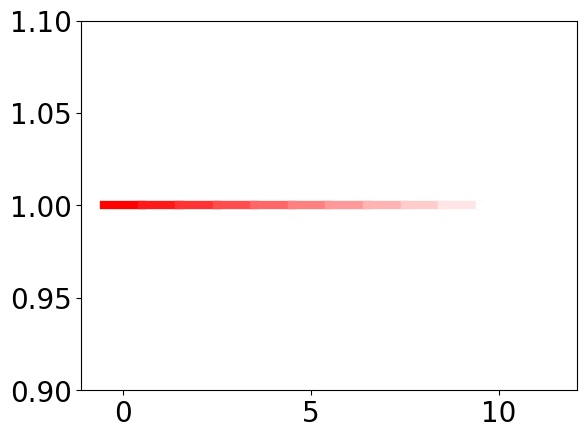

In [26]:
# Original color
original_color = 'red'  # Can be any color matplotlib understands

# Generate lighter versions
lighter_colors = [adjust_lightness(original_color, amount=1+(0.1*i)) for i in range(12)]

# Plotting to demonstrate the colors
for i, color in enumerate(lighter_colors):
    plt.plot([i-0.5, i+0.5], [1, 1], color=color, linewidth=6)  

plt.ylim(0.9, 1.1)
plt.show()

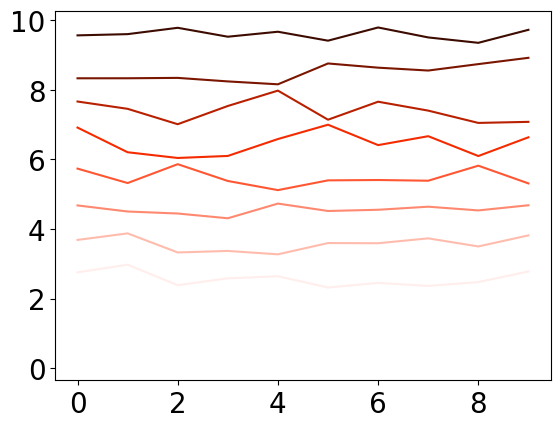

In [27]:
# Base color
base_color = '#ff5733'  # Reddish color

# Number of colors you want in the gradient
num_colors = 10

# Generate gradient colors
gradient_colors = generate_gradient_colors(base_color, num_colors)

# Set the color cycle to use the gradient colors
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=gradient_colors)

# Test by plotting some data
for i in range(num_colors):
    plt.plot(np.arange(10), np.random.rand(10) + i)

plt.show()

## Processing

Describe what is done to the data here and how inputs are manipulated to generate outputs. 

In [28]:
# As much code and as many cells as required
# includes EDA and playing with data
# GO HAM!

# Ideally functions are defined here first and then data is processed using the functions

# function names are short and in snake case all lowercase
# a function name should be unique but does not have to describe the function
# doc strings describe functions not function names




In [29]:
CHANNEL_MAP_AND_ALL_TRIALS_DF.columns

Index(['time', 'recording_dir', 'recording_file', 'time_stamp_index',
       'video_file', 'video_frame', 'video_number', 'subject_info',
       'competition_closeness', 'video_name', 'all_subjects',
       'current_subject', 'trial_outcome', 'lfp_index',
       'baseline_lfp_timestamp_range', 'trial_lfp_timestamp_range',
       'baseline_ephys_timestamp_range', 'trial_ephys_timestamp_range',
       'baseline_videoframe_range', 'trial_videoframe_range', 'trial_number',
       'Cohort', 'spike_interface_mPFC', 'spike_interface_vHPC',
       'spike_interface_BLA', 'spike_interface_LH', 'spike_interface_MD',
       'mPFC_baseline_lfp_trace', 'mPFC_trial_lfp_trace',
       'vHPC_baseline_lfp_trace', 'vHPC_trial_lfp_trace',
       'BLA_baseline_lfp_trace', 'BLA_trial_lfp_trace',
       'LH_baseline_lfp_trace', 'LH_trial_lfp_trace', 'MD_baseline_lfp_trace',
       'MD_trial_lfp_trace'],
      dtype='object')

In [30]:
MERGED_TRIALS_AND_VIDEO.columns

Index(['time', 'recording_dir', 'recording_file', 'time_stamp_index',
       'video_file', 'video_frame', 'video_number', 'subject_info',
       'competition_closeness', 'video_name', 'all_subjects',
       'current_subject', 'trial_outcome', 'lfp_index',
       'baseline_lfp_timestamp_range', 'trial_lfp_timestamp_range',
       'baseline_ephys_timestamp_range', 'trial_ephys_timestamp_range',
       'baseline_videoframe_range', 'trial_videoframe_range', 'trial_number',
       'Cohort', 'spike_interface_mPFC', 'spike_interface_vHPC',
       'spike_interface_BLA', 'spike_interface_LH', 'spike_interface_MD',
       'file_path', 'start_frame', 'stop_frame', 'individual_subj', 'all_subj',
       'recording_name', 'track_names', 'subject_id', 'corner_path',
       'corner_parts', 'bottom_width', 'top_width', 'right_height',
       'left_height', 'average_height', 'average_width', 'width_ratio',
       'height_ratio', 'rescaled_locations', 'box_bottom_left', 'reward_port',
       'box_top_lef

### Merging LFP Trace dataframe and SLEAP pose tracking

In [31]:
merge_columns = ["time", "recording_file", "current_subject", "video_number"]
# Find columns in df2 that are not in merge_columns and also exist in df1, then drop them from df2
cols_to_drop = [col for col in CHANNEL_MAP_AND_ALL_TRIALS_DF.columns if col not in merge_columns and col in MERGED_TRIALS_AND_VIDEO.columns]
CHANNEL_MAP_AND_ALL_TRIALS_DF = CHANNEL_MAP_AND_ALL_TRIALS_DF.drop(columns=cols_to_drop)

In [32]:
MERGED_LFP_AND_SLEAP = pd.merge(left=CHANNEL_MAP_AND_ALL_TRIALS_DF, right=MERGED_TRIALS_AND_VIDEO, on=merge_columns, how="right")

In [33]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,baseline_thorax_velocity,trial_thorax_velocity,trial_chunked_thorax_velocity,baseline_chunked_thorax_velocity,trial_chunked_ephys_timestamp,baseline_chunked_ephys_timestamp,trial_chunked_lfp_index,baseline_chunked_lfp_index,binned_baseline_thorax_velocity,binned_trial_thorax_velocity
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[1.2476140081638165, 1.1366289071218907, 1.068...","[0.18170472850681613, 0.16961378983662276, 0.2...","[0.49872187702582166, 0.5847505450273386, 1.07...","[1.6838472335457935, 1.7550373254126983, 1.372...","[(27998597, 28018597), (28008597, 28028597), (...","[(27798597, 27818597), (27808597, 27828597), (...","[(1399929, 1400929), (1400429, 1401429), (1400...","[(1389929, 1390929), (1390429, 1391429), (1390...","[0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 2, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, ..."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[2.7236727895073223, 2.628037603947678, 2.5298...","[0.38577700470932025, 0.16352840888997497, 0.0...","[0.3129891797005337, 0.2588847730730972, 0.210...","[1.458421075097482, 0.5407183310858753, 0.2360...","[(29598593, 29618593), (29608593, 29628593), (...","[(29398593, 29418593), (29408593, 29428593), (...","[(1479929, 1480929), (1480429, 1481429), (1480...","[(1469929, 1470929), (1470429, 1471429), (1470...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[5.210405290871598, 5.31421978904958, 5.379251...","[0.16560567036540477, 0.1278165569746918, 0.09...","[0.19868857983610794, 0.508612732615851, 0.481...","[3.439626522203859, 1.5683251160952123, 1.1535...","[(31398591, 31418591), (31408591, 31428591), (...","[(31198591, 31218591), (31208591, 31228591), (...","[(1569929, 1570929), (1570429, 1571429), (1570...","[(1559929, 1560929), (1560429, 1561429), (1560...","[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[1.6555785442563817, 1.6866235492876445, 1.664...","[0.6307901161394641, 0.6655381193431421, 0.701...","[0.4673908122355257, 0.39056964369789443, 0.38...","[0.900289992310536, 0.3533926495729531, 0.2807...","[(32998593, 33018593), (33008593, 33028593), (...","[(32798593, 32818593), (32808593, 32828593), (...","[(1649929, 1650929), (1650429, 1651429), (1650...","[(1639929, 1640929), (1640429, 1641429), (1640...","[0, 0, 0, 0

In [34]:
trace_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "trace" in col]

In [35]:
trial_trace_columns = sorted([col for col in MERGED_LFP_AND_SLEAP.columns if "trial_lfp_trace" in col])
baseline_trace_columns = sorted([col for col in MERGED_LFP_AND_SLEAP.columns if "baseline_lfp_trace" in col])

In [36]:
trial_trace_columns

['BLA_trial_lfp_trace',
 'LH_trial_lfp_trace',
 'MD_trial_lfp_trace',
 'mPFC_trial_lfp_trace',
 'vHPC_trial_lfp_trace']

- Getting the trace column pairs

In [37]:
trial_brain_region_pairs = generate_pairs(trial_trace_columns)
trial_brain_region_pairs = sorted(trial_brain_region_pairs)
baseline_brain_region_pairs = generate_pairs(baseline_trace_columns)
baseline_brain_region_pairs = sorted(baseline_brain_region_pairs)

In [38]:
trial_brain_region_pairs

[('BLA_trial_lfp_trace', 'LH_trial_lfp_trace'),
 ('BLA_trial_lfp_trace', 'MD_trial_lfp_trace'),
 ('BLA_trial_lfp_trace', 'mPFC_trial_lfp_trace'),
 ('BLA_trial_lfp_trace', 'vHPC_trial_lfp_trace'),
 ('LH_trial_lfp_trace', 'MD_trial_lfp_trace'),
 ('LH_trial_lfp_trace', 'mPFC_trial_lfp_trace'),
 ('LH_trial_lfp_trace', 'vHPC_trial_lfp_trace'),
 ('MD_trial_lfp_trace', 'mPFC_trial_lfp_trace'),
 ('MD_trial_lfp_trace', 'vHPC_trial_lfp_trace'),
 ('mPFC_trial_lfp_trace', 'vHPC_trial_lfp_trace')]

In [39]:
baseline_brain_region_pairs

[('BLA_baseline_lfp_trace', 'LH_baseline_lfp_trace'),
 ('BLA_baseline_lfp_trace', 'MD_baseline_lfp_trace'),
 ('BLA_baseline_lfp_trace', 'mPFC_baseline_lfp_trace'),
 ('BLA_baseline_lfp_trace', 'vHPC_baseline_lfp_trace'),
 ('LH_baseline_lfp_trace', 'MD_baseline_lfp_trace'),
 ('LH_baseline_lfp_trace', 'mPFC_baseline_lfp_trace'),
 ('LH_baseline_lfp_trace', 'vHPC_baseline_lfp_trace'),
 ('MD_baseline_lfp_trace', 'mPFC_baseline_lfp_trace'),
 ('MD_baseline_lfp_trace', 'vHPC_baseline_lfp_trace'),
 ('mPFC_baseline_lfp_trace', 'vHPC_baseline_lfp_trace')]

- Getting just the region names

In [40]:
all_pair_base_name = []
for region_1, region_2 in trial_brain_region_pairs:
    all_pair_base_name.append("{}_{}".format(region_1.split("_")[0], region_2.split("_")[0]))
all_pair_base_name = sorted(all_pair_base_name)

In [41]:
all_pair_base_name

['BLA_LH',
 'BLA_MD',
 'BLA_mPFC',
 'BLA_vHPC',
 'LH_MD',
 'LH_mPFC',
 'LH_vHPC',
 'MD_mPFC',
 'MD_vHPC',
 'mPFC_vHPC']

## Power Calcuation

- Calcuating the power at each frequency band

In [42]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_multitaper".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_lfp_trace".format(region_and_baseline_or_trial)].apply(lambda x: Multitaper(time_series=x, sampling_frequency=RESAMPLE_RATE, time_halfbandwidth_product=TIME_HALFBANDWIDTH_PRODUCT,                                                                              time_window_duration=TIME_WINDOW_DURATION, time_window_step=TIME_WINDOW_STEP                                                                                                                                         ))

In [43]:
for col in trace_columns:
    print(col)
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_multitaper".format(region_and_baseline_or_trial)].apply(lambda x: Connectivity.from_multitaper(x))

mPFC_baseline_lfp_trace
mPFC_trial_lfp_trace
vHPC_baseline_lfp_trace
vHPC_trial_lfp_trace
BLA_baseline_lfp_trace
BLA_trial_lfp_trace
LH_baseline_lfp_trace
LH_trial_lfp_trace
MD_baseline_lfp_trace
MD_trial_lfp_trace


In [44]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_frequencies".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)].apply(lambda x: x.frequencies)

In [45]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_all_window_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)].apply(lambda x: x.power().squeeze())

In [46]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")

In [47]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,mPFC_baseline_all_window_power,mPFC_trial_all_window_power,vHPC_baseline_all_window_power,vHPC_trial_all_window_power,BLA_baseline_all_window_power,BLA_trial_all_window_power,LH_baseline_all_window_power,LH_trial_all_window_power,MD_baseline_all_window_power,MD_trial_all_window_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[[0.009823293555262794, 0.013924021048577154, ...","[[0.003615743090164337, 0.020784870210994073, ...","[[0.004182283533414606, 0.004589243208990474, ...","[[0.011697103017073326, 0.03404168621796775, 0...","[[0.005353983454892757, 0.01006784871417599, 0...","[[0.0019678294433681668, 0.003568165862318084,...","[[0.014156556290954811, 0.015811485476915764, ...","[[0.01740978843109557, 0.015614214245673032, 0...","[[0.032420332093765145, 0.02588818663960985, 0...","[[0.001126425519817756, 0.0051790350768731565,..."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[[0.024759951820400854, 0.021303476025368605, ...","[[0.005252625251440256, 0.009544076854592055, ...","[[0.002096892191184231, 0.013303788944311482, ...","[[0.02194185695245405, 0.019980301951269416, 0...","[[0.008392790045477449, 0.009164992589423358, ...","[[0.011354971394795787, 0.024948815606040155, ...","[[0.009203195865696318, 0.012369094785452853, ...","[[0.004755250402581861, 0.015413926822757013, ...","[[0.029927421519669848, 0.02105523807019691, 0...","[[0.005268082999020396, 0.01164688053394768, 0..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[[0.011362483623005544, 0.00842350511603944, 0...","[[0.008142487608192315, 0.005764882508257109, ...","[[0.0016166978337783084, 0.005705520165816951,...","[[0.04982180678916146, 0.032510780389063056, 0...","[[0.005384772975860021, 0.003902799415786651, ...","[[0.04033438993135537, 0.030887886395683174, 0...","[[0.02097411820985093, 0.012691784633844525, 0...","[[0.05102492929045597, 0.03262755069515353, 0....","[[0.019964179520096176, 0.0115436746873894, 0....","[[0.03412912947336931, 0.023354876559489354, 0..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[[0.006542340959047896, 0.004409322903575986, ...","[[0.0017563036283226264, 0.0012924743905227834...","[[0.023311719774968133, 0.016007367431799868, ...","[[0.003256334458860641, 0.0053025934708259715,...","[[0.011390110949094753, 0.012101279184300179, ...","[[0.008089393889266917, 0.010055278188354798, ...","[[0.005229034265379665, 0.004547139730694434, ...","[[0.003590199461878245, 0.0042194869616777545,...","[[0.0046146

In [48]:
MERGED_LFP_AND_SLEAP.columns

Index(['time', 'recording_file', 'video_number', 'current_subject',
       'mPFC_baseline_lfp_trace', 'mPFC_trial_lfp_trace',
       'vHPC_baseline_lfp_trace', 'vHPC_trial_lfp_trace',
       'BLA_baseline_lfp_trace', 'BLA_trial_lfp_trace',
       'LH_baseline_lfp_trace', 'LH_trial_lfp_trace', 'MD_baseline_lfp_trace',
       'MD_trial_lfp_trace', 'recording_dir', 'time_stamp_index', 'video_file',
       'video_frame', 'subject_info', 'competition_closeness', 'video_name',
       'all_subjects', 'trial_outcome', 'lfp_index',
       'baseline_lfp_timestamp_range', 'trial_lfp_timestamp_range',
       'baseline_ephys_timestamp_range', 'trial_ephys_timestamp_range',
       'baseline_videoframe_range', 'trial_videoframe_range', 'trial_number',
       'Cohort', 'spike_interface_mPFC', 'spike_interface_vHPC',
       'spike_interface_BLA', 'spike_interface_LH', 'spike_interface_MD',
       'file_path', 'start_frame', 'stop_frame', 'individual_subj', 'all_subj',
       'recording_name', 'track_na

### Averaging the power for all the windows(without any velocity parsing) 

In [49]:
baseline_windowed_power_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "baseline_all_window_power" in col]
trial_windowed_power_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "trial_all_window_power" in col]

In [50]:
trial_windowed_power_columns

['mPFC_trial_all_window_power',
 'vHPC_trial_all_window_power',
 'BLA_trial_all_window_power',
 'LH_trial_all_window_power',
 'MD_trial_all_window_power']

In [51]:
for col in baseline_windowed_power_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_all_window_averaged_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.array(x[col]).mean(axis=0), axis=1)

In [52]:
for col in trial_windowed_power_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_all_window_averaged_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.array(x[col]).mean(axis=0), axis=1)

In [53]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")

In [54]:
MERGED_LFP_AND_SLEAP.drop(columns=trace_columns, errors="ignore").to_pickle("./proc/rce_lfp_all_window_power.pkl")


# Parsing by velocity

- Getting a mask for each segment based on velocity

In [55]:
all_bins = set(x for lst in MERGED_LFP_AND_SLEAP["binned_baseline_thorax_velocity"] for x in lst)

In [56]:
all_bins

{0, 1, 2, 3}

In [57]:
all_bin_df = []
for bin in all_bins:
    current_df = MERGED_LFP_AND_SLEAP.copy()
    current_df["binned_trial_velocity_mask"] = current_df["binned_trial_thorax_velocity"].apply(lambda x: [index for index, num in enumerate(x) if num == bin])
    current_df["binned_baseline_velocity_mask"] = current_df["binned_baseline_thorax_velocity"].apply(lambda x: [index for index, num in enumerate(x) if num == bin])
    for col in baseline_windowed_power_columns:
        region_and_baseline_or_trial = "_".join(col.split("_")[:2])
        current_df["{}_velocity_parsed_window_averaged_power".format(region_and_baseline_or_trial)] = current_df.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["binned_baseline_velocity_mask"]]), axis=0), axis=1)

    for col in trial_windowed_power_columns:
        region_and_baseline_or_trial = "_".join(col.split("_")[:2])
        current_df["{}_velocity_parsed_window_averaged_power".format(region_and_baseline_or_trial)] = current_df.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["binned_trial_velocity_mask"]]), axis=0), axis=1)
    
    current_df["velocity_bin"] = bin
    all_bin_df.append(current_df)
        
    
    


In [58]:
VELCOITY_PARSED_MERGED_LFP_AND_SLEAP = pd.concat(all_bin_df).reset_index(drop=True)

## Plotting all the similar velocities together

In [59]:
window_averaged_power_columns = [col for col in VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "velocity_parsed_window_averaged_power" in col]

In [60]:
window_averaged_power_columns

['mPFC_baseline_velocity_parsed_window_averaged_power',
 'vHPC_baseline_velocity_parsed_window_averaged_power',
 'BLA_baseline_velocity_parsed_window_averaged_power',
 'LH_baseline_velocity_parsed_window_averaged_power',
 'MD_baseline_velocity_parsed_window_averaged_power',
 'mPFC_trial_velocity_parsed_window_averaged_power',
 'vHPC_trial_velocity_parsed_window_averaged_power',
 'BLA_trial_velocity_parsed_window_averaged_power',
 'LH_trial_velocity_parsed_window_averaged_power',
 'MD_trial_velocity_parsed_window_averaged_power']

- Grouping by trial outcome and velocity

In [61]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,mPFC_baseline_all_window_averaged_power,vHPC_baseline_all_window_averaged_power,BLA_baseline_all_window_averaged_power,LH_baseline_all_window_averaged_power,MD_baseline_all_window_averaged_power,mPFC_trial_all_window_averaged_power,vHPC_trial_all_window_averaged_power,BLA_trial_all_window_averaged_power,LH_trial_all_window_averaged_power,MD_trial_all_window_averaged_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[0.01579940523904916, 0.0165626647529655, 0.02...","[0.007338252748333259, 0.01089563666395944, 0....","[0.013091607841038322, 0.014117608416465038, 0...","[0.022964455789557244, 0.022290898817971163, 0...","[0.02557420165245759, 0.02654039943079886, 0.0...","[0.013578532216685993, 0.01736326663715145, 0....","[0.005884176938003947, 0.01262773509768471, 0....","[0.016782418918595676, 0.015240122116290227, 0...","[0.03241093477294236, 0.03003938250305729, 0.0...","[0.02394606557277414, 0.024972355567400052, 0...."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[0.01043973810516993, 0.011995901256217315, 0....","[0.006520190897142798, 0.009908554975019851, 0...","[0.006274318131038264, 0.00691078513224769, 0....","[0.01052940561515397, 0.011517583637301586, 0....","[0.013189469018915191, 0.012605535448486686, 0...","[0.005072513655663902, 0.0071730776351884, 0.0...","[0.017807810758419772, 0.02051735783988241, 0....","[0.0075150800916258895, 0.012030467854449603, ...","[0.003644272984766944, 0.005808118645131345, 0...","[0.006489759161394153, 0.007582477136466669, 0..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[0.005078069620033379, 0.007847947527141026, 0...","[0.013600617428570527, 0.019533499354359572, 0...","[0.006141355758002356, 0.009303619594021637, 0...","[0.007468537947027687, 0.010884286729309219, 0...","[0.004814152657455484, 0.00618421896792938, 0....","[0.01043389231412404, 0.011229291113011746, 0....","[0.018798404711232963, 0.024949532187259045, 0...","[0.009525639680784495, 0.010941343792716796, 0...","[0.016095087975310174, 0.015224296452442521, 0...","[0.011809376046566988, 0.010816138136563104, 0..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[0.008870300252232993, 0.009661322703319016, 0...","[0.01636629887281683, 0.024804479917894477, 0....","[0.00689989260430601, 0.009437438029868149, 0....","[0.010951516062517489, 0.010717930878165088, 0...","[0.008629680530200008, 0.008992947836672616, 0...","[0.006360855718027482, 0.007822405773560854, 0...","[0.0164348816792982, 0.02

In [62]:
grouped_all_trials_df = VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.groupby(['trial_outcome', 'velocity_bin']).agg({k: lambda x: np.vstack([arr for arr in x.tolist() if not np.any(np.isnan(arr))]) for k in window_averaged_power_columns}).reset_index()

In [63]:
grouped_all_trials_df = pd.melt(grouped_all_trials_df, id_vars =['trial_outcome', 'velocity_bin'], value_vars =grouped_all_trials_df.drop(columns=["trial_outcome", "velocity_bin"]).columns, value_name="power", var_name="region_and_baseline_or_trial") 

In [64]:
grouped_all_trials_df.head()

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power
0,lose,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.020090183352770068, 0.025215370983250298, ..."
1,lose,1,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.012096547095824696, 0.008096570469847445, ..."
2,lose,2,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.006160721145788189, 0.011262819711789785, ..."
3,lose,3,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01347149329683217, 0.022370986693883776, 0..."
4,omission,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.015192233263166573, 0.014732912277589506, ..."


In [65]:
grouped_all_trials_df["brain_region"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [66]:
grouped_all_trials_df["trial_or_baseline"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [67]:
grouped_all_trials_df = grouped_all_trials_df[grouped_all_trials_df["trial_or_baseline"] == "trial"].reset_index(drop=True)

In [68]:
grouped_all_trials_df["mean_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanmean(np.vstack(x), axis=0))

In [69]:
grouped_all_trials_df["std_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanstd(np.vstack(x), axis=0))

In [70]:
grouped_all_trials_df["n_trials"] = grouped_all_trials_df["power"].apply(lambda x: np.sum(~np.isnan(x), axis=0))

In [71]:
grouped_all_trials_df["sem_power"] = grouped_all_trials_df.apply(lambda x: x["std_power"] / np.sqrt(x["n_trials"]), axis=1)

In [72]:
grouped_all_trials_df["trial_outcome"].unique()

array(['lose', 'omission', 'rewarded', 'win'], dtype=object)

In [73]:
grouped_all_trials_df

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,lose,0,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.010234599238710826, 0.009366231284259053, ...",mPFC,trial,"[0.01891495624590608, 0.02114256227286179, 0.0...","[0.03437053982794283, 0.026494911945311873, 0....","[81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 8...","[0.003818948869771426, 0.002943879105034653, 0..."
1,lose,1,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.013833584504246519, 0.014530507389965114, ...",mPFC,trial,"[0.015600753017007682, 0.01842456382954011, 0....","[0.01898563580327672, 0.01570663135873214, 0.0...","[77, 77, 77, 77, 77, 77, 77, 77, 77, 77, 77, 7...","[0.002163614000594156, 0.001789936763880141, 0..."
2,lose,2,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.03963123259144771, 0.03165558654566546, 0....",mPFC,trial,"[0.01719302539978129, 0.017455315576698174, 0....","[0.023088077353077656, 0.017029764575193087, 0...","[65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 6...","[0.002863723546664102, 0.002112282329200779, 0..."
3,lose,3,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.0047511454863413604, 0.015700403701863784,...",mPFC,trial,"[0.01203788010746564, 0.016038257500336606, 0....","[0.016996145046731425, 0.017317149762710933, 0...","[42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 4...","[0.002622562117152274, 0.002672094220181542, 0..."
4,omission,0,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.02258350835989575, 0.02355255899717113, 0....",mPFC,trial,"[0.02483009977385367, 0.02491870391941492, 0.0...","[0.06129572850439874, 0.0481991295329668, 0.05...","[18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 1...","[0.014447541761076635, 0.011360643780016541, 0..."
...,...,...,...,...,...,...,...,...,...,...
75,rewarded,3,MD_trial_velocity_parsed_window_averaged_power,"[[0.015432044660759599, 0.012118595270495247, ...",MD,trial,"[0.008967613658556896, 0.01086669235121607, 0....","[0.004455846700438424, 0.005154846553345366, 0...","[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, ...","[0.002227923350219212, 0.002577423276672683, 0..."
76,win,0,MD_trial_velocity_parsed_window_averaged_power,"[[0.014378295669285448, 0.015305386679455314, ...",MD,trial,"[0.01022638398880001, 0.012749822688856294, 0....","[0.022842571055716885, 0.02372200007590737, 0....","[92, 92, 92, 92, 92, 92, 92, 92, 92, 92, 92, 9...","[0.0023815026596199513, 0.0024731894730448544,..."
77,win,1,MD_trial_velocity_parsed_window_averaged_power,"[[0.050735821302542464, 0.05203986845364532, 0...",MD,trial,"[0.01626936967994091, 0.0180048255872293, 0.02...","[0.049089740455076525, 0.043779011858819626, 0...","[48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 4...","[0.007085493716546824, 0.006318956070386333, 0..."
78,win,2,MD_trial_velocity_parsed_window_averaged_power,"[[0.04824182039427767, 0.03439085762094281, 0....",MD,trial,"[0.01418130523510523, 0.012864387669837113, 0....","[0.015460371047051075, 0.010549837896057079, 0...","[24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 2...","[0.003155835024947803, 0.00215347664286809, 0...."


## Drawing all velocity bins together for each trial outcome

In [74]:
grouped_all_trials_df.head()

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,lose,0,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.010234599238710826, 0.009366231284259053, ...",mPFC,trial,"[0.01891495624590608, 0.02114256227286179, 0.0...","[0.03437053982794283, 0.026494911945311873, 0....","[81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 8...","[0.003818948869771426, 0.002943879105034653, 0..."
1,lose,1,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.013833584504246519, 0.014530507389965114, ...",mPFC,trial,"[0.015600753017007682, 0.01842456382954011, 0....","[0.01898563580327672, 0.01570663135873214, 0.0...","[77, 77, 77, 77, 77, 77, 77, 77, 77, 77, 77, 7...","[0.002163614000594156, 0.001789936763880141, 0..."
2,lose,2,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.03963123259144771, 0.03165558654566546, 0....",mPFC,trial,"[0.01719302539978129, 0.017455315576698174, 0....","[0.023088077353077656, 0.017029764575193087, 0...","[65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 6...","[0.002863723546664102, 0.002112282329200779, 0..."
3,lose,3,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.0047511454863413604, 0.015700403701863784,...",mPFC,trial,"[0.01203788010746564, 0.016038257500336606, 0....","[0.016996145046731425, 0.017317149762710933, 0...","[42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 4...","[0.002622562117152274, 0.002672094220181542, 0..."
4,omission,0,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.02258350835989575, 0.02355255899717113, 0....",mPFC,trial,"[0.02483009977385367, 0.02491870391941492, 0.0...","[0.06129572850439874, 0.0481991295329668, 0.05...","[18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 1...","[0.014447541761076635, 0.011360643780016541, 0..."


In [75]:
ALL_FREQUENCIES = [int(num) for num in VELCOITY_PARSED_MERGED_LFP_AND_SLEAP[[col for col in VELCOITY_PARSED_MERGED_LFP_AND_SLEAP if "frequencies" in col][0]].iloc[0]]

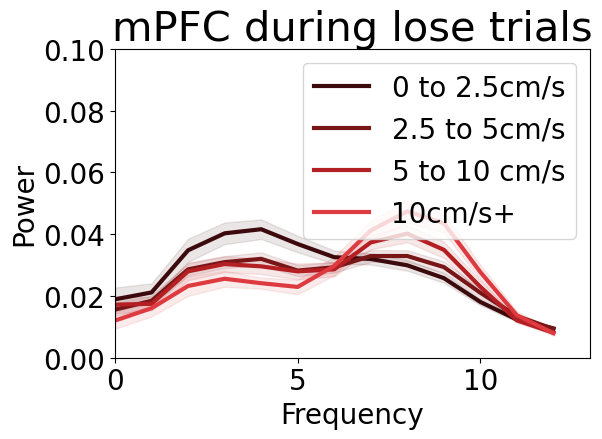

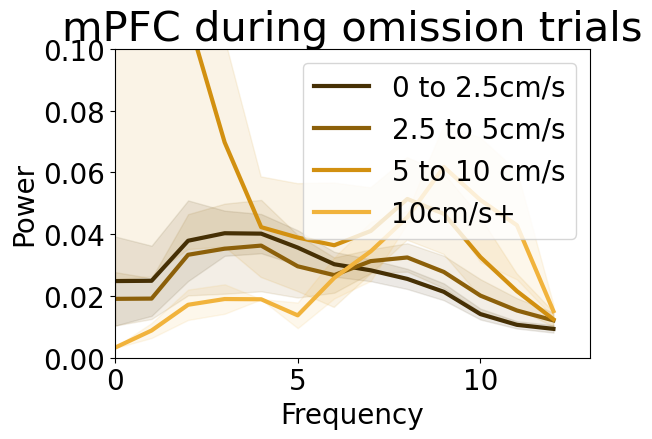

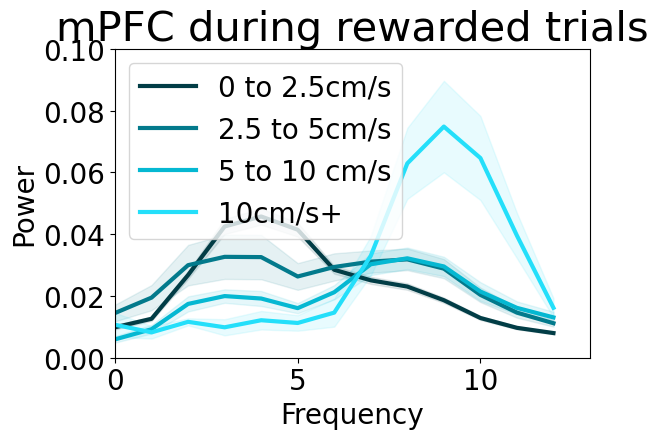

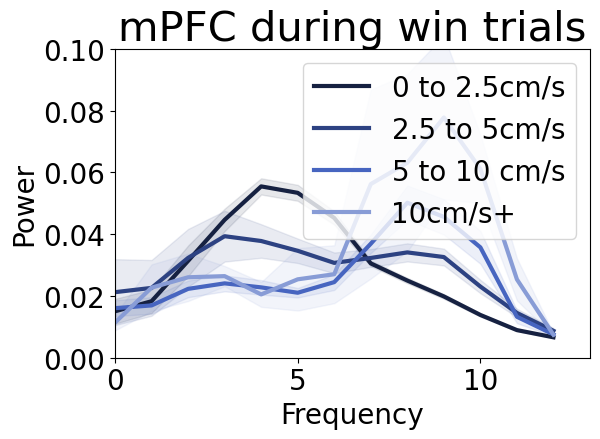

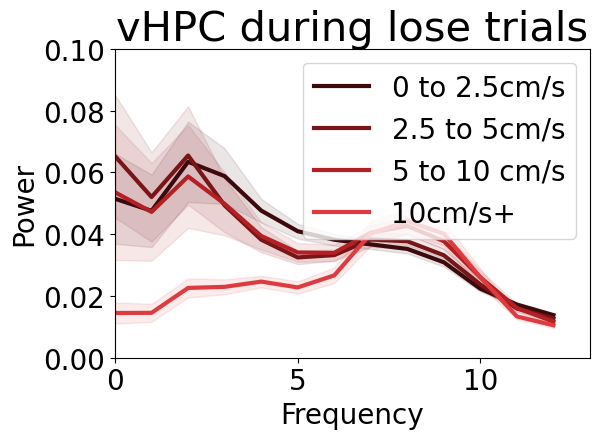

...

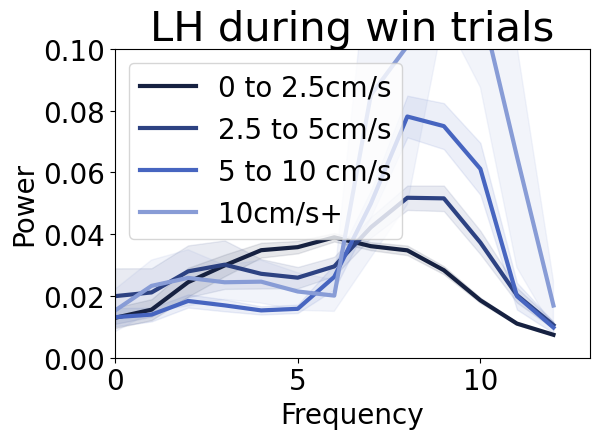

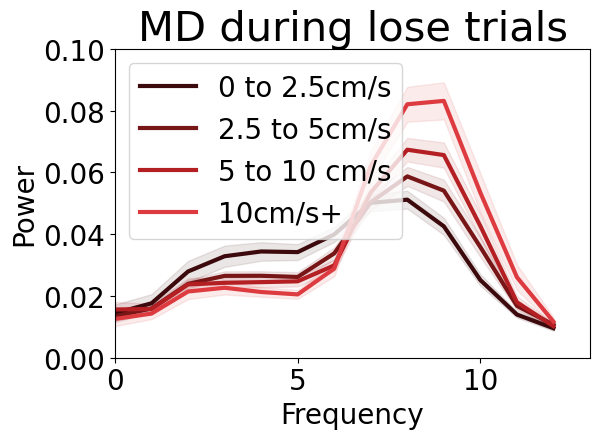

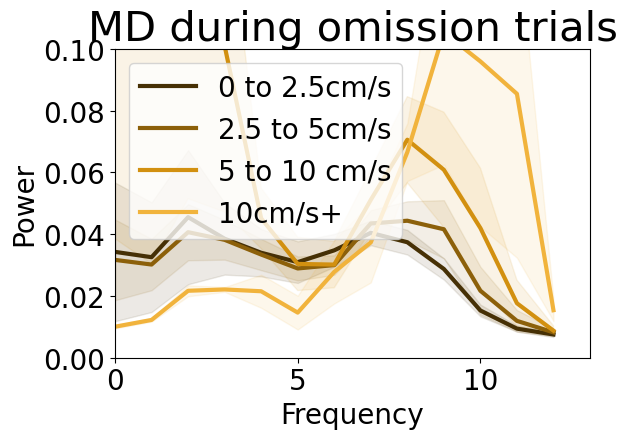

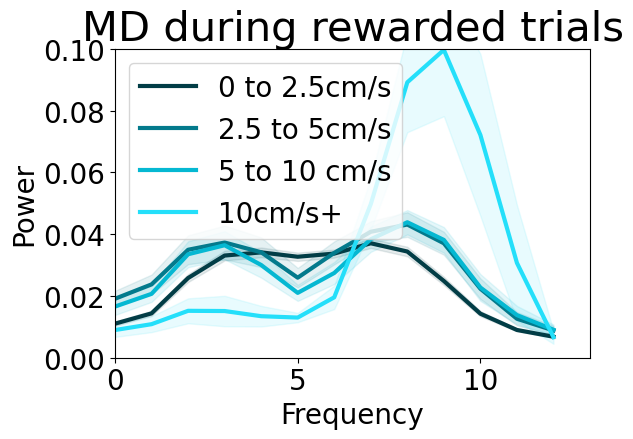

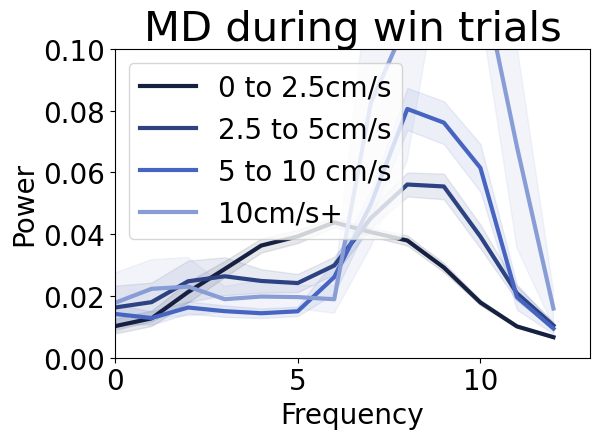

In [76]:
low_freq = 0
high_freq = 13
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("{} during {} trials".format(region.split("_")[0], outcome), fontsize=30)
        plt.xlabel("Frequency", fontsize=20)
        plt.ylabel("Power", fontsize=20)
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.1)
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
                
        plt.legend()
        plt.tight_layout()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

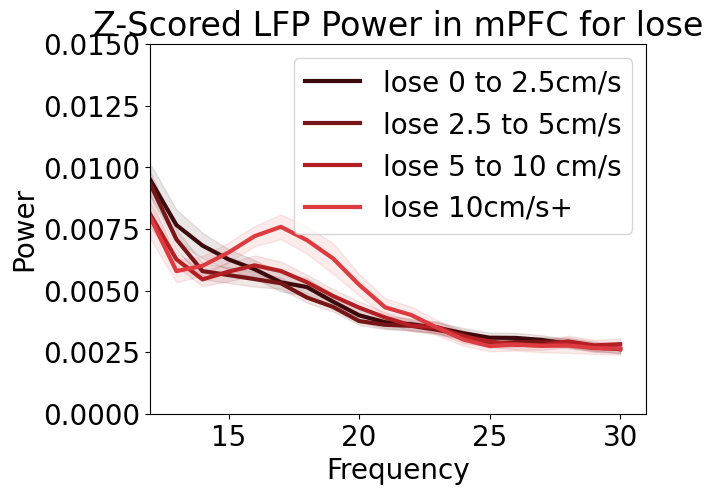

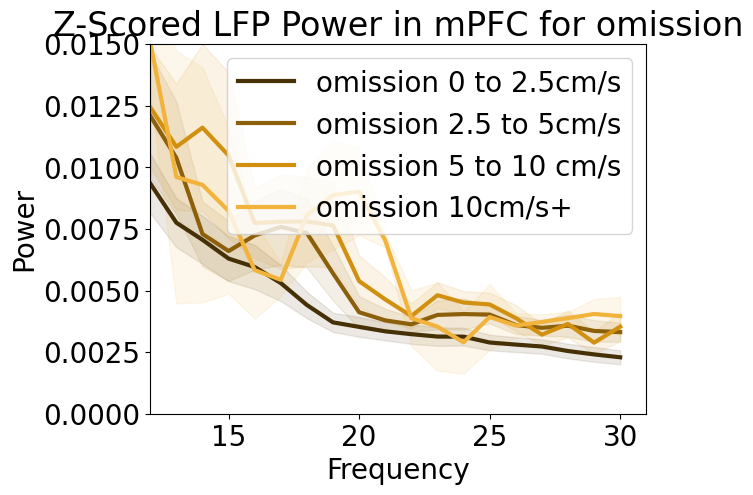

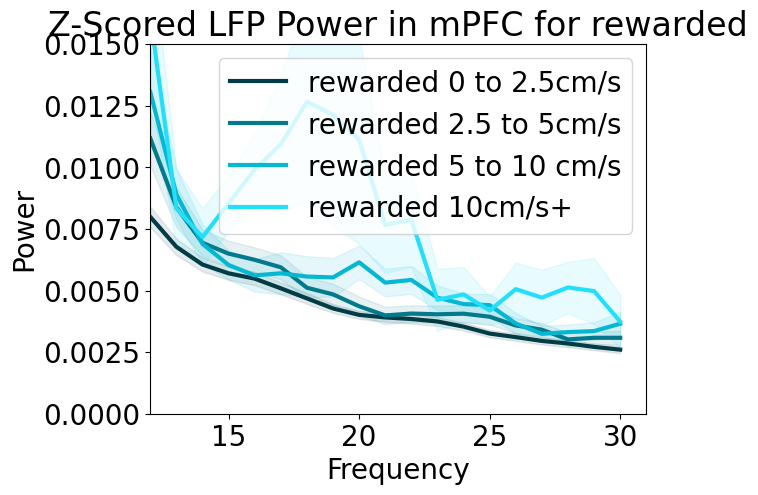

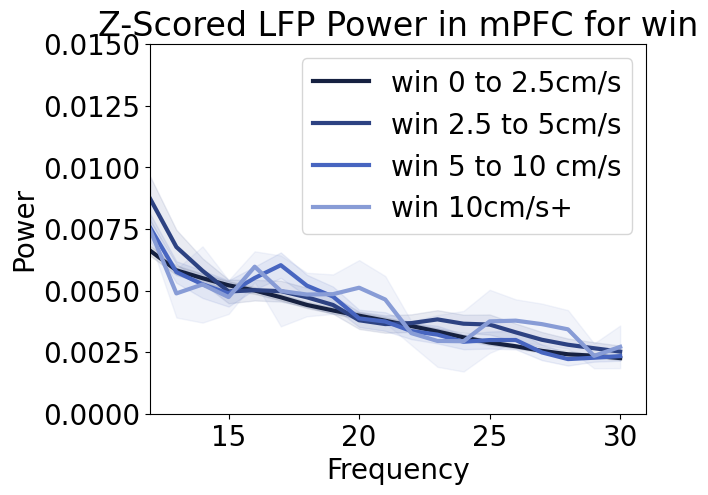

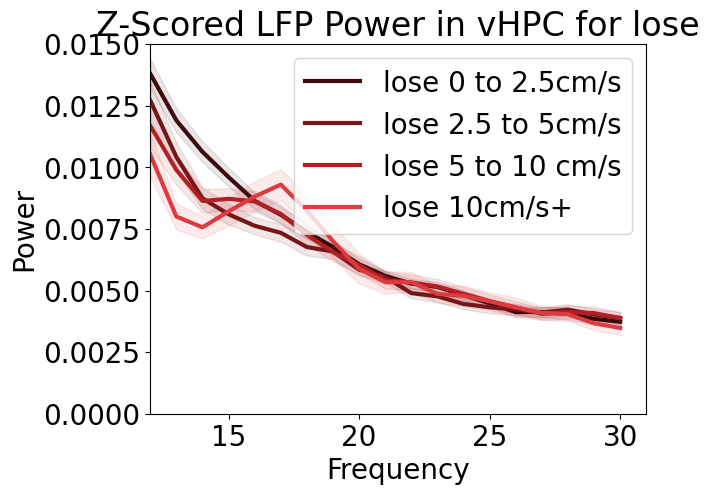

...

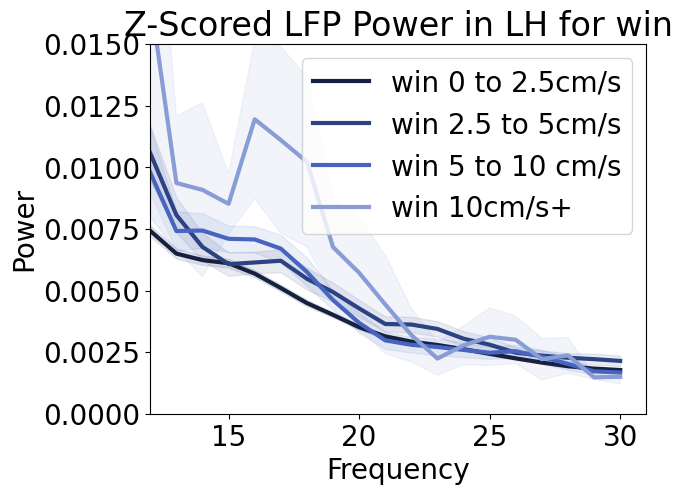

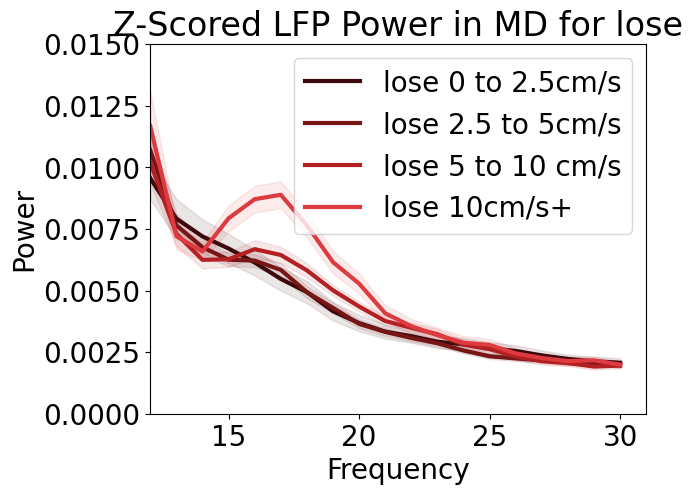

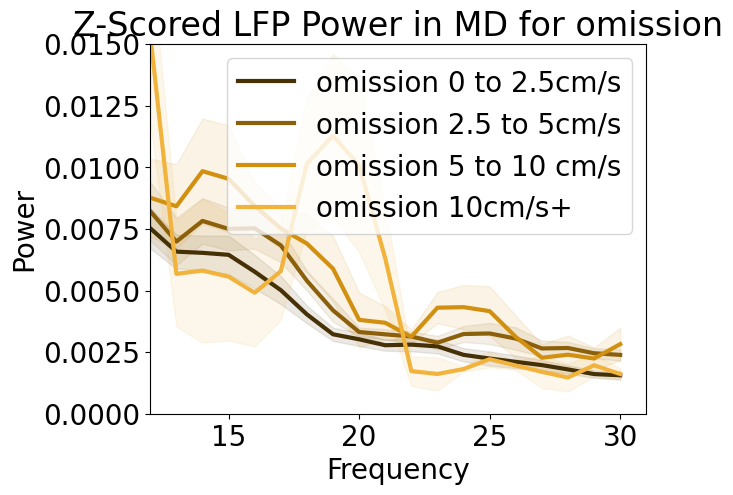

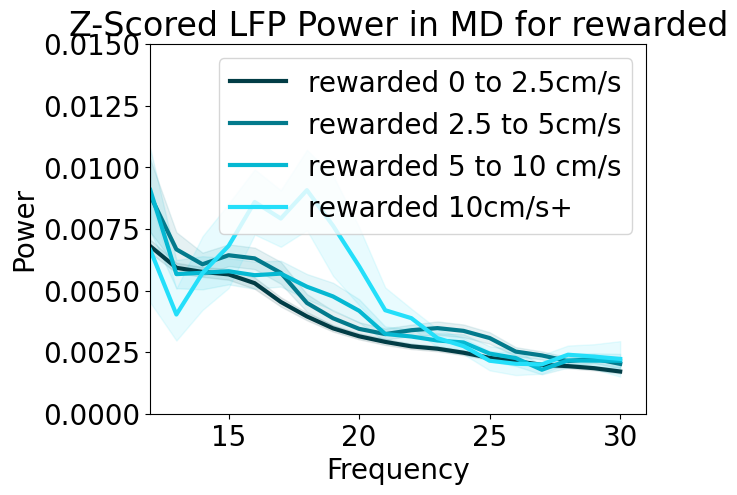

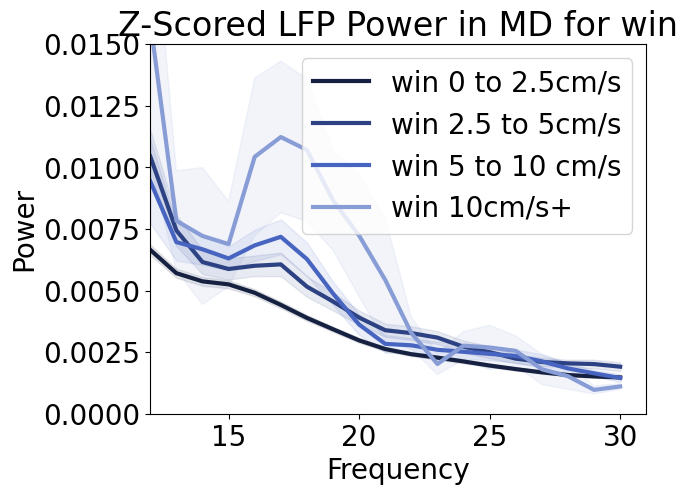

In [77]:
low_freq = 12
high_freq = 31
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("Z-Scored LFP Power in {} for {}".format(region.split("_")[0], outcome))
        plt.xlabel("Frequency")
        plt.ylabel("Power")
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.015)
        
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{} {}".format(outcome, BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
        plt.legend()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

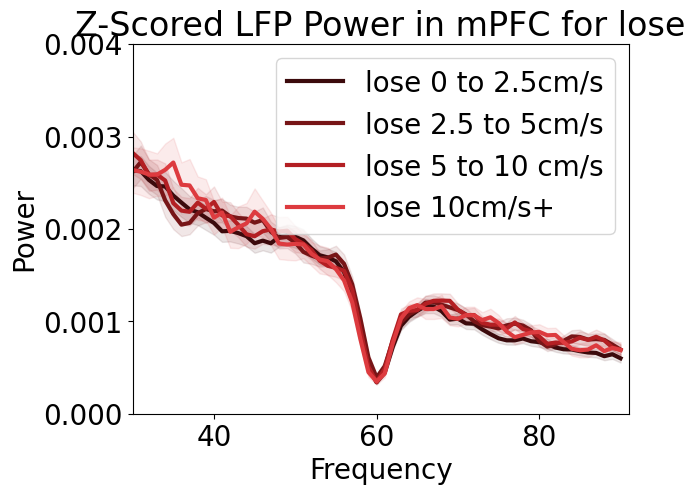

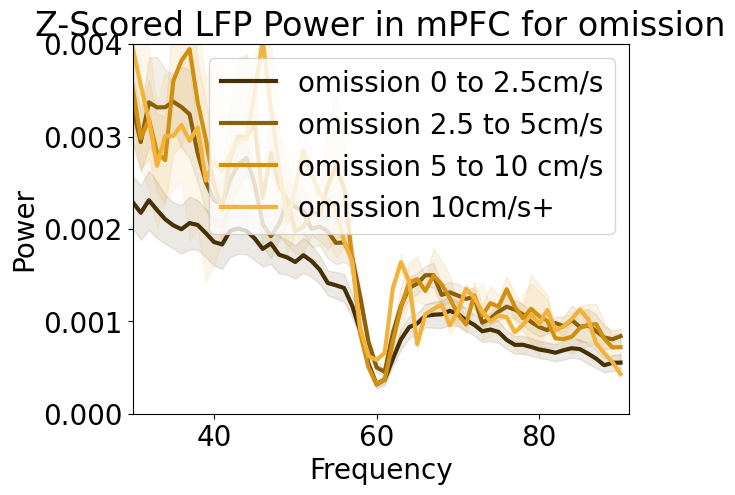

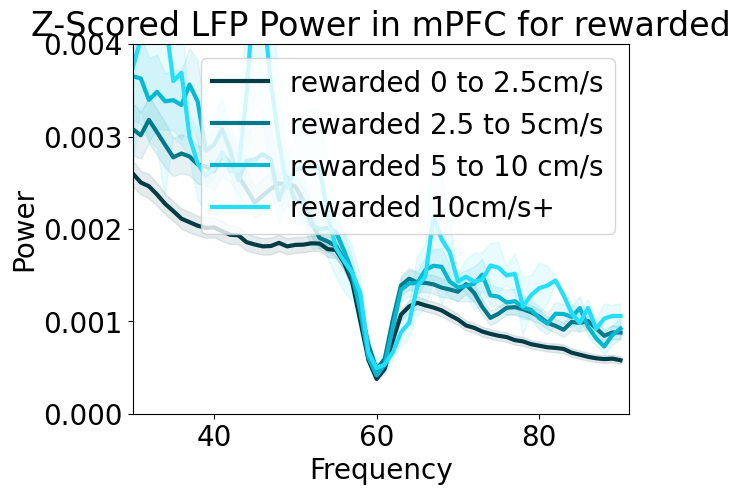

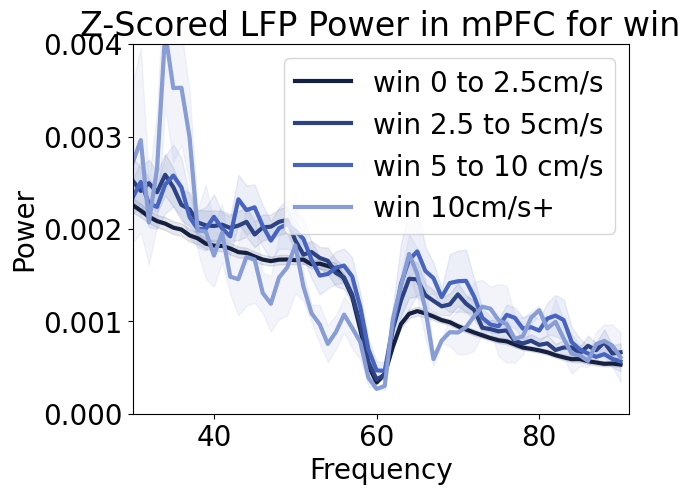

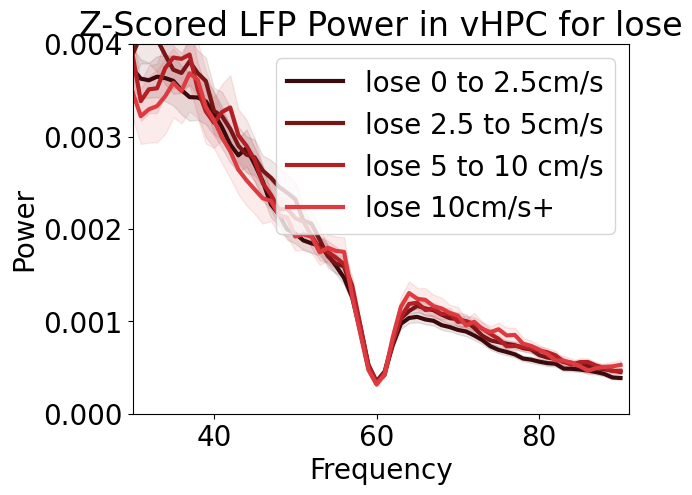

...

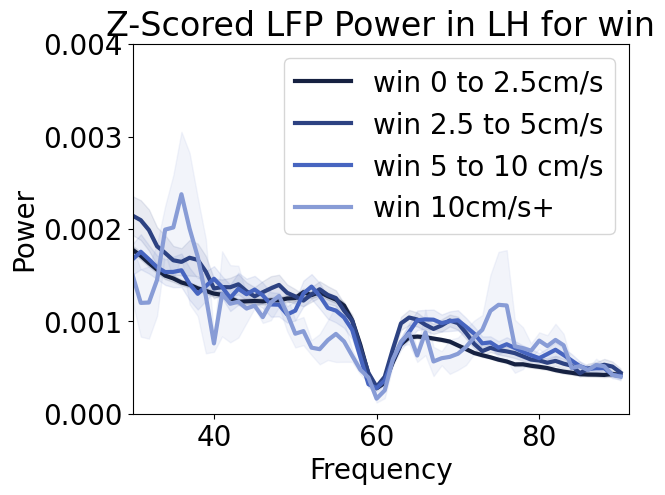

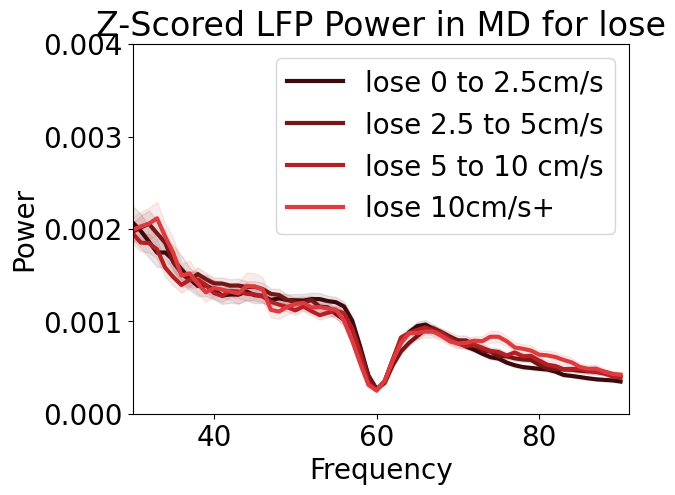

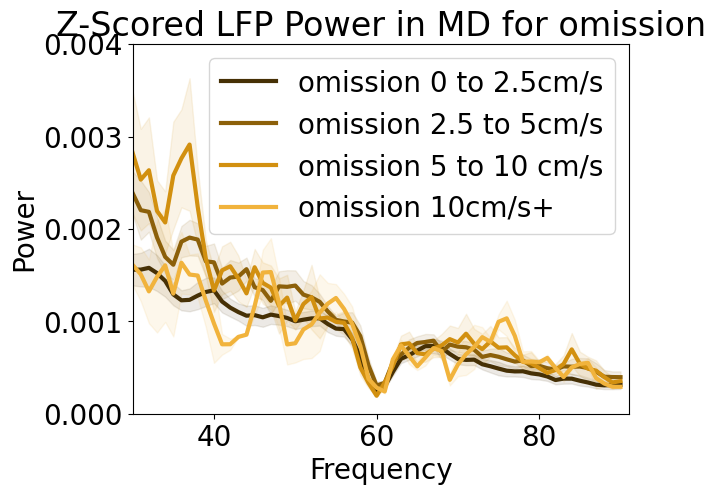

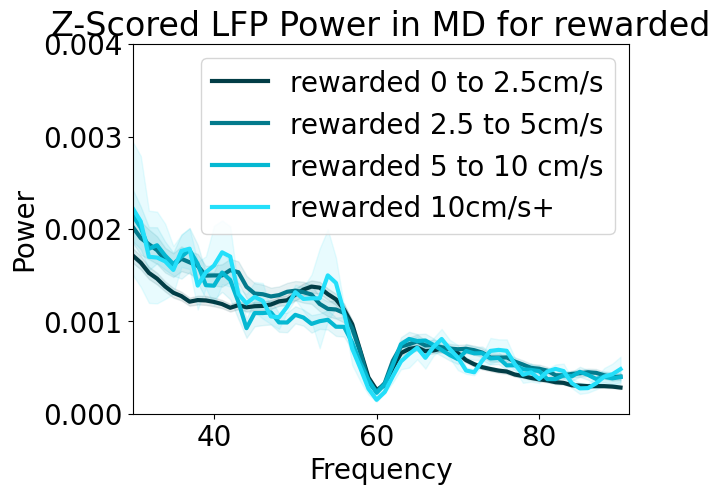

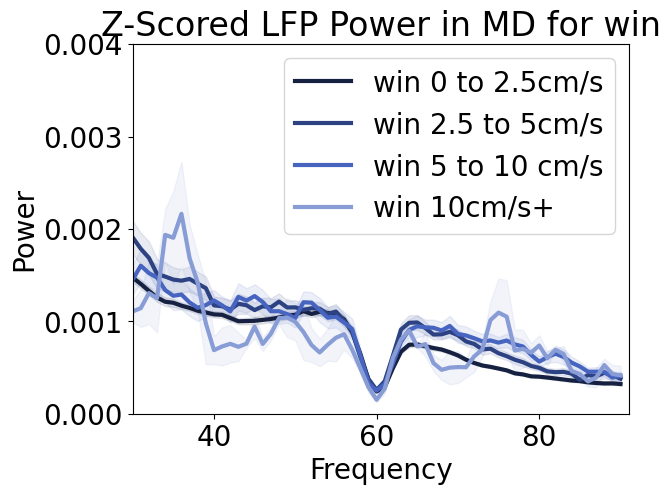

In [78]:
low_freq = 30
high_freq = 91
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("Z-Scored LFP Power in {} for {}".format(region.split("_")[0], outcome))
        plt.xlabel("Frequency")
        plt.ylabel("Power")
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.004)
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{} {}".format(outcome, BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
        plt.legend()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

# Plotting be velocity

In [79]:
grouped_all_trials_df = VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.groupby(['velocity_bin']).agg({k: lambda x: np.vstack([arr for arr in x.tolist() if not np.any(np.isnan(arr))]) for k in window_averaged_power_columns}).reset_index()

In [80]:
grouped_all_trials_df = pd.melt(grouped_all_trials_df, id_vars =['velocity_bin'], value_vars =grouped_all_trials_df.drop(columns=["velocity_bin"]).columns, value_name="power", var_name="region_and_baseline_or_trial") 

In [81]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power
0,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01184616737558653, 0.012770974589945925, 0..."
1,1,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.026383808857725656, 0.026588256760259034, ..."
2,2,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01233082977460541, 0.013362115039107194, 0..."
3,3,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.0038768893574110865, 0.008629295082327591,..."
4,0,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.009499560274665666, 0.014429973866407146, ..."


In [82]:
grouped_all_trials_df["brain_region"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [83]:
grouped_all_trials_df["trial_or_baseline"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [84]:
grouped_all_trials_df["mean_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanmean(np.vstack(x), axis=0))

In [85]:
grouped_all_trials_df["std_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanstd(np.vstack(x), axis=0))

In [86]:
grouped_all_trials_df["n_trials"] = grouped_all_trials_df["power"].apply(lambda x: np.sum(~np.isnan(x), axis=0))

In [87]:
grouped_all_trials_df["sem_power"] = grouped_all_trials_df.apply(lambda x: x["std_power"] / np.sqrt(x["n_trials"]), axis=1)

In [88]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01184616737558653, 0.012770974589945925, 0...",mPFC,baseline,"[0.01716372531462785, 0.02110468707363111, 0.0...","[0.04986926752840488, 0.0479476439271664, 0.05...","[274, 274, 274, 274, 274, 274, 274, 274, 274, ...","[0.0030127126292102575, 0.0028966231019529713,..."
1,1,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.026383808857725656, 0.026588256760259034, ...",mPFC,baseline,"[0.0253289921217797, 0.028111581323687847, 0.0...","[0.1393977752967519, 0.14096781053660618, 0.14...","[191, 191, 191, 191, 191, 191, 191, 191, 191, ...","[0.010086469023898894, 0.01020007278679617, 0...."
2,2,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01233082977460541, 0.013362115039107194, 0...",mPFC,baseline,"[0.04244500688407389, 0.042694920173586885, 0....","[0.32249844233983127, 0.2974572742253824, 0.28...","[130, 130, 130, 130, 130, 130, 130, 130, 130, ...","[0.02828498450681746, 0.02608872877605817, 0.0..."
3,3,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.0038768893574110865, 0.008629295082327591,...",mPFC,baseline,"[0.011824309896233318, 0.014455155112240393, 0...","[0.014529483712178158, 0.011752033464352192, 0...","[59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 5...","[0.0018915776616020925, 0.0015299844385342108,..."
4,0,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.009499560274665666, 0.014429973866407146, ...",vHPC,baseline,"[0.030154301668804555, 0.031316869334454905, 0...","[0.09435696010981681, 0.08298823281193032, 0.0...","[274, 274, 274, 274, 274, 274, 274, 274, 274, ...","[0.005700312426181454, 0.005013502492811543, 0..."


# Drawing all velocity bins together for each trial outcome

In [89]:
OUTCOME_TO_COLOR

{'lose': '#951a1d',
 'omission': '#af780d',
 'rewarded': '#0499af',
 'win': '#3853a3'}

In [90]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01184616737558653, 0.012770974589945925, 0...",mPFC,baseline,"[0.01716372531462785, 0.02110468707363111, 0.0...","[0.04986926752840488, 0.0479476439271664, 0.05...","[274, 274, 274, 274, 274, 274, 274, 274, 274, ...","[0.0030127126292102575, 0.0028966231019529713,..."
1,1,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.026383808857725656, 0.026588256760259034, ...",mPFC,baseline,"[0.0253289921217797, 0.028111581323687847, 0.0...","[0.1393977752967519, 0.14096781053660618, 0.14...","[191, 191, 191, 191, 191, 191, 191, 191, 191, ...","[0.010086469023898894, 0.01020007278679617, 0...."
2,2,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01233082977460541, 0.013362115039107194, 0...",mPFC,baseline,"[0.04244500688407389, 0.042694920173586885, 0....","[0.32249844233983127, 0.2974572742253824, 0.28...","[130, 130, 130, 130, 130, 130, 130, 130, 130, ...","[0.02828498450681746, 0.02608872877605817, 0.0..."
3,3,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.0038768893574110865, 0.008629295082327591,...",mPFC,baseline,"[0.011824309896233318, 0.014455155112240393, 0...","[0.014529483712178158, 0.011752033464352192, 0...","[59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 5...","[0.0018915776616020925, 0.0015299844385342108,..."
4,0,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.009499560274665666, 0.014429973866407146, ...",vHPC,baseline,"[0.030154301668804555, 0.031316869334454905, 0...","[0.09435696010981681, 0.08298823281193032, 0.0...","[274, 274, 274, 274, 274, 274, 274, 274, 274, ...","[0.005700312426181454, 0.005013502492811543, 0..."


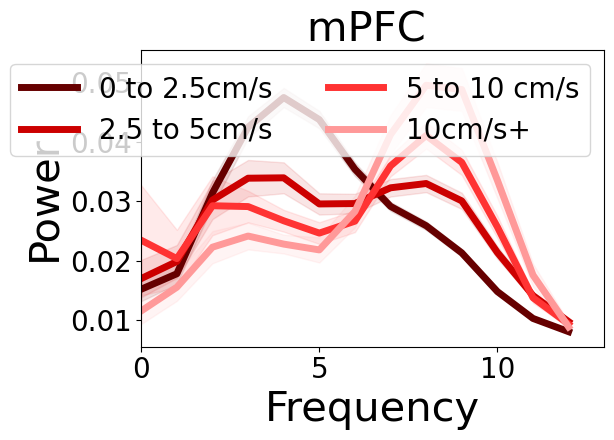

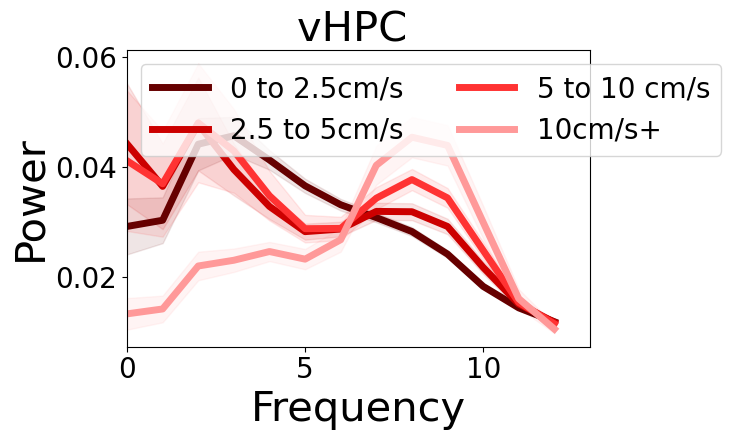

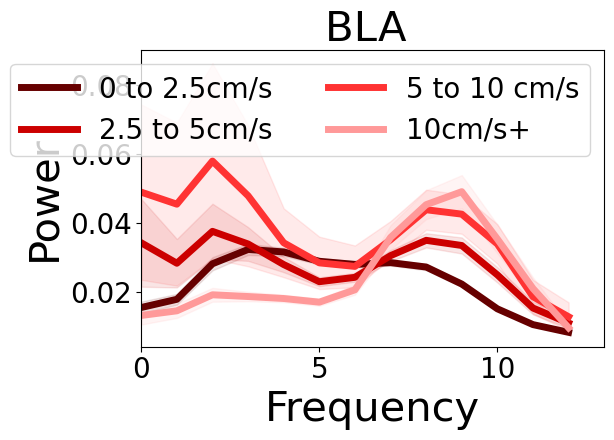

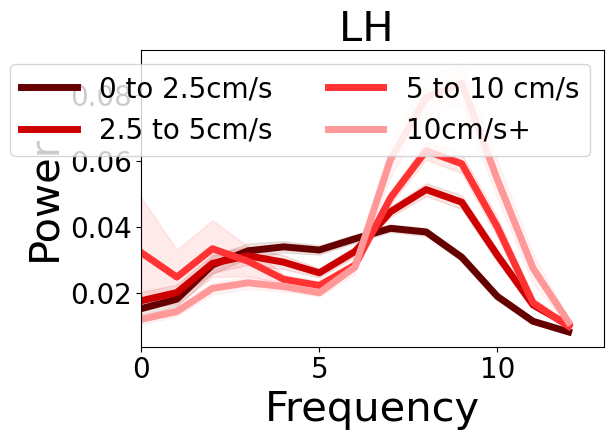

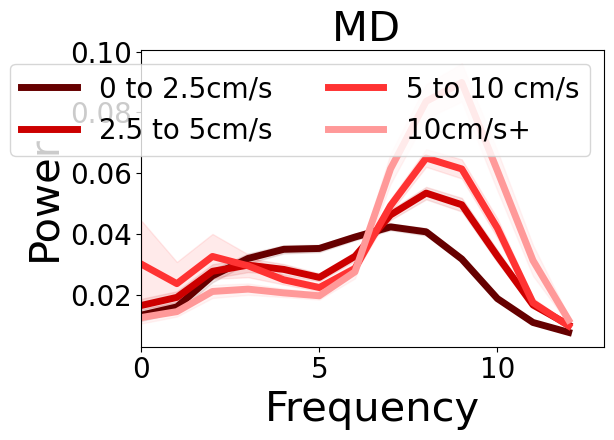

In [91]:
low_freq = 0
high_freq = 13
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("{} ".format(region.split("_")[0]), fontsize=30)
    plt.xlabel("Frequency", fontsize=30)
    plt.ylabel("Power", fontsize=30)
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.tight_layout()
    plt.legend(ncol=2)
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

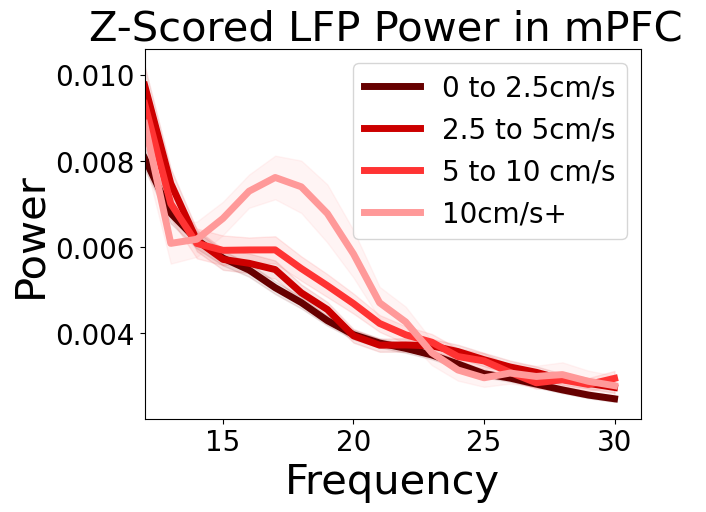

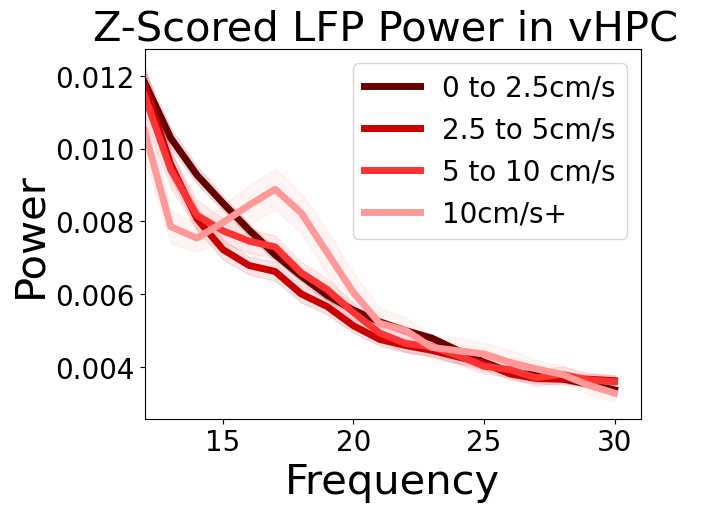

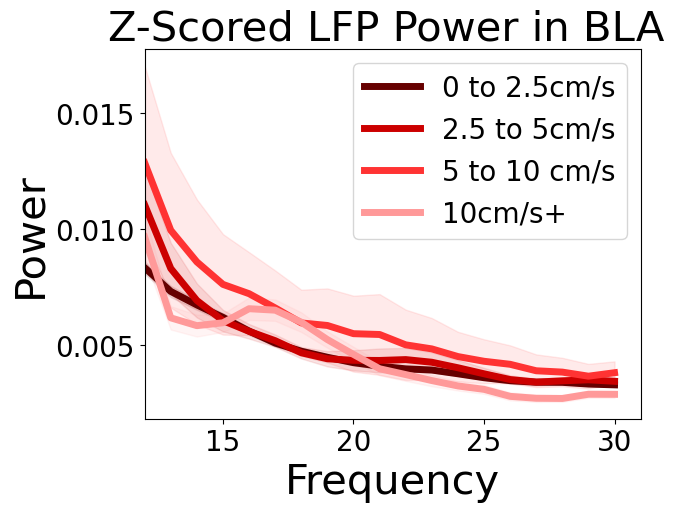

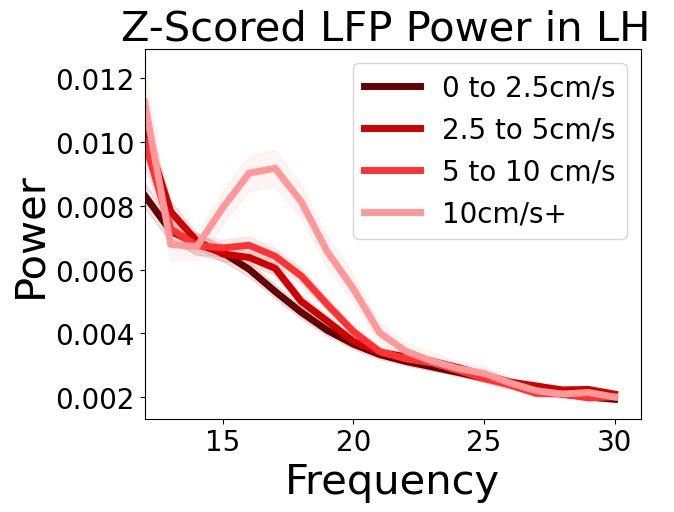

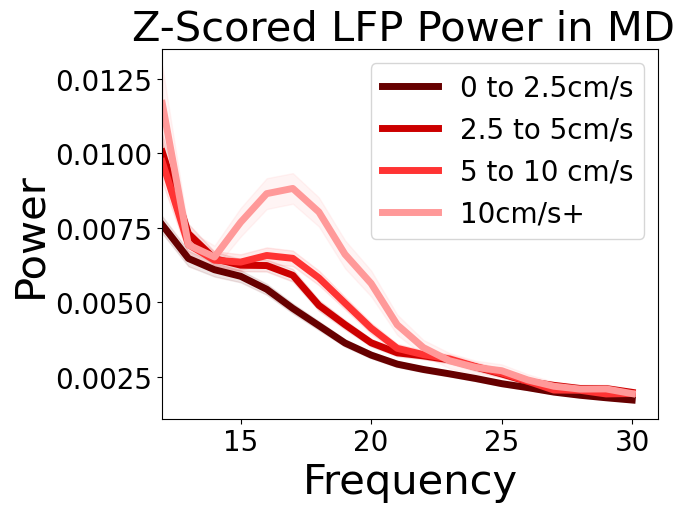

In [92]:
low_freq = 12
high_freq = 31
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("Z-Scored LFP Power in {} ".format(region.split("_")[0]), fontsize=30)
    plt.xlabel("Frequency", fontsize=30)
    plt.ylabel("Power", fontsize=30)
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.legend()
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

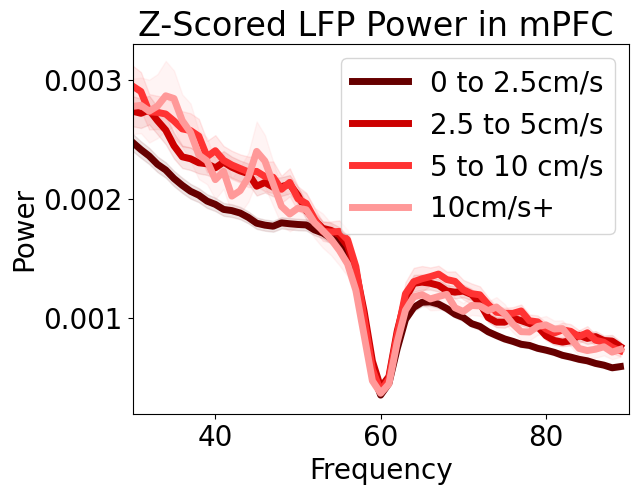

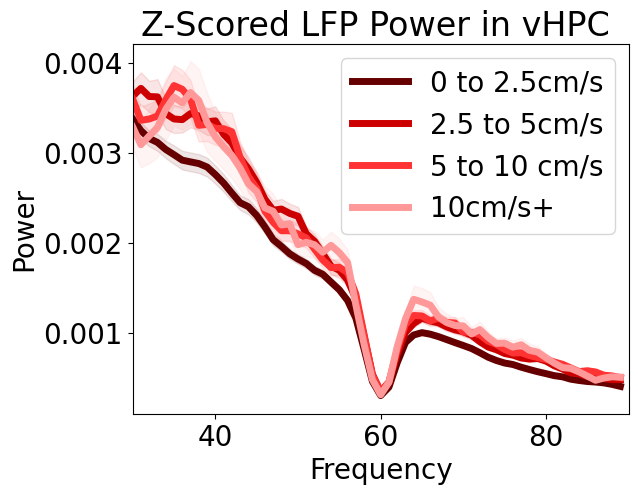

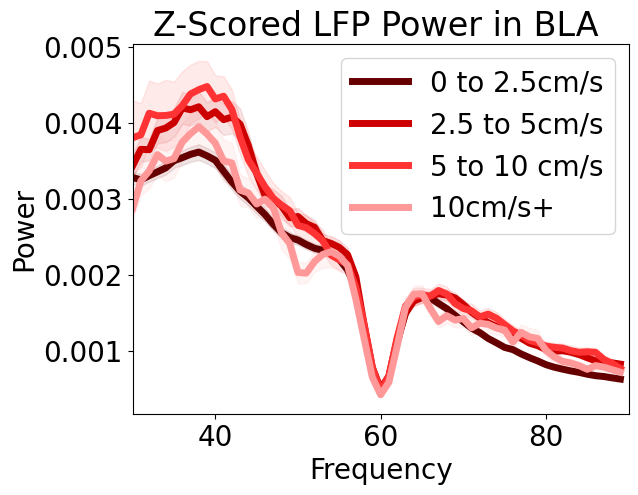

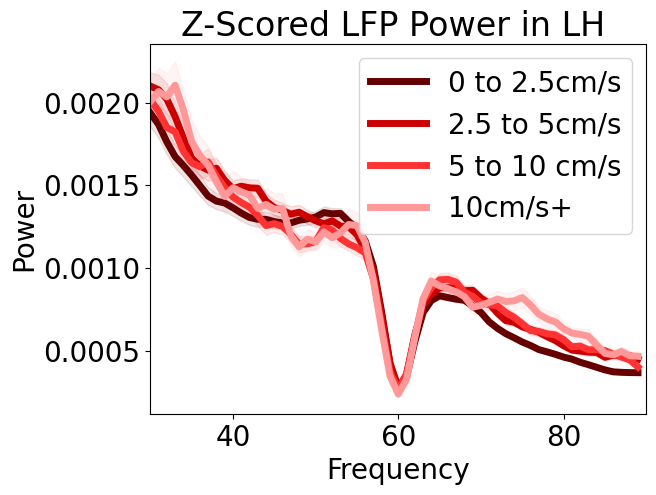

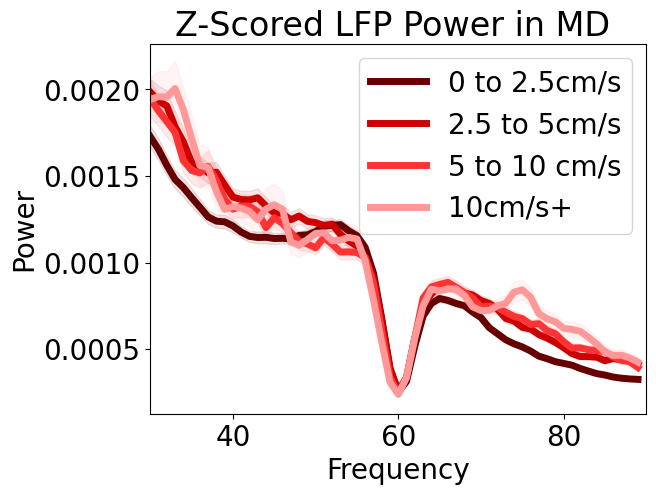

In [93]:
low_freq = 30
high_freq = 90
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("Z-Scored LFP Power in {} ".format(region.split("_")[0]))
    plt.xlabel("Frequency")
    plt.ylabel("Power")
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.legend()
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

# Parse power by lower velocity

In [94]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,mPFC_baseline_all_window_averaged_power,vHPC_baseline_all_window_averaged_power,BLA_baseline_all_window_averaged_power,LH_baseline_all_window_averaged_power,MD_baseline_all_window_averaged_power,mPFC_trial_all_window_averaged_power,vHPC_trial_all_window_averaged_power,BLA_trial_all_window_averaged_power,LH_trial_all_window_averaged_power,MD_trial_all_window_averaged_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[0.01579940523904916, 0.0165626647529655, 0.02...","[0.007338252748333259, 0.01089563666395944, 0....","[0.013091607841038322, 0.014117608416465038, 0...","[0.022964455789557244, 0.022290898817971163, 0...","[0.02557420165245759, 0.02654039943079886, 0.0...","[0.013578532216685993, 0.01736326663715145, 0....","[0.005884176938003947, 0.01262773509768471, 0....","[0.016782418918595676, 0.015240122116290227, 0...","[0.03241093477294236, 0.03003938250305729, 0.0...","[0.02394606557277414, 0.024972355567400052, 0...."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[0.01043973810516993, 0.011995901256217315, 0....","[0.006520190897142798, 0.009908554975019851, 0...","[0.006274318131038264, 0.00691078513224769, 0....","[0.01052940561515397, 0.011517583637301586, 0....","[0.013189469018915191, 0.012605535448486686, 0...","[0.005072513655663902, 0.0071730776351884, 0.0...","[0.017807810758419772, 0.02051735783988241, 0....","[0.0075150800916258895, 0.012030467854449603, ...","[0.003644272984766944, 0.005808118645131345, 0...","[0.006489759161394153, 0.007582477136466669, 0..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[0.005078069620033379, 0.007847947527141026, 0...","[0.013600617428570527, 0.019533499354359572, 0...","[0.006141355758002356, 0.009303619594021637, 0...","[0.007468537947027687, 0.010884286729309219, 0...","[0.004814152657455484, 0.00618421896792938, 0....","[0.01043389231412404, 0.011229291113011746, 0....","[0.018798404711232963, 0.024949532187259045, 0...","[0.009525639680784495, 0.010941343792716796, 0...","[0.016095087975310174, 0.015224296452442521, 0...","[0.011809376046566988, 0.010816138136563104, 0..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[0.008870300252232993, 0.009661322703319016, 0...","[0.01636629887281683, 0.024804479917894477, 0....","[0.00689989260430601, 0.009437438029868149, 0....","[0.010951516062517489, 0.010717930878165088, 0...","[0.008629680530200008, 0.008992947836672616, 0...","[0.006360855718027482, 0.007822405773560854, 0...","[0.0164348816792982, 0.02

In [95]:

MERGED_LFP_AND_SLEAP["binned_trial_velocity_mask"] = MERGED_LFP_AND_SLEAP["trial_chunked_thorax_velocity"].apply(lambda x: [index for index, num in enumerate(x) if MIN_VELOCITY <= num <= MAX_VELOCITY])

MERGED_LFP_AND_SLEAP["binned_baseline_velocity_mask"] = MERGED_LFP_AND_SLEAP["binned_baseline_thorax_velocity"].apply(lambda x: [index for index, num in enumerate(x) if MIN_VELOCITY <= num <= MAX_VELOCITY])

for col in baseline_windowed_power_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_velocity_parsed_window_averaged_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["binned_baseline_velocity_mask"]]), axis=0), axis=1)

for col in trial_windowed_power_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_velocity_parsed_window_averaged_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["binned_trial_velocity_mask"]]), axis=0), axis=1)



In [96]:
for col in MERGED_LFP_AND_SLEAP.columns:
    print(col)

time
recording_file
video_number
current_subject
mPFC_baseline_lfp_trace
mPFC_trial_lfp_trace
vHPC_baseline_lfp_trace
vHPC_trial_lfp_trace
BLA_baseline_lfp_trace
BLA_trial_lfp_trace
LH_baseline_lfp_trace
LH_trial_lfp_trace
MD_baseline_lfp_trace
MD_trial_lfp_trace
recording_dir
time_stamp_index
video_file
video_frame
subject_info
competition_closeness
video_name
all_subjects
trial_outcome
lfp_index
baseline_lfp_timestamp_range
trial_lfp_timestamp_range
baseline_ephys_timestamp_range
trial_ephys_timestamp_range
baseline_videoframe_range
trial_videoframe_range
trial_number
Cohort
spike_interface_mPFC
spike_interface_vHPC
spike_interface_BLA
spike_interface_LH
spike_interface_MD
file_path
start_frame
stop_frame
individual_subj
all_subj
recording_name
track_names
subject_id
corner_path
corner_parts
bottom_width
top_width
right_height
left_height
average_height
average_width
width_ratio
height_ratio
rescaled_locations
box_bottom_left
reward_port
box_top_left
box_top_right
box_bottom_right
ba

In [97]:
VELCOITY_PARSED_MERGED_LFP_AND_SLEAP["trial_outcome"]

0            win
1            win
2            win
3            win
4            win
          ...   
1107    rewarded
1108    rewarded
1109    rewarded
1110    omission
1111    rewarded
Name: trial_outcome, Length: 1112, dtype: object

In [98]:
grouped_all_trials_df = VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.groupby(['trial_outcome']).agg({k: lambda x: np.vstack([arr for arr in x.tolist() if not np.any(np.isnan(arr))]) for k in window_averaged_power_columns}).reset_index()

In [99]:
grouped_all_trials_df = pd.melt(grouped_all_trials_df, id_vars =['trial_outcome'], value_vars =grouped_all_trials_df.drop(columns=["trial_outcome"]).columns, value_name="power", var_name="region_and_baseline_or_trial") 

In [100]:
grouped_all_trials_df.head()

,trial_outcome,region_and_baseline_or_trial,power
0,lose,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.020090183352770068, 0.025215370983250298, ..."
1,omission,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.015192233263166573, 0.014732912277589506, ..."
2,rewarded,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.010880610200678887, 0.012872963883461548, ..."
3,win,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01184616737558653, 0.012770974589945925, 0..."
4,lose,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.006725289690030837, 0.0089715624098118, 0...."


In [101]:
grouped_all_trials_df["brain_region"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [102]:
grouped_all_trials_df["trial_or_baseline"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [103]:
grouped_all_trials_df["mean_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanmean(np.vstack(x), axis=0))

In [104]:
grouped_all_trials_df["std_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanstd(np.vstack(x), axis=0))

In [105]:
grouped_all_trials_df["n_trials"] = grouped_all_trials_df["power"].apply(lambda x: np.sum(~np.isnan(x), axis=0))

In [106]:
grouped_all_trials_df["sem_power"] = grouped_all_trials_df.apply(lambda x: x["std_power"] / np.sqrt(x["n_trials"]), axis=1)

In [107]:
grouped_all_trials_df

,trial_outcome,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,lose,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.020090183352770068, 0.025215370983250298, ...",mPFC,baseline,"[0.016067875032409612, 0.020779319258450227, 0...","[0.028586199771965647, 0.0376162070383374, 0.0...","[238, 238, 238, 238, 238, 238, 238, 238, 238, ...","[0.0018529681134394165, 0.0024382965468159436,..."
1,omission,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.015192233263166573, 0.014732912277589506, ...",mPFC,baseline,"[0.009232686653882048, 0.012195208475652515, 0...","[0.006790354127538713, 0.007651957570346496, 0...","[33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3...","[0.0011820489296310369, 0.0013320348373183747,..."
2,rewarded,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.010880610200678887, 0.012872963883461548, ...",mPFC,baseline,"[0.051988971301112824, 0.05246620127367697, 0....","[0.3152235340317994, 0.29564953592947435, 0.29...","[177, 177, 177, 177, 177, 177, 177, 177, 177, ...","[0.023693651728801658, 0.022222379936226905, 0..."
3,win,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01184616737558653, 0.012770974589945925, 0...",mPFC,baseline,"[0.011773313459644478, 0.014178410565724588, 0...","[0.00901622204931322, 0.007649804058918778, 0....","[206, 206, 206, 206, 206, 206, 206, 206, 206, ...","[0.0006281899565940545, 0.0005329871040710732,..."
4,lose,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.006725289690030837, 0.0089715624098118, 0....",vHPC,baseline,"[0.05457781554178348, 0.053976610740259424, 0....","[0.14542765717143596, 0.14184273313990506, 0.1...","[238, 238, 238, 238, 238, 238, 238, 238, 238, ...","[0.009426674888599242, 0.009194298778010245, 0..."
5,omission,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.012895100722296396, 0.014255101965679392, ...",vHPC,baseline,"[0.008782342151765831, 0.01311433375854241, 0....","[0.005570371309528848, 0.00749894123783957, 0....","[33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3...","[0.0009696771803656528, 0.0013053981128326316,..."
6,rewarded,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.01261724894019493, 0.016525112853526935, 0...",vHPC,baseline,"[0.015564909234416618, 0.018820918701839214, 0...","[0.024793840429428123, 0.025083963588647177, 0...","[177, 177, 177, 177, 177, 177, 177, 177, 177, ...","[0.00186361916777156, 0.0018854261597974235, 0..."
7,win,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.009499560274665666, 0.014429973866407146, ...",vHPC,baseline,"[0.03826535266947958, 0.03374200043322782, 0.0...","[0.16882864738782014, 0.10995937422980648, 0.1...","[206, 206, 206, 206, 206, 206, 206, 206, 206, ...","[0.011762849239329257, 0.00766123262567531, 0...."
8,lose,BLA_baseline_velocity_parsed_window_averaged_p...,"[[0.018653623960841585, 0.014598796949669235, ...",BLA,baseline,"[0.0231432576091694, 0.025435169118295905, 0.0...","[0.04621886507002608, 0.04444766715240784, 0.0...","[238, 238, 238, 238, 238, 238, 238, 238, 238, ...","[0.0029959240436745974, 0.002881114335139799, ..."
9,omission,BLA_baseline_velocity_parsed_window_averaged_p...,"[[0.007351877686155776, 0.008403604752082421, ...",BLA,baseline,"[0.008527673083805573, 0.011590750247142626, 0...","[0.004546515169526778, 0.005638371528962155, 0...","[33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3...","[0.0007914467034782438, 0.000981514499169076, ..."


In [108]:
OUTCOME_TO_COLOR

{'lose': '#951a1d',
 'omission': '#af780d',
 'rewarded': '#0499af',
 'win': '#3853a3'}

In [110]:
FONTSIZE=20

In [111]:
font = {'weight' : 'medium',
        'size'   : 15}

matplotlib.rc('font', **font)

In [112]:
BAND_TO_FREQ

{'theta': (6, 11), 'beta': (20, 31), 'gamma': (30, 51)}

In [113]:
BAND_TO_FREQ_PLOT = {'theta': (6, 10), 'beta': (20, 30), 'gamma': (30, 50)}
BAND_TO_FREQ_COLOR = {'theta': "red", 'beta': "blue", 'gamma': "green"}

BAND_TO_FREQ_PLOT = {'theta': (6, 10), 'gamma': (30, 50)}
BAND_TO_FREQ_COLOR = {'theta': "red", 'gamma': "green"}

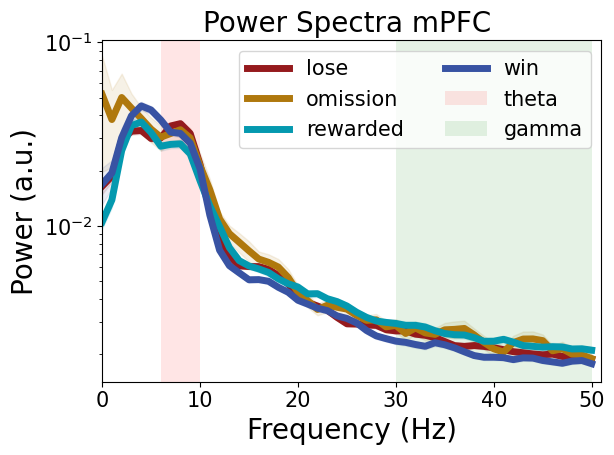

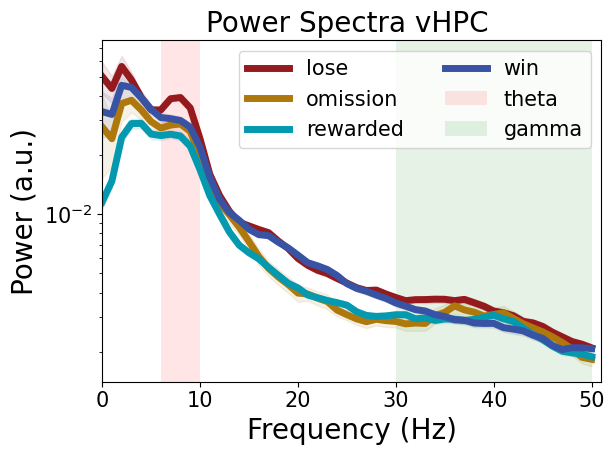

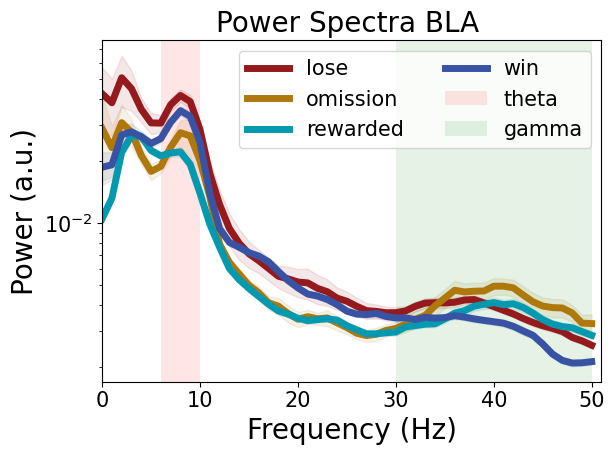

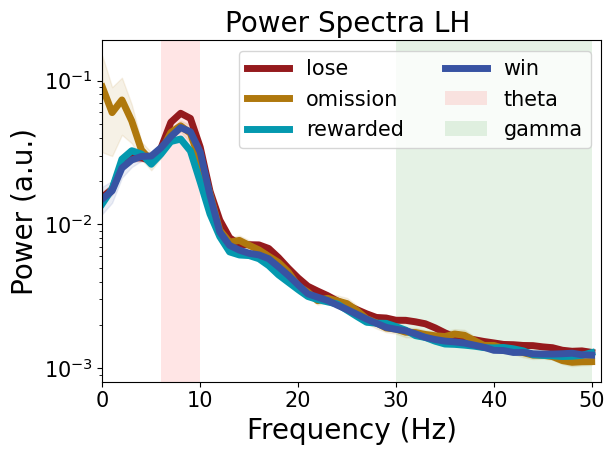

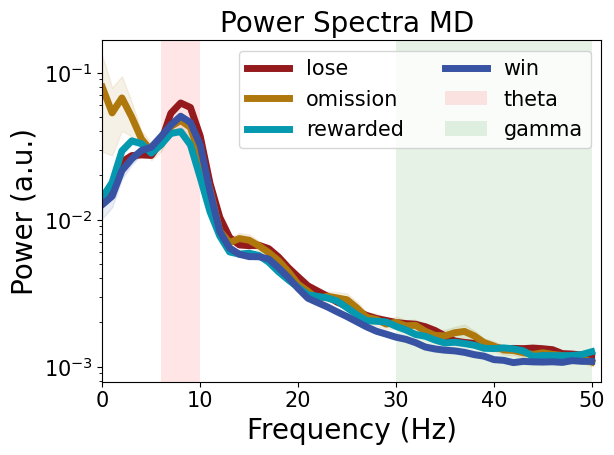

In [114]:
low_freq = 0
high_freq = 51
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("Power Spectra {} ".format(region.split("_")[0]), fontsize=FONTSIZE)
    plt.xlabel("Frequency (Hz)", fontsize=FONTSIZE)
    plt.ylabel("Power (a.u.)", fontsize=FONTSIZE)
    plt.xlim(low_freq, high_freq) 
    plt.yscale("log")
        
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(row["trial_outcome"]), linewidth=5, color=OUTCOME_TO_COLOR[row["trial_outcome"]])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=OUTCOME_TO_COLOR[row["trial_outcome"]])
        
        except Exception as e: 
            print(e)
            continue
    for band, (min_freq, max_freq) in BAND_TO_FREQ_PLOT.items():
        ax.axvspan(min_freq, max_freq, facecolor=BAND_TO_FREQ_COLOR[band], alpha=0.1, label=band)
    plt.legend(fontsize=15, ncol=2)


    plt.tight_layout()
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

# Exporting Velocity Parsed dataframe for plotting

In [115]:
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP = VELCOITY_PARSED_MERGED_LFP_AND_SLEAP[VELCOITY_PARSED_MERGED_LFP_AND_SLEAP["velocity_bin"] == 0].copy()

In [116]:
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP = EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.drop(columns=[col for col in EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "baseline" in col], errors="ignore")

In [117]:
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP = EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.drop(columns=[col for col in EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "trace" in col], errors="ignore")

In [118]:
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP = pd.melt(EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP, id_vars=EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.columns[:19], value_vars=[col for col in EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "velocity_parsed_window_averaged_power" in col], value_name="power", var_name="region_and_baseline_or_trial")




In [119]:
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP["brain_region"] = EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP["region_and_baseline_or_trial"].apply(lambda x:x.split("_")[0])
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP["trial_or_baseline"] = EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP["region_and_baseline_or_trial"].apply(lambda x:x.split("_")[1])

In [120]:
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP = EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.dropna(subset=["power"])

In [121]:
for band, (min_freq, max_freq) in BAND_TO_FREQ.items():
    EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP["mean_{}_power".format(band)] = EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP["power"].apply(lambda x: np.nanmean(x[min_freq:max_freq]))

In [122]:
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.to_pickle("./proc/rce_velocity_parsed_power_spectra_region_and_baselinetrial_rows.pkl")

In [123]:
EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP

,time,recording_file,video_number,current_subject,recording_dir,time_stamp_index,video_file,video_frame,subject_info,competition_closeness,...,trial_videoframe_range,trial_number,Cohort,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_theta_power,mean_beta_power,mean_gamma_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,20221214_125409_om_and_comp_6_1_and_6_3,27998597,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,28574,6_1_top_1_base_2_vs_6_3,win_non_comp,...,"(28574, 28794)",15,1,mPFC_trial_velocity_parsed_window_averaged_power,"[0.01112484550257713, 0.015120199991768696, 0....",mPFC,trial,0.021245,0.002038,0.001821
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,20221214_125409_om_and_comp_6_1_and_6_3,29598593,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,30569,6_1_top_1_base_2_vs_6_3,win_non_comp,...,"(30569, 30789)",16,1,mPFC_trial_velocity_parsed_window_averaged_power,"[0.005072513655663902, 0.0071730776351884, 0.0...",mPFC,trial,0.028546,0.002436,0.001810
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,20221214_125409_om_and_comp_6_1_and_6_3,31398591,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,32813,6_1_top_1_base_2_vs_6_3,win_non_comp,...,"(32813, 33033)",17,1,mPFC_trial_velocity_parsed_window_averaged_power,"[0.01043389231412404, 0.011229291113011746, 0....",mPFC,trial,0.024992,0.002072,0.001553
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,20221214_125409_om_and_comp_6_1_and_6_3,32998593,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,34807,6_1_top_1_base_2_vs_6_3,win_non_comp,...,"(34807, 35027)",18,1,mPFC_trial_velocity_parsed_window_averaged_power,"[0.006360855718027482, 0.007822405773560854, 0...",mPFC,trial,0.030643,0.002407,0.001355
4,37450494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,20221214_125409_om_and_comp_6_1_and_6_3,34498591,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,36677,6_1_top_1_base_2_vs_6_3,win_non_comp,...,"(36677, 36897)",19,1,mPFC_trial_velocity_parsed_window_averaged_power,"[0.00866204042766737, 0.008177641470017987, 0....",mPFC,trial,0.028424,0.002074,0.001550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1385,65281838,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,20230621_111240_standard_comp_to_omission_D5_s...,62088794,20230621_111240_standard_comp_to_omission_D5_s...,62056,1-4_t3b3L_box1,rewarded,...,"(62056, 62276)",36,2,MD_trial_velocity_parsed_window_averaged_power,"[0.01412962593717225, 0.016747049495977523, 0....",MD,trial,0.023378,0.002464,0.001303
1386,66781856,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,20230621_111240_standard_comp_to_omission_D5_s...,63588812,20230621_111240_standard_comp_to_omission_D5_s...,63554,1-4_t3b3L_box1,rewarded,...,"(63554, 63774)",37,2,MD_trial_velocity_parsed_window_averaged_power,"[0.015704273962208734, 0.02877373638756882, 0....",MD,trial,0.034089,0.002916,0.001460
1387,68781880,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,20230621_111240_standard_comp_to_omission_D5_s...,65588836,20230621_111240_standard_comp_to_omission_D5_s...,65550,1-4_t3b3L_box1,rewarded,...,"(65550, 65770)",38,2,MD_trial_velocity_parsed_window_averaged_power,"[0.021097955554146362, 0.027050059535941744, 0...",MD,trial,0.022518,0.002860,0.001660
1388,70681909,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,20230621_111240_standard_comp_to_omission_D5_s...,67488865,20230621_111240_standard_comp_to_omission_D5_s...,67447,1-4_t3b3L_box1,omission,...,"(67447, 67667)",39,2,MD_trial_velocity_parsed_window_averaged_power,"[0.01727027502819707, 0.0305672720668875, 0.04...",MD,trial,0.038916,0.002295,0.001518


In [124]:
for col in EXPORTED_VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.columns[:19]:
    print(col)

time
recording_file
video_number
current_subject
recording_dir
time_stamp_index
video_file
video_frame
subject_info
competition_closeness
video_name
all_subjects
trial_outcome
lfp_index
trial_lfp_timestamp_range
trial_ephys_timestamp_range
trial_videoframe_range
trial_number
Cohort


# Calculating the velocity parsed average power for each frequency band

In [125]:
BAND_TO_FREQ

{'theta': (6, 11), 'beta': (20, 31), 'gamma': (30, 51)}

In [126]:
velocity_parsed_window_averaged_power_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "velocity_parsed_window_averaged_power" in col]

In [127]:
velocity_parsed_window_averaged_power_columns

['mPFC_baseline_velocity_parsed_window_averaged_power',
 'vHPC_baseline_velocity_parsed_window_averaged_power',
 'BLA_baseline_velocity_parsed_window_averaged_power',
 'LH_baseline_velocity_parsed_window_averaged_power',
 'MD_baseline_velocity_parsed_window_averaged_power',
 'mPFC_trial_velocity_parsed_window_averaged_power',
 'vHPC_trial_velocity_parsed_window_averaged_power',
 'BLA_trial_velocity_parsed_window_averaged_power',
 'LH_trial_velocity_parsed_window_averaged_power',
 'MD_trial_velocity_parsed_window_averaged_power']

- Removing all trials that have a high velocity trhoguhout

In [128]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["binned_trial_velocity_mask"].map(len) >= 1]

In [129]:
for col in velocity_parsed_window_averaged_power_columns:
    region_base_name = "_".join(col.split("_")[:2])
    print(region_base_name)
    for band, (min_freq, max_freq) in BAND_TO_FREQ.items():
        print(band)
        MERGED_LFP_AND_SLEAP["{}_{}_all_power".format(region_base_name, band)] = MERGED_LFP_AND_SLEAP[col].apply(lambda x: x[min_freq:max_freq])
        MERGED_LFP_AND_SLEAP["{}_{}_mean_power".format(region_base_name, band)] = MERGED_LFP_AND_SLEAP["{}_{}_all_power".format(region_base_name, band)].apply(lambda x: x.mean())

mPFC_baseline
theta
beta
gamma
vHPC_baseline
theta
beta
gamma
BLA_baseline
theta
beta
gamma
LH_baseline
theta
beta
gamma
MD_baseline
theta
beta
gamma
mPFC_trial
theta
beta
gamma
vHPC_trial
theta
beta
gamma
BLA_trial
theta
beta
gamma
LH_trial
theta
beta
gamma
MD_trial
theta
beta
gamma


In [130]:
# MD_trial_mean_gamma_power
mean_power_col = [col for col in MERGED_LFP_AND_SLEAP.columns if "mean_power" in col]

In [131]:
mean_power_df = pd.DataFrame(MERGED_LFP_AND_SLEAP.groupby(['trial_outcome'])[mean_power_col].mean()).reset_index()

In [132]:
mean_power_df["color"] = mean_power_df["trial_outcome"].map(OUTCOME_TO_COLOR)

In [133]:
sem_power_df = pd.DataFrame(MERGED_LFP_AND_SLEAP.groupby(['trial_outcome'])[mean_power_col].sem()).reset_index()

In [134]:
mean_power_df

,trial_outcome,mPFC_baseline_theta_mean_power,mPFC_baseline_beta_mean_power,mPFC_baseline_gamma_mean_power,vHPC_baseline_theta_mean_power,vHPC_baseline_beta_mean_power,vHPC_baseline_gamma_mean_power,BLA_baseline_theta_mean_power,BLA_baseline_beta_mean_power,BLA_baseline_gamma_mean_power,...,BLA_trial_theta_mean_power,BLA_trial_beta_mean_power,BLA_trial_gamma_mean_power,LH_trial_theta_mean_power,LH_trial_beta_mean_power,LH_trial_gamma_mean_power,MD_trial_theta_mean_power,MD_trial_beta_mean_power,MD_trial_gamma_mean_power,color
0,lose,0.028595,0.003018,0.002049,0.033332,0.004489,0.002914,0.029140,0.003536,0.003470,...,0.029832,0.003869,0.003564,0.040534,0.003042,0.001677,0.041803,0.002718,0.001470,#951a1d
1,omission,0.026211,0.003011,0.002029,0.026553,0.003263,0.002280,0.022917,0.003141,0.003076,...,0.020142,0.002952,0.003274,0.031143,0.002341,0.001285,0.031337,0.002274,0.001245,#af780d
2,rewarded,0.026888,0.003155,0.002248,0.025869,0.003314,0.002512,0.023516,0.003032,0.003391,...,0.019874,0.003431,0.003077,0.027704,0.002529,0.001356,0.028865,0.002343,0.001289,#0499af
3,win,0.025722,0.002777,0.001907,0.028193,0.004391,0.002618,0.026060,0.003561,0.003227,...,0.024345,0.003880,0.002889,0.031372,0.002479,0.001371,0.033918,0.002038,0.001134,#3853a3


In [135]:
OUTCOME_COMPARISONS

{'win_lose': ('win', 'lose'),
 'lose_omission': ('lose', 'omission'),
 'win_rewarded': ('win', 'rewarded')}

In [136]:
rank_sum_dict = []
for col in mean_power_col:
    region = col.split("_")[0]
    baseline_or_trial = col.split("_")[1]
    band = col.split("_")[2]
    if baseline_or_trial != "trial":
        continue
    for key, (first_outcome, second_outcome) in  OUTCOME_COMPARISONS.items():
        first_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == first_outcome]
        second_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == second_outcome]
        statistic, p_value = mannwhitneyu(first_df[col], second_df[col], alternative='two-sided')
        rank_sum_dict.append({"region": region, "band": band, "comparison": key, "mannwhitneyu_statistic": statistic, "mannwhitneyu_pvalue": p_value, "all_outcomes": set([first_outcome, second_outcome])})
rank_sum_df = pd.DataFrame(rank_sum_dict)

In [137]:
rank_sum_df.head()

,region,band,comparison,mannwhitneyu_statistic,mannwhitneyu_pvalue,all_outcomes
0,mPFC,theta,win_lose,3912.0,5.725381e-01,"{lose, win}"
1,mPFC,theta,lose_omission,830.0,3.618980e-01,"{lose, omission}"
2,mPFC,theta,win_rewarded,5687.0,4.722879e-07,"{rewarded, win}"
3,mPFC,beta,win_lose,3751.0,9.405867e-01,"{lose, win}"
4,mPFC,beta,lose_omission,764.0,7.542880e-01,"{lose, omission}"


In [138]:
current_df

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,vHPC_baseline_velocity_parsed_window_averaged_power,BLA_baseline_velocity_parsed_window_averaged_power,LH_baseline_velocity_parsed_window_averaged_power,MD_baseline_velocity_parsed_window_averaged_power,mPFC_trial_velocity_parsed_window_averaged_power,vHPC_trial_velocity_parsed_window_averaged_power,BLA_trial_velocity_parsed_window_averaged_power,LH_trial_velocity_parsed_window_averaged_power,MD_trial_velocity_parsed_window_averaged_power,velocity_bin
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
4,37450494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-3.7477186, -3.0575845, -2.521558, -2.6644983...","[-3.055351, -3.1044867, -2.4121192, -2.083803,...","[-1.4259167, -1.3856833, -1.1265334, -0.91235,...","[-4.0848665, -4.2718334, -3.9487834, -3.480183...","[-3.0521622, -3.0342553, -2.877071, -2.9904823...","[-1.5221018, -1.5599056, -1.2534956, -1.233598...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,65281838,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,"[0.2565, -0.019, 0.038, 0.0095, -0.41483334, -...","[-2.3781667, -2.2863333, -1.5326667, -1.051333...","[-0.5318638, -0.7494444, -0.73010397, -0.60439...","[-0.8364767, -1.0564749, -0.9380143, -0.744609...","[-0.303525, -0.29415694, 0.06182917, 0.3691013...","[-1.6731347, -1.9672917, -1.7967931, -1.525119...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
274,66781856,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,"[0.437, 0.399, 0.29133335, 0.041166667, -0.272...","[-2.5206666, -2.3053334, -1.6941667, -1.060833...","[-0.8171362, -0.7566971, -0.69625807, -0.70351...","[-2.0500932, -1.8615233, -1.3828459, -0.998453...","[0.95179445, 0.9724042, 0.94992083, 0.901207, ...","[-1.999143, -1.7143542, -1.315275, -1.0229917,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
275,68781880,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,"[0.66816664, 0.025333334, -0.6586667, -1.07033...","[-1.8873333, -1.4756666, -1.1463333, -0.421166...","[-0.43032616, -0.34087634, -0.22483334, -0.217...","[-1.946138, -1.9437205, -1.8953692, -1.8180071...","[-0.5040014, -0.20797083

In [139]:
round(mean_power_df[[col for col in mean_power_df.columns if "theta" in col]].to_numpy().max() * 1.25, 3)

0.053

In [140]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.copy()
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore").copy()
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "frequencies" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "spike_interface" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "velocity_parsed_window_averaged_power" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "all_window_power" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "all_power" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "all_window_averaged_power" in col], errors="ignore")



# Calculating Coherence

## Coherece Calculation

- Calculating the coherence

In [141]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,vHPC_trial_gamma_mean_power,BLA_trial_theta_mean_power,BLA_trial_beta_mean_power,BLA_trial_gamma_mean_power,LH_trial_theta_mean_power,LH_trial_beta_mean_power,LH_trial_gamma_mean_power,MD_trial_theta_mean_power,MD_trial_beta_mean_power,MD_trial_gamma_mean_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,0.001882,0.014203,0.004841,0.004916,0.032140,0.002110,0.001219,0.048547,0.001847,0.001073
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,0.001959,0.015659,0.003006,0.002994,0.021477,0.002511,0.001511,0.030281,0.001940,0.000998
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,0.001690,0.015494,0.003287,0.002618,0.017692,0.002196,0.001254,0.019936,0.001469,0.000899
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,0.001868,0.019648,0.002989,0.002457,0.027148,0.002215,0.001211,0.028858,0.001680,0.000963
4,37450494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-3.7477186, -3.0575845, -2.521558, -2.6644983...","[-3.055351, -3.1044867, -2.4121192, -2.083803,...","[-1.4259167, -1.3856833, -1.1265334, -0.91235,...","[-4.0848665, -4.2718334, -3.9487834, -3.480183...","[-3.0521622, -3.0342553, -2.877071, -2.9904823...","[-1.5221018, -1.5599056, -1.2534956, -1.233598...",...,0.001363,0.012516,0.002669,0.002783,0.022270,0.002225,0.001293,0.027711,0.001618,0.000886


In [142]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.copy()
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore").copy()
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "frequencies" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "spike_interface" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "velocity_parsed_window_averaged_power" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "all_window_power" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "all_power" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP

In [143]:
for region_1, region_2 in trial_brain_region_pairs:
    pair_base_name = "{}_{}".format(region_1.split("_")[0], region_2.split("_")[0])
    print(pair_base_name)
    try:
        multitaper_col = "{}_trial_multitaper".format(pair_base_name)
        MERGED_LFP_AND_SLEAP[multitaper_col] = MERGED_LFP_AND_SLEAP.apply(lambda x: Multitaper(time_series=np.array([x[region_1],x[region_2]]).T, sampling_frequency=RESAMPLE_RATE, time_halfbandwidth_product=TIME_HALFBANDWIDTH_PRODUCT, time_window_step=TIME_WINDOW_STEP, time_window_duration=TIME_WINDOW_DURATION), axis=1)
    
        connectivity_col = "{}_trial_connectivity".format(pair_base_name)
        MERGED_LFP_AND_SLEAP[connectivity_col] = MERGED_LFP_AND_SLEAP[multitaper_col].apply(lambda x: Connectivity.from_multitaper(x))
        
        MERGED_LFP_AND_SLEAP["{}_trial_frequencies".format(pair_base_name)] = MERGED_LFP_AND_SLEAP[connectivity_col].apply(lambda x: x.frequencies)
    
        MERGED_LFP_AND_SLEAP["{}_trial_all_window_coherence".format(pair_base_name)] = MERGED_LFP_AND_SLEAP[connectivity_col].apply(lambda x: x.coherence_magnitude()[:,:,0,1])

        MERGED_LFP_AND_SLEAP["{}_trial_window_mean_coherence".format(pair_base_name)] = MERGED_LFP_AND_SLEAP["{}_trial_all_window_coherence".format(pair_base_name)].apply(lambda x: np.nanmean(x, axis=0))
    except Exception as e: 
        print(e)
    

BLA_LH
BLA_MD
BLA_mPFC
BLA_vHPC
LH_MD
LH_mPFC
LH_vHPC
MD_mPFC
MD_vHPC
mPFC_vHPC


In [144]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,MD_vHPC_trial_multitaper,MD_vHPC_trial_connectivity,MD_vHPC_trial_frequencies,MD_vHPC_trial_all_window_coherence,MD_vHPC_trial_window_mean_coherence,mPFC_vHPC_trial_multitaper,mPFC_vHPC_trial_connectivity,mPFC_vHPC_trial_frequencies,mPFC_vHPC_trial_all_window_coherence,mPFC_vHPC_trial_window_mean_coherence
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"Multitaper(sampling_frequency=1000, time_halfb...",<spectral_connectivity.connectivity.Connectivi...,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.02933254386385988, 0.8513600483670751, 0.6...","[0.4087017198482062, 0.5484300469572851, 0.346...","Multitaper(sampling_frequency=1000, time_halfb...",<spectral_connectivity.connectivity.Connectivi...,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.028708189070115332, 0.8673201552809277, 0....","[0.35444809426884477, 0.5926720750977457, 0.44..."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"Multitaper(sampling_frequency=1000, time_halfb...",<spectral_connectivity.connectivity.Connectivi...,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.6376154247073803, 0.48505731624469295, 0.6...","[0.4970524652455647, 0.493963074807143, 0.3976...","Multitaper(sampling_frequency=1000, time_halfb...",<spectral_connectivity.connectivity.Connectivi...,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.21787728244106788, 0.2817724853661194, 0.6...","[0.3320761747327026, 0.4646786770590105, 0.314..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"Multitaper(sampling_frequency=1000, time_halfb...",<spectral_connectivity.connectivity.Connectivi...,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.9018280457344273, 0.9256656397001298, 0.27...","[0.4364469512735033, 0.4184339242251417, 0.338...","Multitaper(sampling_frequency=1000, time_halfb...",<spectral_connectivity.connectivity.Connectivi...,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.35768149845296654, 0.29724073418361385, 0....","[0.4096886751197239, 0.38792903039184196, 0.39..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"Multitaper(sampling_frequency=1000, time_halfb...",<spectral_connectivity.connectivity.Connectivi...,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.16874162748210014, 0.5058422930164563, 0.3...","[0.48155238923544996, 0.6189532413655597, 0.56...","Multitaper(sampling_frequency=1000, time_halfb...",<spectral_connectivity.connectivity.Connectivi...,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.

In [145]:
MERGED_LFP_AND_SLEAP["BLA_LH_trial_frequencies"]

0      [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
1      [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
2      [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
3      [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
4      [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
                             ...                        
273    [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
274    [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
275    [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
276    [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
277    [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...
Name: BLA_LH_trial_frequencies, Length: 277, dtype: object

In [146]:
MERGED_LFP_AND_SLEAP["BLA_LH_trial_all_window_coherence"].iloc[0].shape

(19, 500)

In [147]:
all_frequencies = MERGED_LFP_AND_SLEAP[[col for col in MERGED_LFP_AND_SLEAP.columns if "frequencies" in col][0]].iloc[0]

In [148]:
all_frequencies

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
       121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
       132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
       143., 144., 145., 146., 147., 148., 149., 15

BLA_LH


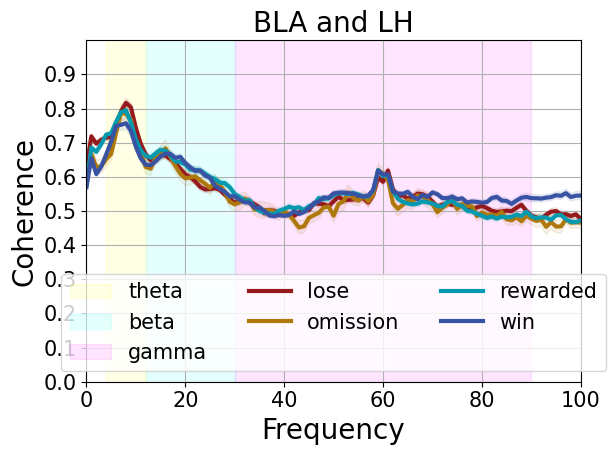

BLA_MD


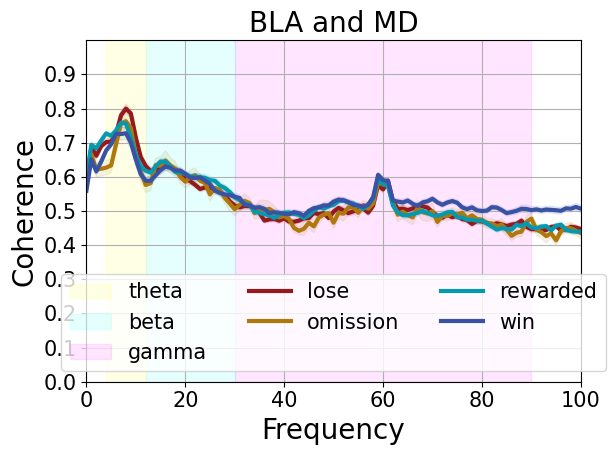

BLA_mPFC


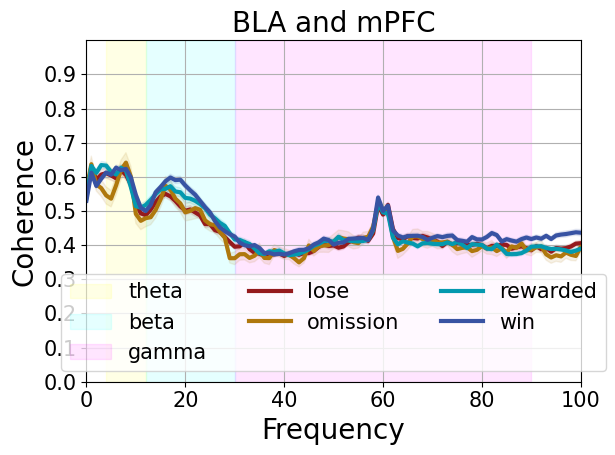

BLA_vHPC


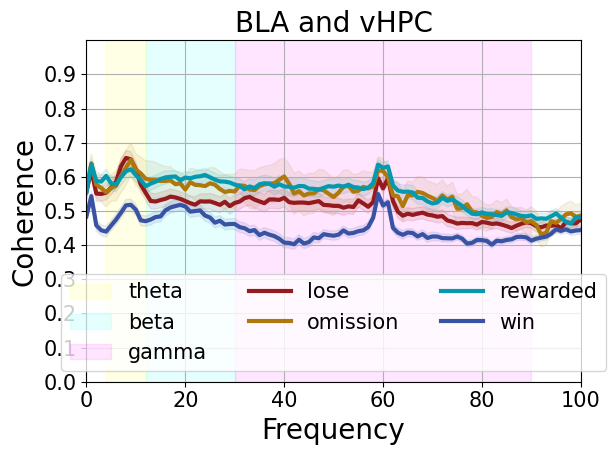

LH_MD


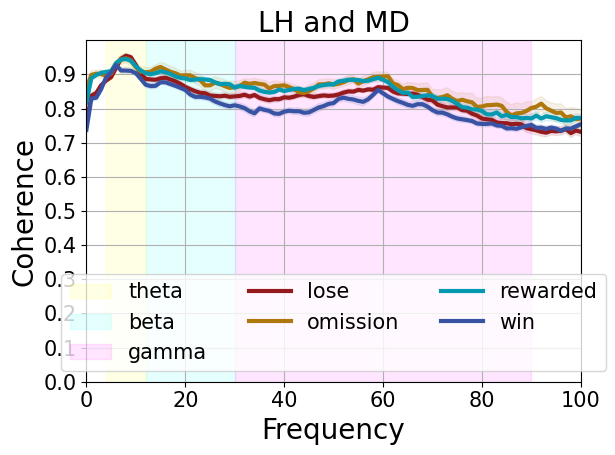

LH_mPFC


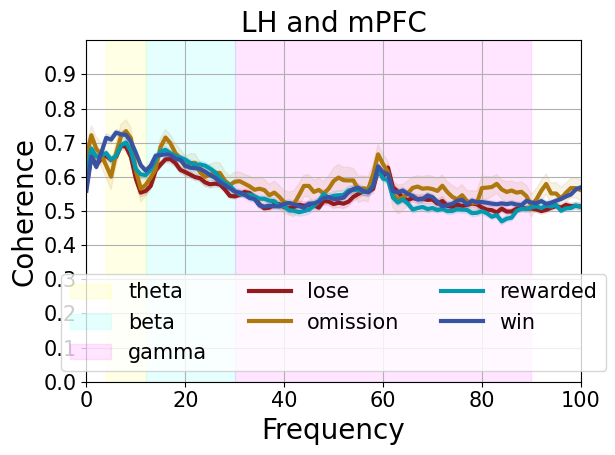

LH_vHPC


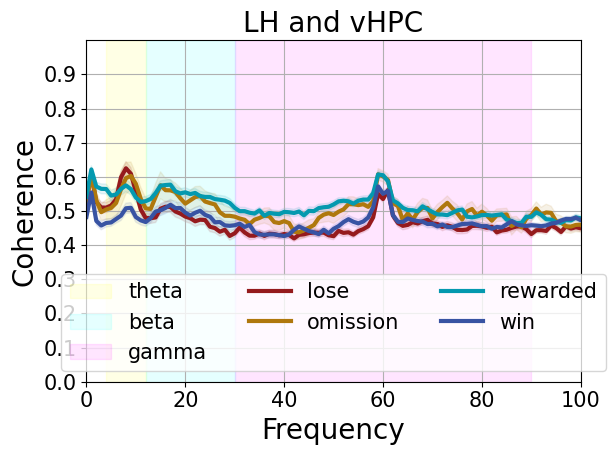

MD_mPFC


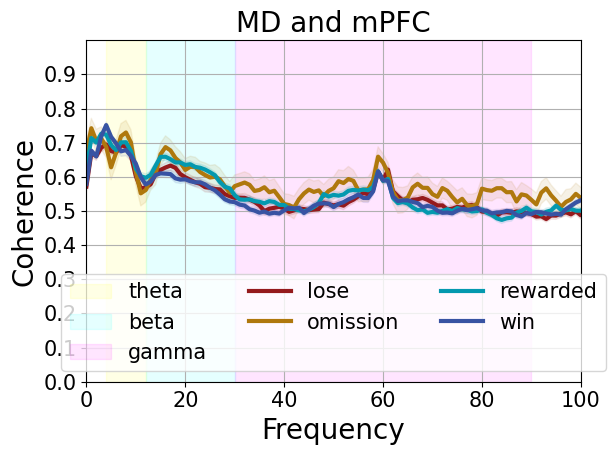

MD_vHPC


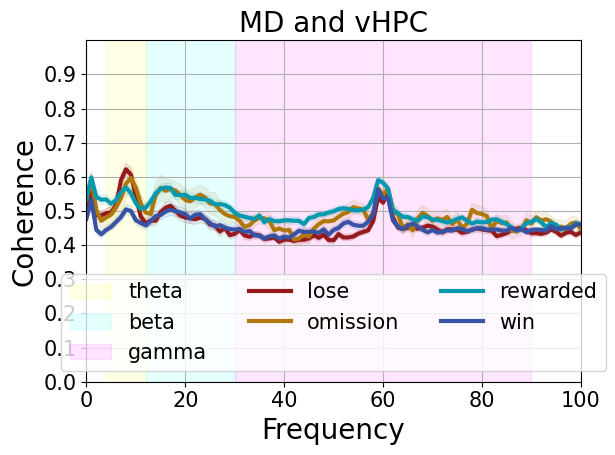

mPFC_vHPC


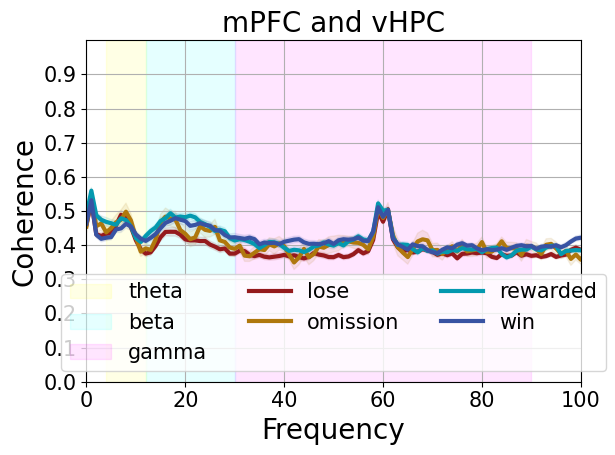

In [149]:
LOW_FREQ = 0
HIGH_FREQ = 100
for pair_base_name in all_pair_base_name:
    print(pair_base_name)
    # Setting up the plot
    fig, ax = plt.subplots()
    plt.title("{}".format(" and ".join(pair_base_name.split("_"))), fontsize=20)
    plt.xlabel("Frequency", fontsize=20)
    plt.ylabel("Coherence", fontsize=20)
    plt.xlim(LOW_FREQ, HIGH_FREQ)
    plt.yticks(np.arange(0, 1, 0.1))
    plt.ylim(0,1)
    
    # Plotting the frequency bands
    ax.axvspan(4, 12, alpha=0.1, color='yellow', label="theta")
    ax.axvspan(12, 30, alpha=0.1, color='cyan', label="beta")
    ax.axvspan(30, 90, alpha=0.1, color='magenta', label="gamma")
    plt.grid()

    # Calculating the mean and SEM
    coherence_col = "{}_trial_window_mean_coherence".format(pair_base_name)
    grouped_all_trials_df = MERGED_LFP_AND_SLEAP.groupby([GROUPINGS]).agg({coherence_col: lambda x: np.vstack(x.tolist())}).reset_index()
    grouped_all_trials_df["mean_coherence"] = grouped_all_trials_df[coherence_col].apply(lambda x: np.nanmean(np.vstack(x), axis=0))
    grouped_all_trials_df["std_coherence"] = grouped_all_trials_df[coherence_col].apply(lambda x: np.nanstd(np.vstack(x), axis=0))
    grouped_all_trials_df["n_trials"] = grouped_all_trials_df[coherence_col].apply(lambda x: np.sum(~np.isnan(x), axis=0))
    grouped_all_trials_df["sem_coherence"] = grouped_all_trials_df.apply(lambda x: x["std_coherence"] / np.sqrt(x["n_trials"]), axis=1)

    # Plotting the line graph    
    for index, row in grouped_all_trials_df.iterrows():
        try:
            ax = sns.lineplot(x=all_frequencies, y=row["mean_coherence"], \
            label="{}".format(row[GROUPINGS]), color=OUTCOME_TO_COLOR[row[GROUPINGS]],
            linewidth=3)           

            plt.fill_between(all_frequencies, \
            row["mean_coherence"] - row["sem_coherence"], row["mean_coherence"] + row["sem_coherence"], alpha=0.1,
            color=OUTCOME_TO_COLOR[row[GROUPINGS]])

        except Exception as e: 
            print(e)

    # Finalizing the plot
    plt.legend(ncol=3, loc="lower center")
    plt.tight_layout()
    plt.savefig("./proc/coherence/{}_{}hz_{}_coherence_of_zscored_lfp.png".format(LOW_FREQ, HIGH_FREQ, pair_base_name))
    plt.show()
    
    
    

    

# Getting the average per frequency band for each trial outcome

In [150]:
all_coherence_col = [col for col in MERGED_LFP_AND_SLEAP.columns if "trial_window_mean_coherence" in col]


In [151]:
all_coherence_col

['BLA_LH_trial_window_mean_coherence',
 'BLA_MD_trial_window_mean_coherence',
 'BLA_mPFC_trial_window_mean_coherence',
 'BLA_vHPC_trial_window_mean_coherence',
 'LH_MD_trial_window_mean_coherence',
 'LH_mPFC_trial_window_mean_coherence',
 'LH_vHPC_trial_window_mean_coherence',
 'MD_mPFC_trial_window_mean_coherence',
 'MD_vHPC_trial_window_mean_coherence',
 'mPFC_vHPC_trial_window_mean_coherence']

- Getting the average coherence for all frequencies in a given band for a single trial

In [152]:
BAND_TO_ALL_COL = defaultdict(list)
for band, frequency in BAND_TO_FREQ.items():
    for col in all_coherence_col:
        BAND_COL = "{}_averaged_{}_coherence".format("_".join(col.split("_")[:2]), band)
        BAND_TO_ALL_COL[band].append(BAND_COL)
        print(BAND_COL)
        print(frequency[0], frequency[1])
        MERGED_LFP_AND_SLEAP[BAND_COL] = MERGED_LFP_AND_SLEAP[col].apply(lambda x: np.nanmean(x[frequency[0]:frequency[1]]))    


BLA_LH_averaged_theta_coherence
6 11
BLA_MD_averaged_theta_coherence
6 11
BLA_mPFC_averaged_theta_coherence
6 11
BLA_vHPC_averaged_theta_coherence
6 11
LH_MD_averaged_theta_coherence
6 11
LH_mPFC_averaged_theta_coherence
6 11
LH_vHPC_averaged_theta_coherence
6 11
MD_mPFC_averaged_theta_coherence
6 11
MD_vHPC_averaged_theta_coherence
6 11
mPFC_vHPC_averaged_theta_coherence
6 11
BLA_LH_averaged_beta_coherence
20 31
BLA_MD_averaged_beta_coherence
20 31
BLA_mPFC_averaged_beta_coherence
20 31
BLA_vHPC_averaged_beta_coherence
20 31
LH_MD_averaged_beta_coherence
20 31
LH_mPFC_averaged_beta_coherence
20 31
LH_vHPC_averaged_beta_coherence
20 31
MD_mPFC_averaged_beta_coherence
20 31
MD_vHPC_averaged_beta_coherence
20 31
mPFC_vHPC_averaged_beta_coherence
20 31
BLA_LH_averaged_gamma_coherence
30 51
BLA_MD_averaged_gamma_coherence
30 51
BLA_mPFC_averaged_gamma_coherence
30 51
BLA_vHPC_averaged_gamma_coherence
30 51
LH_MD_averaged_gamma_coherence
30 51
LH_mPFC_averaged_gamma_coherence
30 51
LH_vHPC_

In [153]:
region_pair_to_outcome_to_coherence = {k: defaultdict(nested_dict) for k,v in BAND_TO_FREQ.items()}

for band, frequency in BAND_TO_FREQ.items():
    for outcome in MERGED_LFP_AND_SLEAP[GROUPINGS].unique():
        outcome_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP[GROUPINGS] == outcome].copy()
        for band_col in set(BAND_TO_ALL_COL[band]):
            pair_col = "_".join(band_col.split("_")[:-3])
            region_pair_to_outcome_to_coherence[band][pair_col][outcome]["mean"] = outcome_df[band_col].mean()
            region_pair_to_outcome_to_coherence[band][pair_col][outcome]["std"] = outcome_df[band_col].std() 
            region_pair_to_outcome_to_coherence[band][pair_col][outcome]["n_trials"] = len(outcome_df[band_col])
            region_pair_to_outcome_to_coherence[band][pair_col][outcome]["sem"] = outcome_df[band_col].std() / np.sqrt(len(outcome_df[band_col]))




In [161]:
df["color"].values

array(['#951a1d', '#af780d', '#0499af', '#3853a3', '#951a1d', '#af780d',
       '#0499af', '#3853a3', '#951a1d', '#af780d', '#0499af', '#3853a3',
       '#951a1d', '#af780d', '#0499af', '#3853a3', '#951a1d', '#af780d',
       '#0499af', '#3853a3', '#951a1d', '#af780d', '#0499af', '#3853a3',
       '#951a1d', '#af780d', '#0499af', '#3853a3', '#951a1d', '#af780d',
       '#0499af', '#3853a3', '#951a1d', '#af780d', '#0499af', '#3853a3',
       '#951a1d', '#af780d', '#0499af', '#3853a3'], dtype=object)

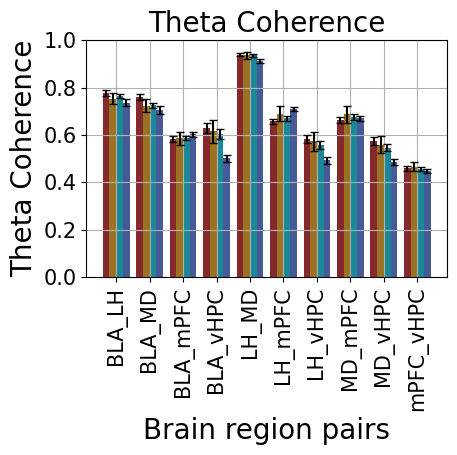

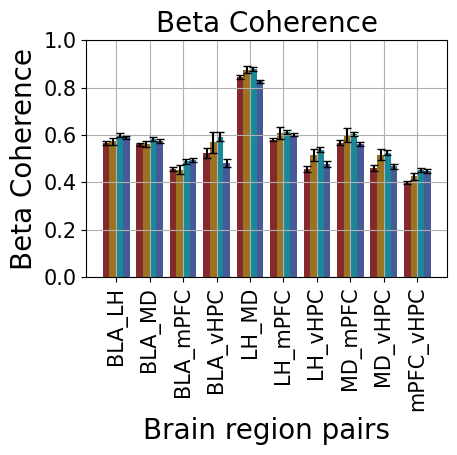

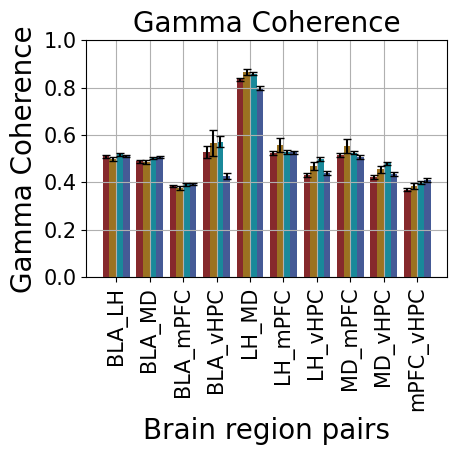

In [163]:
for band, frequency in BAND_TO_FREQ.items(): 
    # Convert the nested dictionary to a DataFrame
    data = []
    for group_name, group_data in region_pair_to_outcome_to_coherence[band].items():
        for bar_name, bar_dict in group_data.items():
            data.append({"Group": group_name, "Bar": bar_name, "coherence": bar_dict["mean"], "sem": bar_dict["sem"]})
    df = pd.DataFrame(data).sort_values(by=["Group", "Bar"])
    df["color"] = df["Bar"].map(OUTCOME_TO_COLOR)    
    # Create barplot
    ax = sns.barplot(x='Group', y='coherence', hue='Bar', data=df, palette=df["color"].values, ci=None)
    
    # Adding error bars
    groups = df['Group'].unique()
    bars_per_group = df['Bar'].nunique()
    bar_width = 0.8 / bars_per_group  # the width of the bars
    x_positions = []  # this will store the x positions for the error bars

    for i, group in enumerate(groups):
        group_data = df[df['Group'] == group]  # filter the dataframe for the specific group
        num_bars = group_data.shape[0]  # get the number of bars for this group
        group_positions = np.linspace(i - bar_width*(num_bars-1)/2, i + bar_width*(num_bars-1)/2, num_bars)
        x_positions.extend(group_positions)  # add these positions to the list

        for pos, (idx, row) in zip(group_positions, group_data.iterrows()):
            height = row['coherence']
            error = row['sem']
            plt.errorbar(pos, height, yerr=error, color='black', capsize=3, fmt='none', zorder=10)
    
    plt.xticks(rotation=90)
    plt.xlabel("Brain region pairs", fontsize=20)
    plt.ylabel("{} Coherence".format(band.title()), fontsize=20)
    plt.legend(title="Trial Conditions", loc="lower left", ncol=4)
    plt.title("{} Coherence".format(band.title()), fontsize=20)
    plt.tight_layout()
    plt.grid()
    plt.ylim(0,1)
    ax.get_legend().remove()

    plt.savefig("./proc/coherence/all_zscored_{}_lfp_power_coherence.png".format(band))
    # Show the plot
    plt.show()

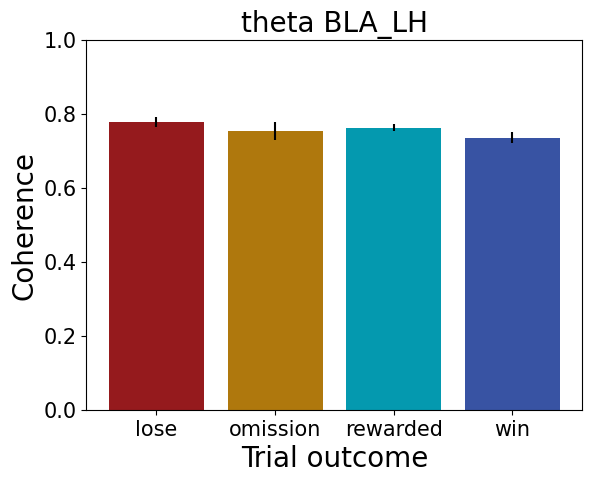

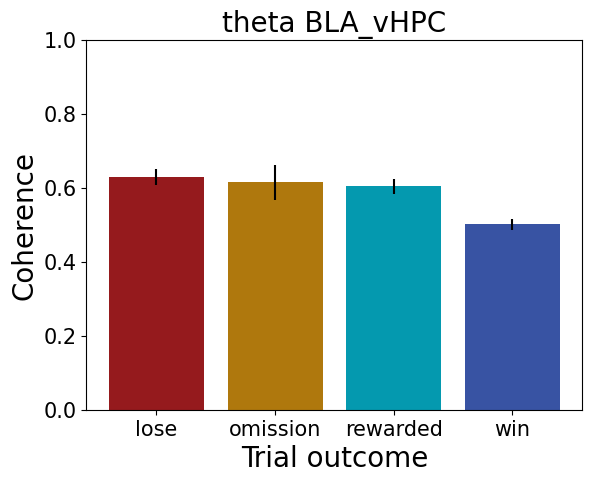

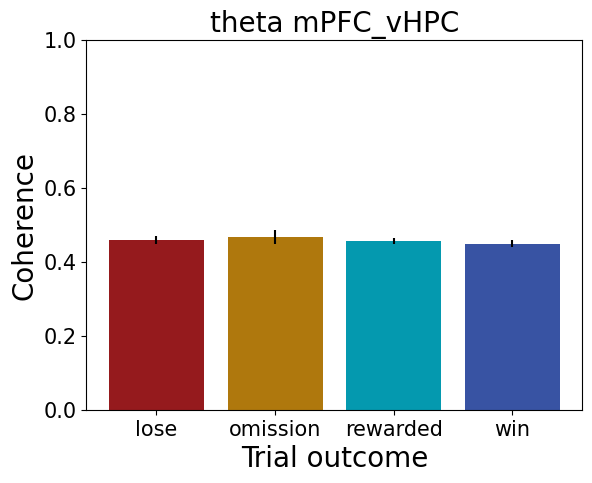

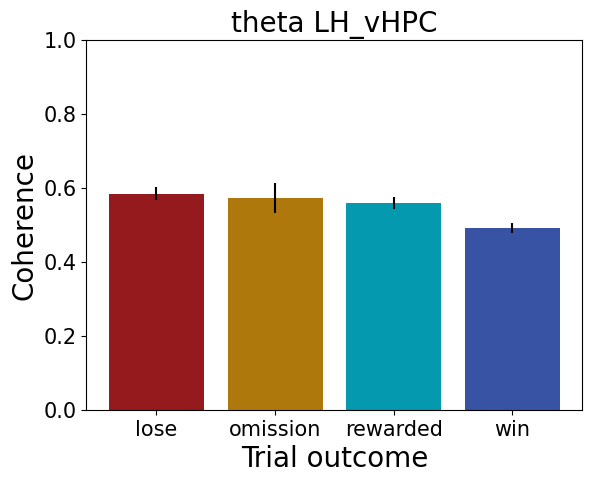

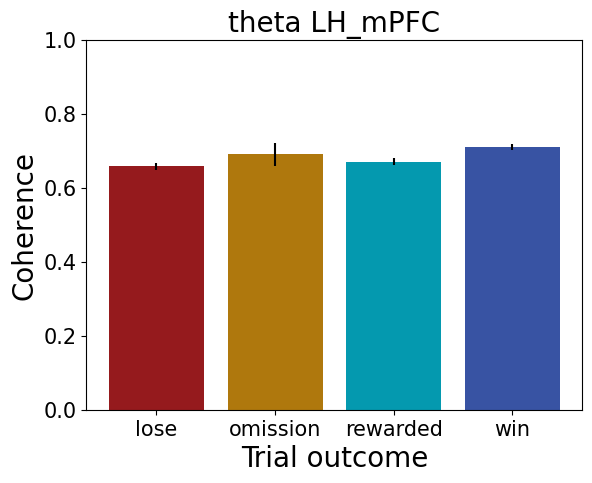

...

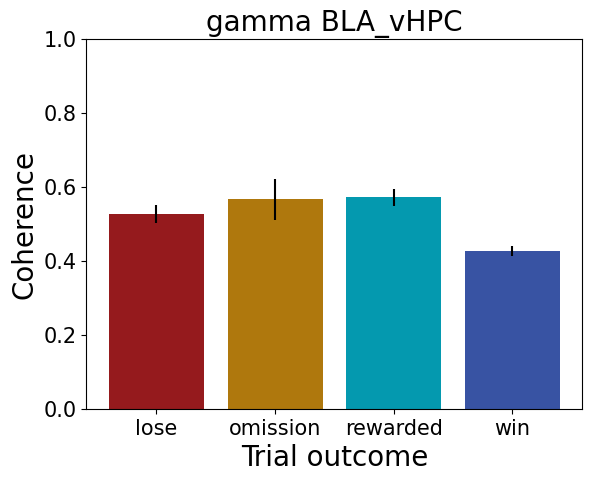

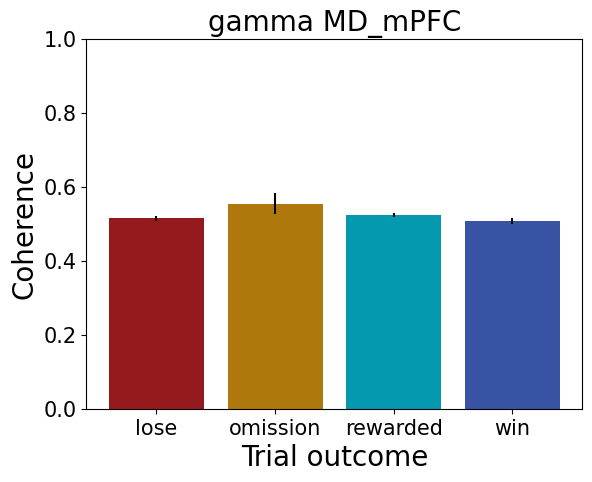

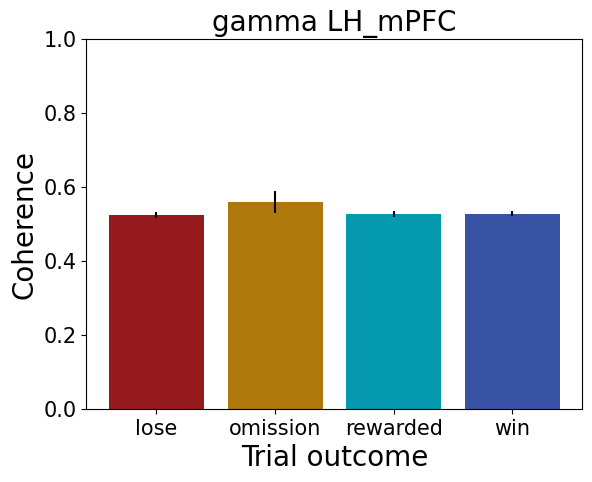

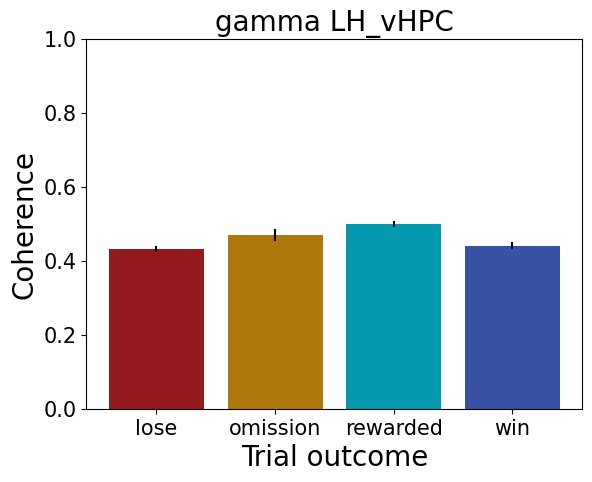

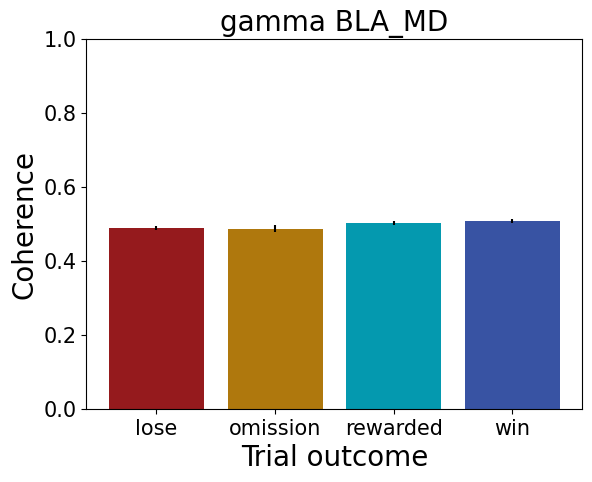

In [164]:
for band, frequency in BAND_TO_FREQ.items(): 
    for region_pair, value in region_pair_to_outcome_to_coherence[band].items():
        fig, ax = plt.subplots()
        pair_df = pd.DataFrame.from_dict(value, orient="index").reset_index()
        pair_df["color"] = pair_df["index"].map(OUTCOME_TO_COLOR)
        pair_df = pair_df.sort_values("index")
        plt.bar(pair_df["index"], pair_df["mean"], color=pair_df["color"], yerr=pair_df["sem"])
        # plt.errorbar(pair_df["index"], pair_df["mean"], yerr=pair_df["sem"])
        
        plt.title("{} {}".format(band, region_pair), fontsize=FONTSIZE)
        plt.xlabel("Trial outcome", fontsize=FONTSIZE)
        plt.ylabel("Coherence", fontsize=FONTSIZE)
        plt.ylim(0,1)
        


    
    
    
    


# Checking to see if everything is from the same distribution or not

In [165]:
trial_outcome_pairs = ("win", "lose"), ("win", "rewarded"), ("lose", "omission")

In [166]:
for band, frequency in BAND_TO_FREQ.items():
    print(band)

theta
beta
gamma


In [167]:
MERGED_LFP_AND_SLEAP["trial_outcome"].unique()

array(['win', 'lose', 'rewarded', 'omission'], dtype=object)

In [168]:
region_to_mannwhitneyu = defaultdict(dict)
region_to_mannwhitneyu = []

for band, frequency in BAND_TO_FREQ.items():
    print(band)
    for pair_col in [col for col in MERGED_LFP_AND_SLEAP.columns if band in col and "coherence" in col]:
        print(pair_col)  
        for outcome_pair in trial_outcome_pairs:
            outcome_1_coherence = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == outcome_pair[0]][pair_col].dropna()
            outcome_2_coherence = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == outcome_pair[1]][pair_col].dropna()
            statistic, p_value = mannwhitneyu(outcome_1_coherence, outcome_2_coherence, alternative='two-sided')
            region_to_mannwhitneyu.append({"band": band, "region": pair_col, "p_value": p_value, "statistic": statistic, "outcome": outcome_pair})
            





theta
BLA_LH_averaged_theta_coherence
BLA_MD_averaged_theta_coherence
BLA_mPFC_averaged_theta_coherence
BLA_vHPC_averaged_theta_coherence
LH_MD_averaged_theta_coherence
LH_mPFC_averaged_theta_coherence
LH_vHPC_averaged_theta_coherence
MD_mPFC_averaged_theta_coherence
MD_vHPC_averaged_theta_coherence
mPFC_vHPC_averaged_theta_coherence
beta
BLA_LH_averaged_beta_coherence
BLA_MD_averaged_beta_coherence
BLA_mPFC_averaged_beta_coherence
BLA_vHPC_averaged_beta_coherence
LH_MD_averaged_beta_coherence
LH_mPFC_averaged_beta_coherence
LH_vHPC_averaged_beta_coherence
MD_mPFC_averaged_beta_coherence
MD_vHPC_averaged_beta_coherence
mPFC_vHPC_averaged_beta_coherence
gamma
BLA_LH_averaged_gamma_coherence
BLA_MD_averaged_gamma_coherence
BLA_mPFC_averaged_gamma_coherence
BLA_vHPC_averaged_gamma_coherence
LH_MD_averaged_gamma_coherence
LH_mPFC_averaged_gamma_coherence
LH_vHPC_averaged_gamma_coherence
MD_mPFC_averaged_gamma_coherence
MD_vHPC_averaged_gamma_coherence
mPFC_vHPC_averaged_gamma_coherence


In [169]:
coherence_mannwhitneyu = pd.DataFrame(region_to_mannwhitneyu)

In [170]:
coherence_mannwhitneyu[coherence_mannwhitneyu["p_value"] <= 0.05/3].sort_values(["p_value", "region"], ascending=True)

,band,region,p_value,statistic,outcome
73,gamma,LH_MD_averaged_gamma_coherence,1.423331e-08,1949.0,"(win, rewarded)"
43,beta,LH_MD_averaged_beta_coherence,5.709055e-08,2031.0,"(win, rewarded)"
79,gamma,LH_vHPC_averaged_gamma_coherence,4.183633e-07,2155.0,"(win, rewarded)"
9,theta,BLA_vHPC_averaged_theta_coherence,3.903572e-06,2208.0,"(win, lose)"
40,beta,BLA_vHPC_averaged_beta_coherence,7.678757e-06,2353.0,"(win, rewarded)"
24,theta,MD_vHPC_averaged_theta_coherence,1.313347e-05,2293.0,"(win, lose)"
70,gamma,BLA_vHPC_averaged_gamma_coherence,2.943936e-05,2453.0,"(win, rewarded)"
18,theta,LH_vHPC_averaged_theta_coherence,3.354488e-05,2362.0,"(win, lose)"
85,gamma,MD_vHPC_averaged_gamma_coherence,9.184274e-05,2543.0,"(win, rewarded)"
15,theta,LH_mPFC_averaged_theta_coherence,1.110700e-04,4997.0,"(win, lose)"


In [171]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.copy()
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore").copy()
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "frequencies" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "all_window_coherence" in col], errors="ignore")

# Granger's Causality

In [172]:
os.environ["SPECTRAL_CONNECTIVITY_ENABLE_GPU"] = "true"
import cupy as cp

In [173]:
from spectral_connectivity import Multitaper, Connectivity
import spectral_connectivity

- Calculating the granger

In [174]:
trial_brain_region_pairs

[('BLA_trial_lfp_trace', 'LH_trial_lfp_trace'),
 ('BLA_trial_lfp_trace', 'MD_trial_lfp_trace'),
 ('BLA_trial_lfp_trace', 'mPFC_trial_lfp_trace'),
 ('BLA_trial_lfp_trace', 'vHPC_trial_lfp_trace'),
 ('LH_trial_lfp_trace', 'MD_trial_lfp_trace'),
 ('LH_trial_lfp_trace', 'mPFC_trial_lfp_trace'),
 ('LH_trial_lfp_trace', 'vHPC_trial_lfp_trace'),
 ('MD_trial_lfp_trace', 'mPFC_trial_lfp_trace'),
 ('MD_trial_lfp_trace', 'vHPC_trial_lfp_trace'),
 ('mPFC_trial_lfp_trace', 'vHPC_trial_lfp_trace')]

In [175]:
for region_1, region_2 in trial_brain_region_pairs:
    region_1_trimmed = region_1.split("_")[0]
    region_2_trimmed = region_2.split("_")[0]
    pair_base_name = "{}_{}".format(region_1_trimmed, region_2_trimmed)
    print(pair_base_name)
    try:
        multitaper_col = "{}_trial_multitaper".format(pair_base_name)
        # MERGED_LFP_AND_SLEAP[multitaper_col] = MERGED_LFP_AND_SLEAP.apply(lambda x: Multitaper(time_series=np.array([x[region_1],x[region_2]]).T, sampling_frequency=RESAMPLE_RATE, time_halfbandwidth_product=TIME_HALFBANDWIDTH_PRODUCT), axis=1)
        MERGED_LFP_AND_SLEAP[multitaper_col] = MERGED_LFP_AND_SLEAP.apply(lambda x: Multitaper(time_series=np.array([x[region_1],x[region_2]]).T, sampling_frequency=RESAMPLE_RATE, time_halfbandwidth_product=TIME_HALFBANDWIDTH_PRODUCT, time_window_duration=TIME_WINDOW_DURATION, time_window_step=TIME_WINDOW_STEP), axis=1)
        print("\tcalculating connectivity")
        connectivity_col = "{}_trial_connectivity".format(pair_base_name)
        MERGED_LFP_AND_SLEAP[connectivity_col] = MERGED_LFP_AND_SLEAP[multitaper_col].apply(lambda x: Connectivity.from_multitaper(x))
        
        MERGED_LFP_AND_SLEAP["{}_trial_frequencies".format(pair_base_name)] = MERGED_LFP_AND_SLEAP[connectivity_col].apply(lambda x: x.frequencies)
        
        print("\t{}_{}_granger".format(region_1_trimmed, region_2_trimmed))
        MERGED_LFP_AND_SLEAP["{}_{}_split_windows_granger".format(region_1_trimmed, region_2_trimmed)] = MERGED_LFP_AND_SLEAP[connectivity_col].apply(lambda x: x.pairwise_spectral_granger_prediction()[:,:,0,1])

        MERGED_LFP_AND_SLEAP["{}_{}_window_mean_granger".format(region_1_trimmed, region_2_trimmed)] = MERGED_LFP_AND_SLEAP["{}_{}_split_windows_granger".format(region_1_trimmed, region_2_trimmed)].apply(lambda x: np.nanmean(x, axis=0))

        print("\t{}_{}_granger".format(region_2_trimmed, region_1_trimmed))
        MERGED_LFP_AND_SLEAP["{}_{}_split_windows_granger".format(region_2_trimmed, region_1_trimmed)] = MERGED_LFP_AND_SLEAP[connectivity_col].apply(lambda x: x.pairwise_spectral_granger_prediction()[:,:,1,0])

        MERGED_LFP_AND_SLEAP["{}_{}_window_mean_granger".format(region_2_trimmed, region_1_trimmed)] = MERGED_LFP_AND_SLEAP["{}_{}_split_windows_granger".format(region_2_trimmed, region_1_trimmed)].apply(lambda x: np.nanmean(x, axis=0))
        
        MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[connectivity_col], errors="ignore")
        # MERGED_LFP_AND_SLEAP.to_pickle("./proc/per_trial_granger.pkl")
    except Exception as e: 
        print(e)

BLA_LH
	calculating connectivity
	BLA_LH_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 17 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged


	LH_BLA_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged


BLA_MD
	calculating connectivity
	BLA_MD_granger


Maximum iterations reached. 17 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged


	MD_BLA_granger


Maximum iterations reached. 17 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged


BLA_mPFC
	calculating connectivity
	BLA_mPFC_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged


	mPFC_BLA_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged


BLA_vHPC
	calculating connectivity
	BLA_vHPC_granger


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


	vHPC_BLA_granger


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


LH_MD
	calculating connectivity
	LH_MD_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. 

	MD_LH_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. 

LH_mPFC
	calculating connectivity
	LH_mPFC_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged


	mPFC_LH_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged


LH_vHPC
	calculating connectivity
	LH_vHPC_granger


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 17 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 17 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


	vHPC_LH_granger


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 17 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 17 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


MD_mPFC
	calculating connectivity
	MD_mPFC_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged


	mPFC_MD_granger


Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged


MD_vHPC
	calculating connectivity
	MD_vHPC_granger


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 17 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


	vHPC_MD_granger


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 18 of 19 converged
Maximum iterations reached. 17 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.


mPFC_vHPC
	calculating connectivity
	mPFC_vHPC_granger


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged


	vHPC_mPFC_granger


Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Computing the initial conditions using the Cholesky failed. Using a random initial condition.
Maximum iterations reached. 18 of 19 converged


In [176]:
MERGED_LFP_AND_SLEAP["BLA_LH_trial_frequencies"].iloc[0]

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
       121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
       132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
       143., 144., 145., 146., 147., 148., 149., 15

In [177]:
MERGED_LFP_AND_SLEAP

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,MD_vHPC_split_windows_granger,MD_vHPC_window_mean_granger,vHPC_MD_split_windows_granger,vHPC_MD_window_mean_granger,mPFC_vHPC_trial_multitaper,mPFC_vHPC_trial_frequencies,mPFC_vHPC_split_windows_granger,mPFC_vHPC_window_mean_granger,vHPC_mPFC_split_windows_granger,vHPC_mPFC_window_mean_granger
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[[0.06765045370805112, 0.6961423227877725, 0.0...","[0.5530219947452714, 0.3761011960173034, 0.397...","[[0.17066037394945166, 0.48081824738139245, 0....","[0.4547691223313665, 0.7093719569615419, 0.720...","Multitaper(sampling_frequency=1000, time_halfb...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.491333133854436, 0.51019016747725, 0.04261...","[0.25204763001304026, 0.3346934816775898, 0.51...","[[0.044338445402290816, 0.08060961527087995, 0...","[1.063328801533531, 0.8187602381482211, 0.9377..."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[[0.20811230469107578, 0.8467155183843698, 1.1...","[0.5865886198594362, 0.6087328449697228, 0.416...","[[1.2611257919540897, 0.5183169949218804, 0.66...","[0.6756723308355246, 0.6286035928498646, 0.775...","Multitaper(sampling_frequency=1000, time_halfb...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.22147850110417622, 0.17936589890760235, 0....","[0.4425987415495491, 0.5212956052184067, 0.285...","[[0.3265690258971752, 0.5283757573128707, 0.55...","[0.5316488150196741, 0.40277253059661483, 0.52..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[[1.044624074785875, nan, 0.7203919457632959, ...","[0.5683687355726927, 0.35942691592603904, 0.41...","[[0.4861916549140779, 1.3516528862819421, 1.42...","[0.35045463912591224, 0.8047783177824076, 0.83...","Multitaper(sampling_frequency=1000, time_halfb...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.7772595061490168, 0.6126562462975933, 0.22...","[0.6594914796905622, 0.6167584700573822, 0.442...","[[0.08846809204873418, 0.6241181916746004, 0.6...","[0.5863965226416726, 0.7311723523594714, 0.611..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[[0.11007992046560044, 1.6638949718169176, 0.8...","[0.5654228963913837, 0.5460655577769994, 0.601...","[[0.850103671609582, 0.667811739624387, 0.2461...","[1.6871681174088473, 0.8011561831511255, 0.707...","Multitaper(sampling_frequency=1000, time_halfb...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[1.348007108456586, 0.2188616692951264, 0.013...","[0.6051337816576945, 0.39097144214889373, 0.45...","[

In [178]:
GROUPINGS = "trial_outcome"

In [179]:
all_frequencies = MERGED_LFP_AND_SLEAP["BLA_LH_trial_frequencies"].iloc[0]

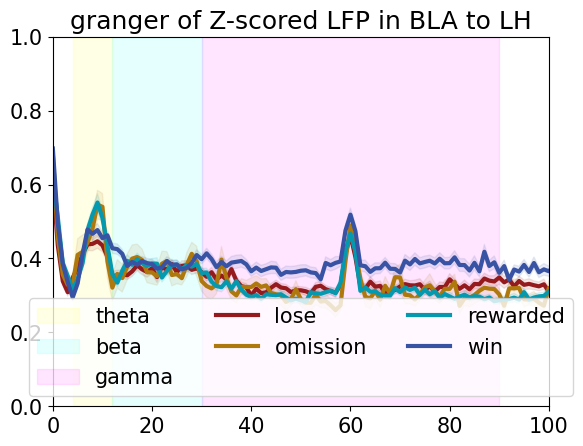

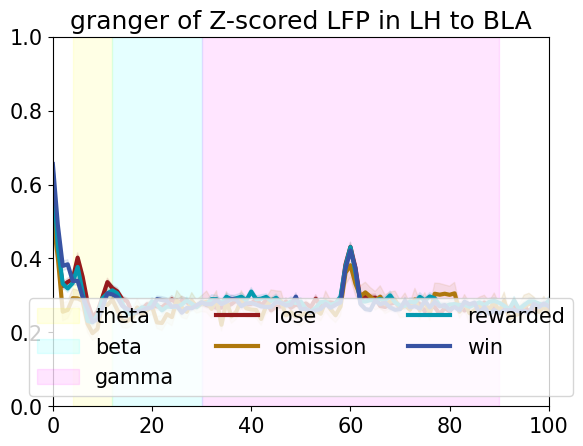

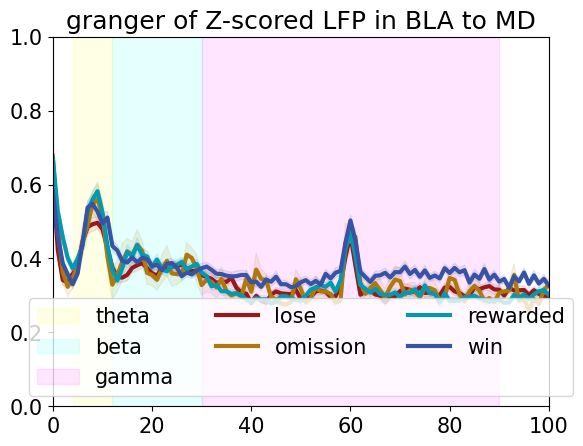

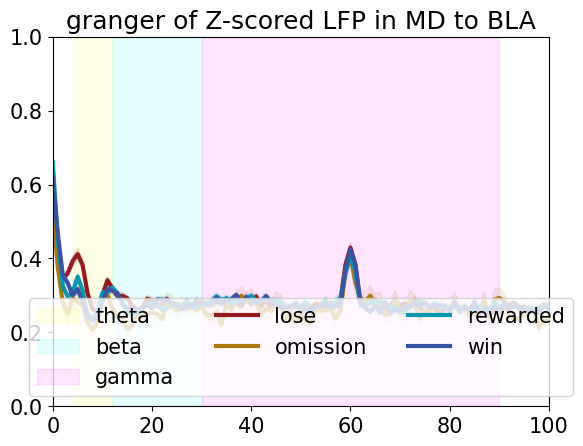

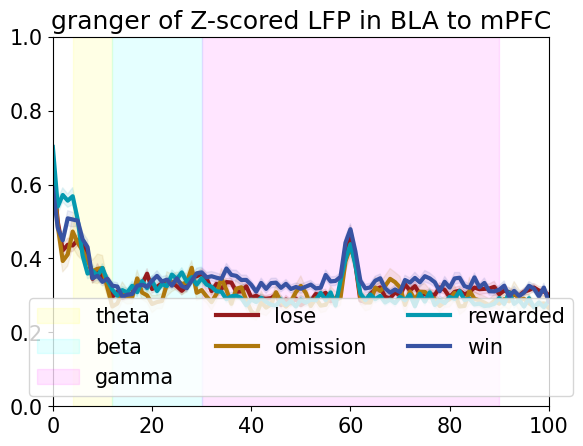

...

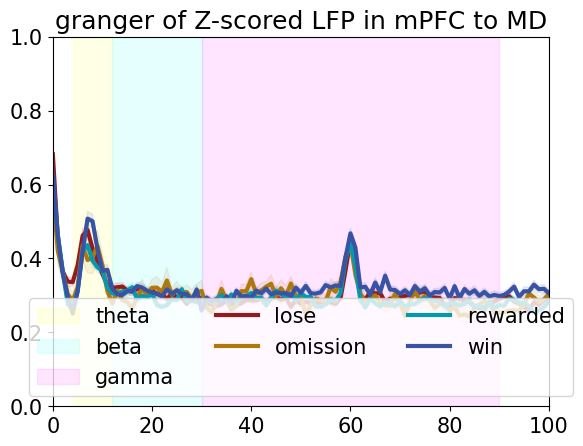

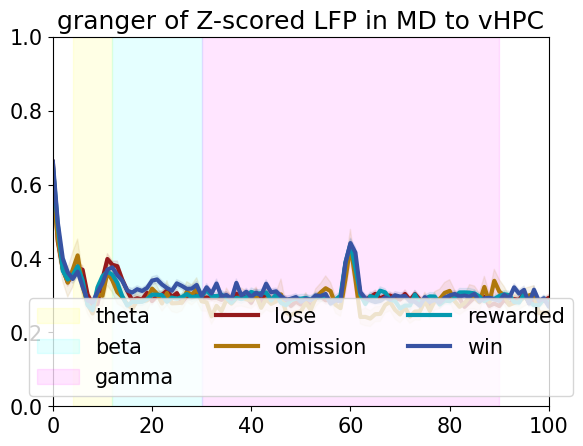

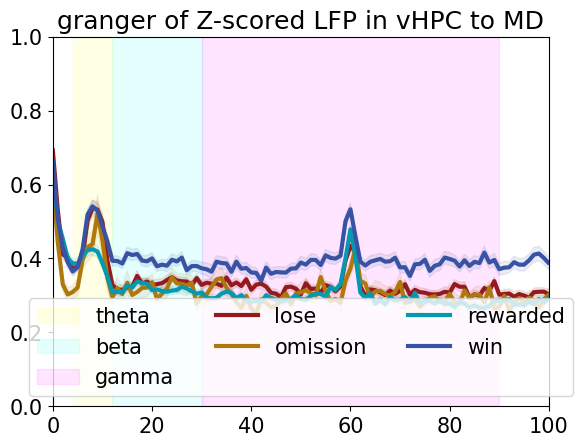

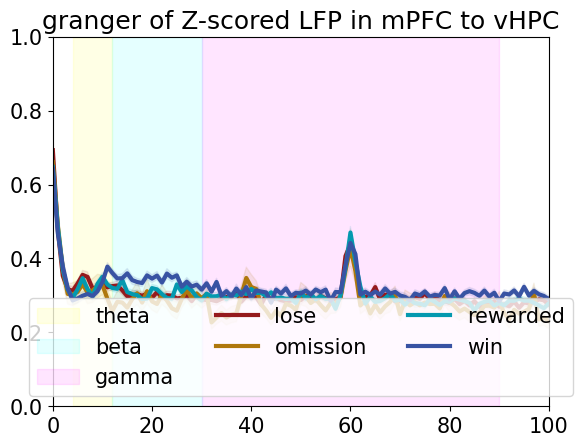

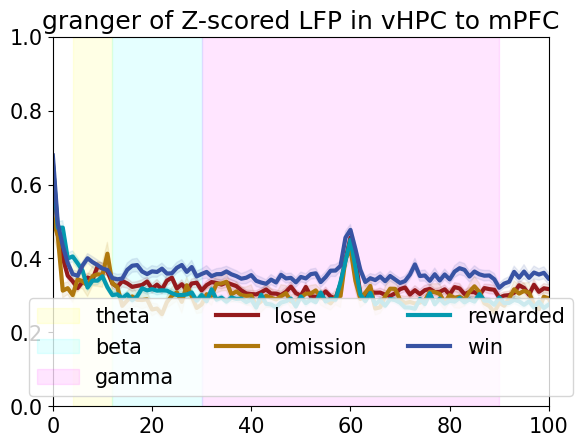

In [180]:
low_freq = 0
high_freq = 100

for region_1, region_2 in trial_brain_region_pairs:
    region_1_trimmed = region_1.split("_")[0]
    region_2_trimmed = region_2.split("_")[0]
    
    
    fig, ax = plt.subplots()
    plt.title("granger of Z-scored LFP in {} to {}".format(region_1_trimmed, region_2_trimmed))
    plt.xlim(low_freq, high_freq)
    plt.ylim(0,1)

    ax.axvspan(4, 12, alpha=0.1, color='yellow', label="theta")
    ax.axvspan(12, 30, alpha=0.1, color='cyan', label="beta")
    ax.axvspan(30, 90, alpha=0.1, color='magenta', label="gamma")
    
    granger_col = "{}_{}_window_mean_granger".format(region_1_trimmed, region_2_trimmed)
    grouped_all_trials_df = MERGED_LFP_AND_SLEAP.groupby([GROUPINGS]).agg({granger_col: lambda x: np.vstack(x.tolist())}).reset_index()
    # grouped_all_trials_df = grouped_all_trials_df[grouped_all_trials_df["trial_or_baseline"] == "trial"]
    grouped_all_trials_df["mean_granger"] = grouped_all_trials_df[granger_col].apply(lambda x: np.nanmean(np.vstack(x), axis=0))
    grouped_all_trials_df["std_granger"] = grouped_all_trials_df[granger_col].apply(lambda x: np.nanstd(np.vstack(x), axis=0))
    grouped_all_trials_df["n_trials"] = grouped_all_trials_df[granger_col].apply(lambda x: np.sum(~np.isnan(x), axis=0))
    grouped_all_trials_df["sem_granger"] = grouped_all_trials_df.apply(lambda x: x["std_granger"] / np.sqrt(x["n_trials"]), axis=1)
    for index, row in grouped_all_trials_df.iterrows():
        try:

            ax = sns.lineplot(x=all_frequencies, y=row["mean_granger"], \
            label="{}".format(row[GROUPINGS]), color=OUTCOME_TO_COLOR[row[GROUPINGS]],
            linewidth=3)

    
    
            plt.fill_between(all_frequencies, \
            row["mean_granger"] - row["sem_granger"], row["mean_granger"] + row["sem_granger"], alpha=0.1,
            color=OUTCOME_TO_COLOR[row[GROUPINGS]])
        except Exception as e: 
            print(e)

    plt.legend(ncol=3, loc="lower center")

    plt.savefig("./proc/{}_{}_granger_{}_{}hz.png".format(region_1_trimmed, region_2_trimmed, low_freq, high_freq))
    plt.show()
    
    fig, ax = plt.subplots()
    plt.title("granger of Z-scored LFP in {} to {}".format(region_2_trimmed, region_1_trimmed))
    plt.xlim(low_freq, high_freq)
    plt.ylim(0,1)

    ax.axvspan(4, 12, alpha=0.1, color='yellow', label="theta")
    ax.axvspan(12, 30, alpha=0.1, color='cyan', label="beta")
    ax.axvspan(30, 90, alpha=0.1, color='magenta', label="gamma")
    
    granger_col = "{}_{}_window_mean_granger".format(region_2_trimmed, region_1_trimmed)
    grouped_all_trials_df = MERGED_LFP_AND_SLEAP.groupby([GROUPINGS]).agg({granger_col: lambda x: np.vstack(x.tolist())}).reset_index()
    # grouped_all_trials_df = grouped_all_trials_df[grouped_all_trials_df["trial_or_baseline"] == "trial"]
    grouped_all_trials_df["mean_granger"] = grouped_all_trials_df[granger_col].apply(lambda x: np.nanmean(np.vstack(x), axis=0))
    grouped_all_trials_df["std_granger"] = grouped_all_trials_df[granger_col].apply(lambda x: np.nanstd(np.vstack(x), axis=0))
    grouped_all_trials_df["n_trials"] = grouped_all_trials_df[granger_col].apply(lambda x: np.sum(~np.isnan(x), axis=0))
    grouped_all_trials_df["sem_granger"] = grouped_all_trials_df.apply(lambda x: x["std_granger"] / np.sqrt(x["n_trials"]), axis=1)
    for index, row in grouped_all_trials_df.iterrows():
        try:

            ax = sns.lineplot(x=all_frequencies, y=row["mean_granger"], \
            label="{}".format(row[GROUPINGS]), color=OUTCOME_TO_COLOR[row[GROUPINGS]],
            linewidth=3)

    
    
            plt.fill_between(all_frequencies, \
            row["mean_granger"] - row["sem_granger"], row["mean_granger"] + row["sem_granger"], alpha=0.1,
            color=OUTCOME_TO_COLOR[row[GROUPINGS]])
        except Exception as e: 
            print(e)
    
    plt.legend(ncol=3, loc="lower center")

    plt.savefig("./proc/{}_{}_granger_{}_{}hz.png".format(region_2_trimmed, region_1_trimmed, low_freq, high_freq))

    plt.show()
    
    


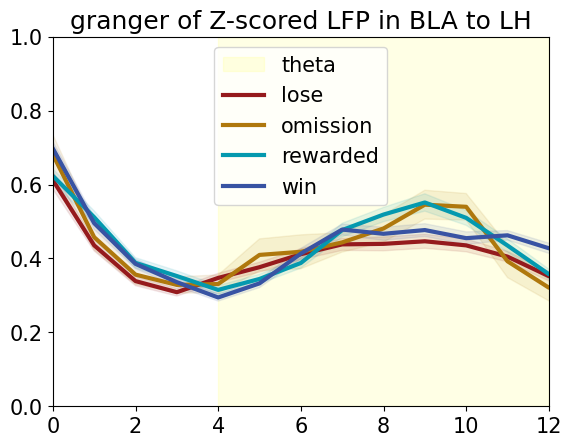

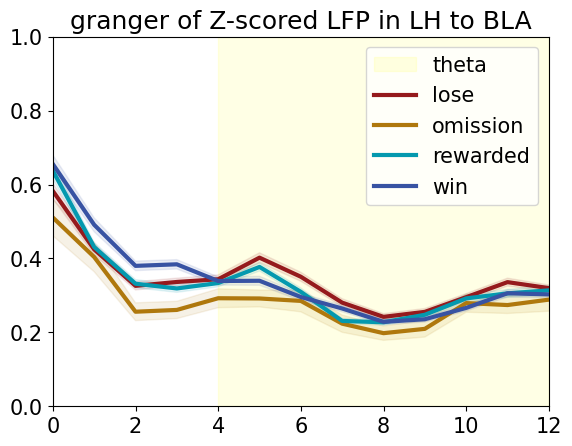

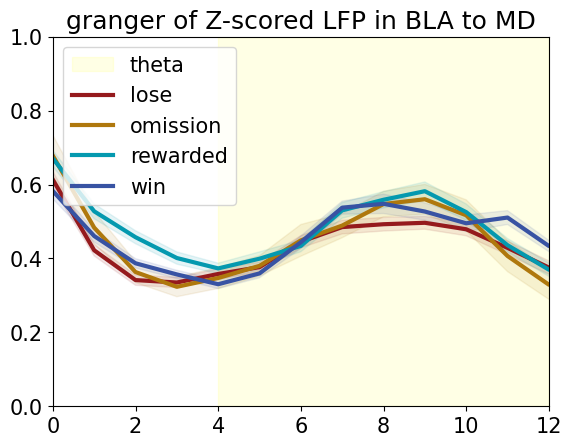

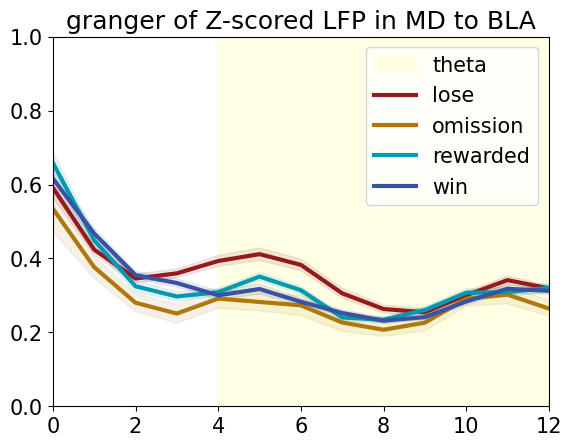

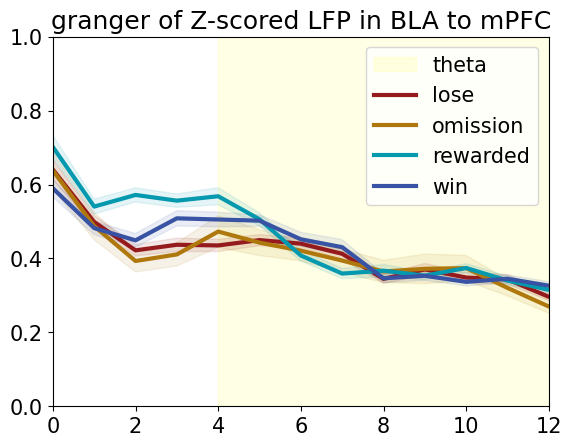

...

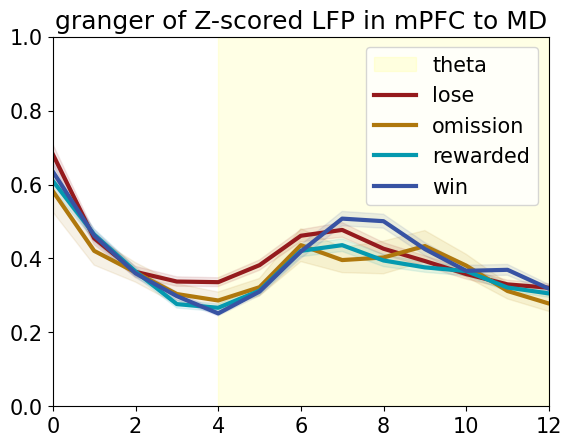

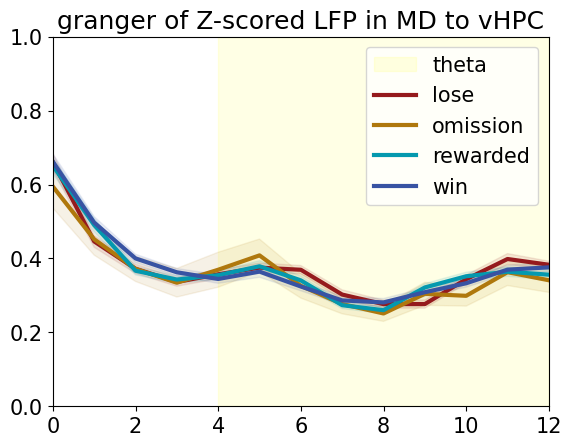

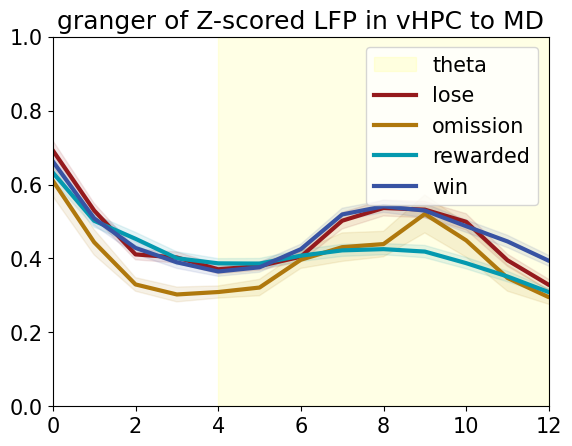

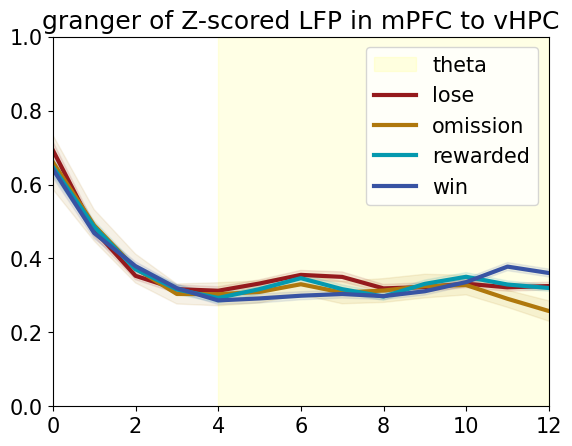

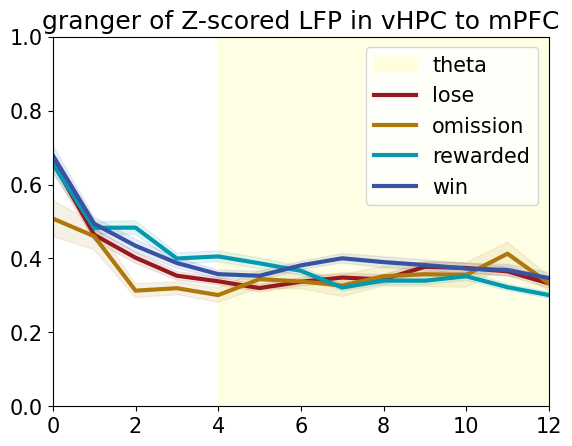

In [181]:
low_freq = 0
high_freq = 12

for region_1, region_2 in trial_brain_region_pairs:
    region_1_trimmed = region_1.split("_")[0]
    region_2_trimmed = region_2.split("_")[0]
    
    
    fig, ax = plt.subplots()
    plt.title("granger of Z-scored LFP in {} to {}".format(region_1_trimmed, region_2_trimmed))
    plt.xlim(low_freq, high_freq)
    plt.ylim(0,1)

    ax.axvspan(4, 12, alpha=0.1, color='yellow', label="theta")
    # ax.axvspan(12, 30, alpha=0.1, color='cyan', label="beta")
    # ax.axvspan(30, 90, alpha=0.1, color='magenta', label="gamma")
    
    granger_col = "{}_{}_window_mean_granger".format(region_1_trimmed, region_2_trimmed)
    grouped_all_trials_df = MERGED_LFP_AND_SLEAP.groupby([GROUPINGS]).agg({granger_col: lambda x: np.vstack(x.tolist())}).reset_index()
    # grouped_all_trials_df = grouped_all_trials_df[grouped_all_trials_df["trial_or_baseline"] == "trial"]
    grouped_all_trials_df["mean_granger"] = grouped_all_trials_df[granger_col].apply(lambda x: np.nanmean(np.vstack(x), axis=0))
    grouped_all_trials_df["std_granger"] = grouped_all_trials_df[granger_col].apply(lambda x: np.nanstd(np.vstack(x), axis=0))
    grouped_all_trials_df["n_trials"] = grouped_all_trials_df[granger_col].apply(lambda x: np.sum(~np.isnan(x), axis=0))
    grouped_all_trials_df["sem_granger"] = grouped_all_trials_df.apply(lambda x: x["std_granger"] / np.sqrt(x["n_trials"]), axis=1)
    for index, row in grouped_all_trials_df.iterrows():
        try:

            ax = sns.lineplot(x=all_frequencies, y=row["mean_granger"], \
            label="{}".format(row[GROUPINGS]), color=OUTCOME_TO_COLOR[row[GROUPINGS]],
            linewidth=3)

    
    
            plt.fill_between(all_frequencies, \
            row["mean_granger"] - row["sem_granger"], row["mean_granger"] + row["sem_granger"], alpha=0.1,
            color=OUTCOME_TO_COLOR[row[GROUPINGS]])
        except Exception as e: 
            print(e)

    # plt.legend(ncol=3, loc="lower center")

    plt.savefig("./proc/{}_{}_granger_{}_{}hz.png".format(region_1_trimmed, region_2_trimmed, low_freq, high_freq))
    plt.show()
    
    fig, ax = plt.subplots()
    plt.title("granger of Z-scored LFP in {} to {}".format(region_2_trimmed, region_1_trimmed))
    plt.xlim(low_freq, high_freq)
    plt.ylim(0,1)

    ax.axvspan(4, 12, alpha=0.1, color='yellow', label="theta")
    
    granger_col = "{}_{}_window_mean_granger".format(region_2_trimmed, region_1_trimmed)
    grouped_all_trials_df = MERGED_LFP_AND_SLEAP.groupby([GROUPINGS]).agg({granger_col: lambda x: np.vstack(x.tolist())}).reset_index()
    # grouped_all_trials_df = grouped_all_trials_df[grouped_all_trials_df["trial_or_baseline"] == "trial"]
    grouped_all_trials_df["mean_granger"] = grouped_all_trials_df[granger_col].apply(lambda x: np.nanmean(np.vstack(x), axis=0))
    grouped_all_trials_df["std_granger"] = grouped_all_trials_df[granger_col].apply(lambda x: np.nanstd(np.vstack(x), axis=0))
    grouped_all_trials_df["n_trials"] = grouped_all_trials_df[granger_col].apply(lambda x: np.sum(~np.isnan(x), axis=0))
    grouped_all_trials_df["sem_granger"] = grouped_all_trials_df.apply(lambda x: x["std_granger"] / np.sqrt(x["n_trials"]), axis=1)
    for index, row in grouped_all_trials_df.iterrows():
        try:

            ax = sns.lineplot(x=all_frequencies, y=row["mean_granger"], \
            label="{}".format(row[GROUPINGS]), color=OUTCOME_TO_COLOR[row[GROUPINGS]],
            linewidth=3)

    
    
            plt.fill_between(all_frequencies, \
            row["mean_granger"] - row["sem_granger"], row["mean_granger"] + row["sem_granger"], alpha=0.1,
            color=OUTCOME_TO_COLOR[row[GROUPINGS]])
        except Exception as e: 
            print(e)
    
    # plt.legend(ncol=3, loc="lower center")

    plt.savefig("./proc/{}_{}_granger_{}_{}hz.png".format(region_2_trimmed, region_1_trimmed, low_freq, high_freq))

    plt.show()
    
    


# Network Predictivity

In [314]:
MERGED_LFP_AND_SLEAP.columns

Index(['time', 'recording_file', 'video_number', 'current_subject',
       'mPFC_baseline_lfp_trace', 'mPFC_trial_lfp_trace',
       'vHPC_baseline_lfp_trace', 'vHPC_trial_lfp_trace',
       'BLA_baseline_lfp_trace', 'BLA_trial_lfp_trace',
       ...
       'LH_mPFC_averaged_gamma_granger', 'mPFC_LH_averaged_gamma_granger',
       'LH_vHPC_averaged_gamma_granger', 'vHPC_LH_averaged_gamma_granger',
       'MD_mPFC_averaged_gamma_granger', 'mPFC_MD_averaged_gamma_granger',
       'MD_vHPC_averaged_gamma_granger', 'vHPC_MD_averaged_gamma_granger',
       'mPFC_vHPC_averaged_gamma_granger', 'vHPC_mPFC_averaged_gamma_granger'],
      dtype='object', length=258)

In [321]:
feature_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "averaged" in col and ("granger" in col or "coherence" in col)]
feature_columns = [col for col in feature_columns if "beta" not in col]

In [322]:
feature_columns

['BLA_LH_averaged_theta_coherence',
 'BLA_MD_averaged_theta_coherence',
 'BLA_mPFC_averaged_theta_coherence',
 'BLA_vHPC_averaged_theta_coherence',
 'LH_MD_averaged_theta_coherence',
 'LH_mPFC_averaged_theta_coherence',
 'LH_vHPC_averaged_theta_coherence',
 'MD_mPFC_averaged_theta_coherence',
 'MD_vHPC_averaged_theta_coherence',
 'mPFC_vHPC_averaged_theta_coherence',
 'BLA_LH_averaged_gamma_coherence',
 'BLA_MD_averaged_gamma_coherence',
 'BLA_mPFC_averaged_gamma_coherence',
 'BLA_vHPC_averaged_gamma_coherence',
 'LH_MD_averaged_gamma_coherence',
 'LH_mPFC_averaged_gamma_coherence',
 'LH_vHPC_averaged_gamma_coherence',
 'MD_mPFC_averaged_gamma_coherence',
 'MD_vHPC_averaged_gamma_coherence',
 'mPFC_vHPC_averaged_gamma_coherence',
 'BLA_LH_averaged_theta_granger',
 'LH_BLA_averaged_theta_granger',
 'BLA_MD_averaged_theta_granger',
 'MD_BLA_averaged_theta_granger',
 'BLA_mPFC_averaged_theta_granger',
 'mPFC_BLA_averaged_theta_granger',
 'BLA_vHPC_averaged_theta_granger',
 'vHPC_BLA_avera

- Filtering out for trials that are win vs loss

In [328]:
network_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"].isin(["win", "lose", "rewarded"])]
network_df = network_df.dropna(subset="mPFC_MD_averaged_gamma_granger")

In [329]:
network_df.groupby("trial_outcome").count()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,LH_mPFC_averaged_gamma_granger,mPFC_LH_averaged_gamma_granger,LH_vHPC_averaged_gamma_granger,vHPC_LH_averaged_gamma_granger,MD_mPFC_averaged_gamma_granger,mPFC_MD_averaged_gamma_granger,MD_vHPC_averaged_gamma_granger,vHPC_MD_averaged_gamma_granger,mPFC_vHPC_averaged_gamma_granger,vHPC_mPFC_averaged_gamma_granger
trial_outcome,,,,,,,,,,,,,,,,,,,,,
lose,81,81,81,81,81,81,81,81,81,81,...,81,81,81,81,81,81,81,81,81,81
rewarded,84,84,84,84,84,84,84,84,84,84,...,84,84,84,84,84,84,84,84,84,84
win,92,92,92,92,92,92,92,92,92,92,...,92,92,92,92,92,92,92,92,92,92


In [330]:
network_array = network_df[feature_columns].values

In [331]:
network_df.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,LH_mPFC_averaged_gamma_granger,mPFC_LH_averaged_gamma_granger,LH_vHPC_averaged_gamma_granger,vHPC_LH_averaged_gamma_granger,MD_mPFC_averaged_gamma_granger,mPFC_MD_averaged_gamma_granger,MD_vHPC_averaged_gamma_granger,vHPC_MD_averaged_gamma_granger,mPFC_vHPC_averaged_gamma_granger,vHPC_mPFC_averaged_gamma_granger
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,0.262939,0.374079,0.294019,0.545728,0.291623,0.333077,0.308649,0.392697,0.305397,0.384658
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,0.273393,0.287113,0.292065,0.560045,0.283100,0.293765,0.296901,0.484684,0.328569,0.452748
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,0.265287,0.332886,0.285625,0.553754,0.327348,0.340832,0.264818,0.529037,0.270830,0.458511
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,0.318662,0.320384,0.323362,0.663856,0.357773,0.318353,0.336524,0.504305,0.310164,0.465149
4,37450494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-3.7477186, -3.0575845, -2.521558, -2.6644983...","[-3.055351, -3.1044867, -2.4121192, -2.083803,...","[-1.4259167, -1.3856833, -1.1265334, -0.91235,...","[-4.0848665, -4.2718334, -3.9487834, -3.480183...","[-3.0521622, -3.0342553, -2.877071, -2.9904823...","[-1.5221018, -1.5599056, -1.2534956, -1.233598...",...,0.243561,0.408023,0.252576,0.608187,0.275422,0.308187,0.269105,0.594787,0.259332,0.465764


In [332]:
original_scores=[]
kFold=KFold(n_splits=5,shuffle=True)

# creating a RF classifier 
clf = RandomForestClassifier(n_estimators = 100)   
for train_index, test_index in kFold.split(network_array):
    
    X_train = network_array[train_index]  
    X_test = network_array[test_index]
    y_train = network_df["trial_outcome"].values[train_index]
    y_test = network_df["trial_outcome"].values[test_index]

    # Training the model on the training dataset 
    # fit function is used to train the model using the training sets as parameters 
    clf.fit(X_train, y_train) 
    original_scores.append(clf.score(X_test,y_test))
mean_original_scores = np.mean(original_scores)
# 0.9393939393939394


In [333]:
original_scores

[0.7115384615384616,
 0.6923076923076923,
 0.7254901960784313,
 0.7254901960784313,
 0.7647058823529411]

In [334]:
y_test

array(['lose', 'win', 'win', 'win', 'win', 'win', 'win', 'win', 'win',
       'win', 'lose', 'lose', 'lose', 'lose', 'lose', 'lose', 'win',
       'rewarded', 'rewarded', 'rewarded', 'rewarded', 'win', 'lose',
       'lose', 'lose', 'lose', 'rewarded', 'rewarded', 'lose', 'win',
       'win', 'rewarded', 'rewarded', 'rewarded', 'rewarded', 'rewarded',
       'win', 'win', 'win', 'lose', 'rewarded', 'rewarded', 'rewarded',
       'rewarded', 'rewarded', 'win', 'lose', 'lose', 'lose', 'rewarded',
       'rewarded'], dtype=object)

In [335]:
clf.predict(X_test)

array(['lose', 'win', 'win', 'win', 'win', 'win', 'win', 'win', 'win',
       'win', 'lose', 'lose', 'lose', 'lose', 'lose', 'lose', 'win',
       'win', 'win', 'rewarded', 'rewarded', 'rewarded', 'lose', 'lose',
       'lose', 'lose', 'rewarded', 'rewarded', 'win', 'win', 'win', 'win',
       'rewarded', 'rewarded', 'rewarded', 'win', 'rewarded', 'lose',
       'lose', 'rewarded', 'rewarded', 'lose', 'rewarded', 'rewarded',
       'rewarded', 'rewarded', 'lose', 'lose', 'lose', 'rewarded',
       'rewarded'], dtype=object)

In [336]:
OUTCOME_LABELS=["win", "lose", "rewarded"]

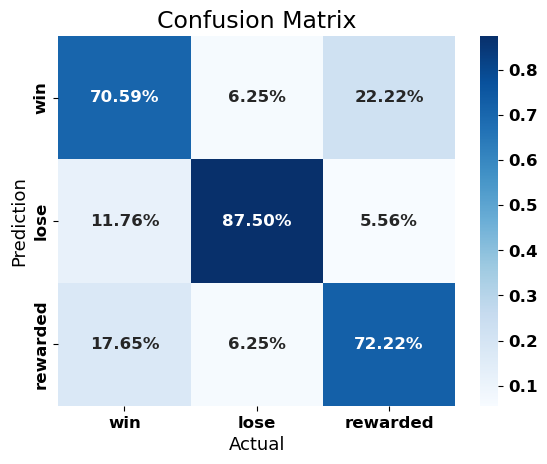

In [339]:
#compute the confusion matrix.
cm = confusion_matrix(clf.predict(X_test),y_test, labels=OUTCOME_LABELS)

#Plot the confusion matrix.
sns.heatmap(cm/sum(cm), 
            annot=True,
            # fmt='g', 
            fmt='.2%',
           cmap="Blues", xticklabels=OUTCOME_LABELS, yticklabels=OUTCOME_LABELS)
# sns.light_palette("seagreen", as_cmap=True)

plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Confusion Matrix',fontsize=17)
plt.show()

In [340]:
importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)

In [341]:
std

array([0.0291273 , 0.0245518 , 0.02060245, 0.04685807, 0.02953034,
       0.03247974, 0.04644929, 0.02375714, 0.03439423, 0.01714759,
       0.02099142, 0.01835075, 0.02020421, 0.03152129, 0.05445555,
       0.02905662, 0.04758979, 0.0253143 , 0.02628163, 0.03032166,
       0.02067175, 0.0211202 , 0.02234003, 0.03576251, 0.02047959,
       0.01968244, 0.02539162, 0.04091853, 0.04261769, 0.02320342,
       0.02209159, 0.02079589, 0.02007834, 0.04303264, 0.02190481,
       0.0276544 , 0.0178514 , 0.03238536, 0.0199185 , 0.02120501,
       0.04263768, 0.01708691, 0.03487803, 0.01950077, 0.03287892,
       0.02262668, 0.01492659, 0.02832321, 0.01610058, 0.01894869,
       0.01311756, 0.02543289, 0.01684936, 0.03171972, 0.01564167,
       0.02532879, 0.01459154, 0.0421617 , 0.02022451, 0.04164146])

In [350]:
forest_importances = pd.DataFrame(importances, index=feature_columns).sort_values(0, ascending=False).reset_index()
forest_importances = forest_importances.rename(columns={0: "mdi"})

In [351]:
forest_importances["index"]

0         LH_MD_averaged_gamma_coherence
1      BLA_vHPC_averaged_theta_coherence
2         vHPC_LH_averaged_theta_granger
3       LH_vHPC_averaged_gamma_coherence
4        vHPC_BLA_averaged_theta_granger
5       LH_vHPC_averaged_theta_coherence
6           LH_MD_averaged_theta_granger
7          BLA_LH_averaged_gamma_granger
8       vHPC_mPFC_averaged_gamma_granger
9       LH_mPFC_averaged_theta_coherence
10        vHPC_LH_averaged_gamma_granger
11        vHPC_MD_averaged_theta_granger
12        vHPC_MD_averaged_gamma_granger
13      MD_vHPC_averaged_theta_coherence
14         MD_BLA_averaged_theta_granger
15         BLA_MD_averaged_gamma_granger
16        LH_MD_averaged_theta_coherence
17       BLA_LH_averaged_theta_coherence
18        mPFC_LH_averaged_gamma_granger
19        mPFC_MD_averaged_theta_granger
20      LH_mPFC_averaged_gamma_coherence
21    mPFC_vHPC_averaged_gamma_coherence
22     BLA_vHPC_averaged_gamma_coherence
23      MD_vHPC_averaged_gamma_coherence
24       vHPC_BL

In [352]:
forest_importances["brain_regions"] = forest_importances["index"].apply(lambda x: x.split("_")[:2])
forest_importances["measure"] = forest_importances["index"].apply(lambda x: x.split("_")[-1])
forest_importances["band"] = forest_importances["index"].apply(lambda x: x.split("_")[-2])

In [353]:
forest_importances = forest_importances.iloc[:20]

In [357]:
forest_importances["color"] = forest_importances["band"].map(BAND_TO_COLOR)
forest_importances["pattern"] = forest_importances["measure"].map(MEASURE_TO_PATTERN)

In [358]:
forest_importances

,index,mdi,brain_regions,measure,band,color,pattern
0,LH_MD_averaged_gamma_coherence,0.038739,"[LH, MD]",coherence,gamma,#15616F,
1,BLA_vHPC_averaged_theta_coherence,0.033272,"[BLA, vHPC]",coherence,theta,#FFAF00,
2,vHPC_LH_averaged_theta_granger,0.032786,"[vHPC, LH]",granger,theta,#FFAF00,/
3,LH_vHPC_averaged_gamma_coherence,0.030960,"[LH, vHPC]",coherence,gamma,#15616F,
4,vHPC_BLA_averaged_theta_granger,0.030602,"[vHPC, BLA]",granger,theta,#FFAF00,/
5,LH_vHPC_averaged_theta_coherence,0.029092,"[LH, vHPC]",coherence,theta,#FFAF00,
6,LH_MD_averaged_theta_granger,0.028221,"[LH, MD]",granger,theta,#FFAF00,/
7,BLA_LH_averaged_gamma_granger,0.026264,"[BLA, LH]",granger,gamma,#15616F,/
8,vHPC_mPFC_averaged_gamma_granger,0.024198,"[vHPC, mPFC]",granger,gamma,#15616F,/
9,LH_mPFC_averaged_theta_coherence,0.023559,"[LH, mPFC]",coherence,theta,#FFAF00,


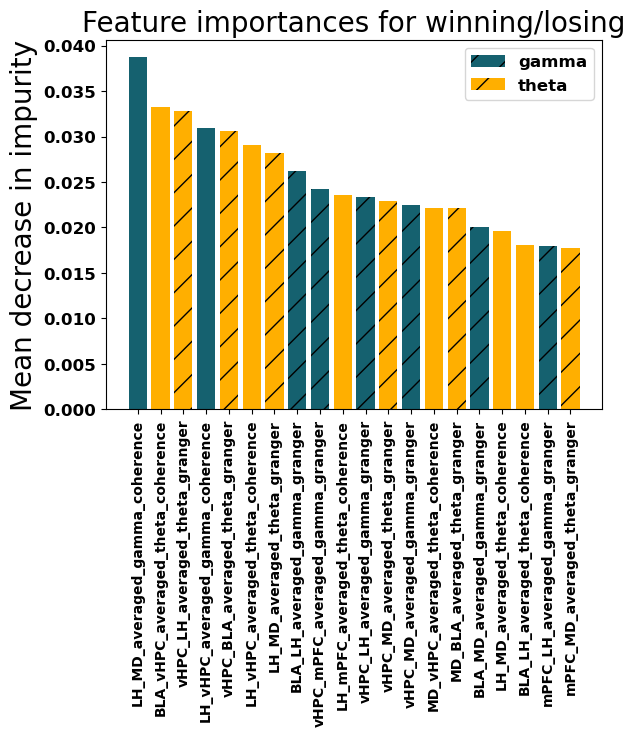

In [359]:
for index, row in forest_importances.iterrows():
    plt.bar(row["index"], row["mdi"], color=row["color"], label="{}".format(row["band"]), hatch=row["pattern"])

plt.xticks(fontsize=10, rotation=90)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())

plt.title("Feature importances for winning/losing", fontsize=20)
plt.ylabel("Mean decrease in impurity", fontsize=20)
# plt.tight_layout()
# plt.savefig("./proc/network/rf_feature_importance.png")
plt.show()

- Shuffling the labels

In [370]:
shuffled_scores=[]
kFold=KFold(n_splits=5,shuffle=True)

# creating a RF classifier 
clf = RandomForestClassifier(n_estimators = 100)   
for train_index, test_index in kFold.split(network_array):
    X_train = network_array[train_index]  
    X_test = network_array[test_index]
    y_train = shuffle(network_df["trial_outcome"].values[train_index])
    y_test = network_df["trial_outcome"].values[test_index]

    # Training the model on the training dataset 
    # fit function is used to train the model using the training sets as parameters 
    clf.fit(X_train, y_train) 
    shuffled_scores.append(clf.score(X_test,y_test))
mean_shuffled_scores = np.mean(shuffled_scores)
# 0.9393939393939394


In [371]:
shuffled_scores

[0.2692307692307692,
 0.3076923076923077,
 0.4117647058823529,
 0.3333333333333333,
 0.23529411764705882]

In [372]:
y_test

array(['win', 'win', 'win', 'win', 'lose', 'win', 'win', 'win', 'win',
       'win', 'win', 'win', 'win', 'lose', 'lose', 'lose', 'lose', 'win',
       'win', 'lose', 'lose', 'win', 'win', 'win', 'win', 'rewarded',
       'rewarded', 'rewarded', 'lose', 'lose', 'lose', 'lose', 'rewarded',
       'rewarded', 'lose', 'win', 'rewarded', 'rewarded', 'rewarded',
       'lose', 'lose', 'rewarded', 'rewarded', 'rewarded', 'lose', 'lose',
       'rewarded', 'rewarded', 'rewarded', 'rewarded', 'rewarded'],
      dtype=object)

In [373]:
clf.predict(X_test)

array(['rewarded', 'rewarded', 'rewarded', 'win', 'rewarded', 'rewarded',
       'rewarded', 'rewarded', 'rewarded', 'win', 'rewarded', 'rewarded',
       'rewarded', 'lose', 'lose', 'rewarded', 'win', 'lose', 'win',
       'rewarded', 'rewarded', 'rewarded', 'rewarded', 'win', 'rewarded',
       'rewarded', 'rewarded', 'win', 'win', 'lose', 'win', 'win', 'win',
       'win', 'rewarded', 'lose', 'win', 'lose', 'win', 'lose', 'win',
       'rewarded', 'lose', 'win', 'win', 'lose', 'lose', 'win', 'win',
       'win', 'lose'], dtype=object)

In [374]:
clf.predict(X_test),y_test

(array(['rewarded', 'rewarded', 'rewarded', 'win', 'rewarded', 'rewarded',
        'rewarded', 'rewarded', 'rewarded', 'win', 'rewarded', 'rewarded',
        'rewarded', 'lose', 'lose', 'rewarded', 'win', 'lose', 'win',
        'rewarded', 'rewarded', 'rewarded', 'rewarded', 'win', 'rewarded',
        'rewarded', 'rewarded', 'win', 'win', 'lose', 'win', 'win', 'win',
        'win', 'rewarded', 'lose', 'win', 'lose', 'win', 'lose', 'win',
        'rewarded', 'lose', 'win', 'win', 'lose', 'lose', 'win', 'win',
        'win', 'lose'], dtype=object),
 array(['win', 'win', 'win', 'win', 'lose', 'win', 'win', 'win', 'win',
        'win', 'win', 'win', 'win', 'lose', 'lose', 'lose', 'lose', 'win',
        'win', 'lose', 'lose', 'win', 'win', 'win', 'win', 'rewarded',
        'rewarded', 'rewarded', 'lose', 'lose', 'lose', 'lose', 'rewarded',
        'rewarded', 'lose', 'win', 'rewarded', 'rewarded', 'rewarded',
        'lose', 'lose', 'rewarded', 'rewarded', 'rewarded', 'lose', 'lose',
      

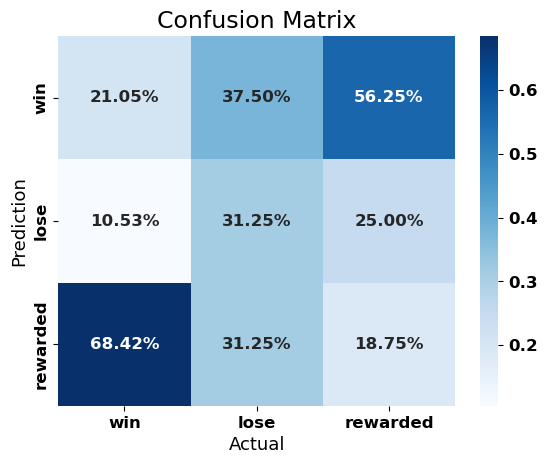

In [375]:
#compute the confusion matrix.
cm = confusion_matrix(clf.predict(X_test),y_test, labels=OUTCOME_LABELS)

#Plot the confusion matrix.
sns.heatmap(cm/sum(cm), 
            annot=True,
            # fmt='g', 
            fmt='.2%',
           cmap="Blues", xticklabels=OUTCOME_LABELS, yticklabels=OUTCOME_LABELS)
# sns.light_palette("seagreen", as_cmap=True)

plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Confusion Matrix',fontsize=17)
plt.show()

In [376]:
shuffled_scores

[0.2692307692307692,
 0.3076923076923077,
 0.4117647058823529,
 0.3333333333333333,
 0.23529411764705882]

In [377]:
original_scores

[0.7115384615384616,
 0.6923076923076923,
 0.7254901960784313,
 0.7254901960784313,
 0.7647058823529411]

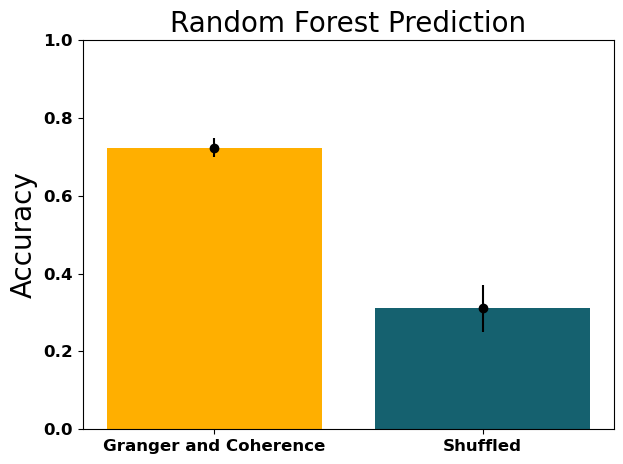

In [378]:
plt.bar(x=["Granger and Coherence", "Shuffled"], height=[np.mean(original_scores), np.mean(shuffled_scores)], color= ["#FFAF00", "#15616F"])
plt.ylabel("Accuracy", fontsize=20)
plt.title("Random Forest Prediction", fontsize=20)
plt.errorbar(["Granger and Coherence", "Shuffled"], [np.mean(original_scores), np.mean(shuffled_scores)], yerr=[np.std(original_scores), np.std(shuffled_scores)], fmt="o", color="black")
plt.ylim(0,1)
plt.tight_layout()
# plt.savefig("./proc/rf_power_predictions.png")

In [195]:
raise ValueError()

ValueError: 

In [182]:
BAND_TO_ALL_COL = {"theta": [], "beta": [], "gamma": []}

In [183]:
MERGED_LFP_AND_SLEAP.columns

Index(['time', 'recording_file', 'video_number', 'current_subject',
       'mPFC_baseline_lfp_trace', 'mPFC_trial_lfp_trace',
       'vHPC_baseline_lfp_trace', 'vHPC_trial_lfp_trace',
       'BLA_baseline_lfp_trace', 'BLA_trial_lfp_trace',
       ...
       'MD_vHPC_split_windows_granger', 'MD_vHPC_window_mean_granger',
       'vHPC_MD_split_windows_granger', 'vHPC_MD_window_mean_granger',
       'mPFC_vHPC_trial_multitaper', 'mPFC_vHPC_trial_frequencies',
       'mPFC_vHPC_split_windows_granger', 'mPFC_vHPC_window_mean_granger',
       'vHPC_mPFC_split_windows_granger', 'vHPC_mPFC_window_mean_granger'],
      dtype='object', length=198)

In [184]:
all_granger_col = [col for col in MERGED_LFP_AND_SLEAP.columns if "window_mean_granger" in col]


In [185]:
all_granger_col

['BLA_LH_window_mean_granger',
 'LH_BLA_window_mean_granger',
 'BLA_MD_window_mean_granger',
 'MD_BLA_window_mean_granger',
 'BLA_mPFC_window_mean_granger',
 'mPFC_BLA_window_mean_granger',
 'BLA_vHPC_window_mean_granger',
 'vHPC_BLA_window_mean_granger',
 'LH_MD_window_mean_granger',
 'MD_LH_window_mean_granger',
 'LH_mPFC_window_mean_granger',
 'mPFC_LH_window_mean_granger',
 'LH_vHPC_window_mean_granger',
 'vHPC_LH_window_mean_granger',
 'MD_mPFC_window_mean_granger',
 'mPFC_MD_window_mean_granger',
 'MD_vHPC_window_mean_granger',
 'vHPC_MD_window_mean_granger',
 'mPFC_vHPC_window_mean_granger',
 'vHPC_mPFC_window_mean_granger']

In [186]:
for band, frequency in BAND_TO_FREQ.items():
    for col in all_granger_col:
        BAND_COL = "{}_averaged_{}_granger".format("_".join(col.split("_")[:2]), band)
        BAND_TO_ALL_COL[band].append(BAND_COL)
        print(BAND_COL)
        print(frequency[0], frequency[1])
        MERGED_LFP_AND_SLEAP[BAND_COL] = MERGED_LFP_AND_SLEAP[col].apply(lambda x: np.nanmean(x[frequency[0]:frequency[1]]))    
        # MERGED_LFP_AND_SLEAP[BAND_COL] = MERGED_LFP_AND_SLEAP[col].apply(lambda x: x[frequency[0]:frequency[1]])    


BLA_LH_averaged_theta_granger
6 11
LH_BLA_averaged_theta_granger
6 11
BLA_MD_averaged_theta_granger
6 11
MD_BLA_averaged_theta_granger
6 11
BLA_mPFC_averaged_theta_granger
6 11
mPFC_BLA_averaged_theta_granger
6 11
BLA_vHPC_averaged_theta_granger
6 11
vHPC_BLA_averaged_theta_granger
6 11
LH_MD_averaged_theta_granger
6 11
MD_LH_averaged_theta_granger
6 11
LH_mPFC_averaged_theta_granger
6 11
mPFC_LH_averaged_theta_granger
6 11
LH_vHPC_averaged_theta_granger
6 11
vHPC_LH_averaged_theta_granger
6 11
MD_mPFC_averaged_theta_granger
6 11
mPFC_MD_averaged_theta_granger
6 11
MD_vHPC_averaged_theta_granger
6 11
vHPC_MD_averaged_theta_granger
6 11
mPFC_vHPC_averaged_theta_granger
6 11
vHPC_mPFC_averaged_theta_granger
6 11
BLA_LH_averaged_beta_granger
20 31
LH_BLA_averaged_beta_granger
20 31
BLA_MD_averaged_beta_granger
20 31
MD_BLA_averaged_beta_granger
20 31
BLA_mPFC_averaged_beta_granger
20 31
mPFC_BLA_averaged_beta_granger
20 31
BLA_vHPC_averaged_beta_granger
20 31
vHPC_BLA_averaged_beta_grange

In [187]:
MERGED_LFP_AND_SLEAP["BLA_LH_averaged_theta_granger"].iloc[0]

0.3527099398486574

In [188]:
MERGED_LFP_AND_SLEAP[col].iloc[0].shape

(500,)

In [189]:
MERGED_LFP_AND_SLEAP[GROUPINGS].unique()

array(['win', 'lose', 'rewarded', 'omission'], dtype=object)

In [190]:
region_pair_to_outcome_to_granger = {k: defaultdict(nested_dict) for k,v in BAND_TO_FREQ.items()}

for band, frequency in BAND_TO_FREQ.items():
    for outcome in MERGED_LFP_AND_SLEAP[GROUPINGS].unique():
        outcome_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP[GROUPINGS] == outcome].copy()
        for band_col in set(BAND_TO_ALL_COL[band]):
            region_pair_to_outcome_to_granger[band]["_".join(band_col.split("_")[:-3])][outcome]["mean"] = outcome_df[band_col].mean() 
            region_pair_to_outcome_to_granger[band]["_".join(band_col.split("_")[:-3])][outcome]["sem"] = outcome_df[band_col].sem() 




In [191]:
BAND_TO_ALL_COL[band]

['BLA_LH_averaged_gamma_granger',
 'LH_BLA_averaged_gamma_granger',
 'BLA_MD_averaged_gamma_granger',
 'MD_BLA_averaged_gamma_granger',
 'BLA_mPFC_averaged_gamma_granger',
 'mPFC_BLA_averaged_gamma_granger',
 'BLA_vHPC_averaged_gamma_granger',
 'vHPC_BLA_averaged_gamma_granger',
 'LH_MD_averaged_gamma_granger',
 'MD_LH_averaged_gamma_granger',
 'LH_mPFC_averaged_gamma_granger',
 'mPFC_LH_averaged_gamma_granger',
 'LH_vHPC_averaged_gamma_granger',
 'vHPC_LH_averaged_gamma_granger',
 'MD_mPFC_averaged_gamma_granger',
 'mPFC_MD_averaged_gamma_granger',
 'MD_vHPC_averaged_gamma_granger',
 'vHPC_MD_averaged_gamma_granger',
 'mPFC_vHPC_averaged_gamma_granger',
 'vHPC_mPFC_averaged_gamma_granger']

In [192]:
import matplotlib

In [193]:
font = {'weight' : 'bold',
        'size'   : 36}

matplotlib.rc('font', **font)

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

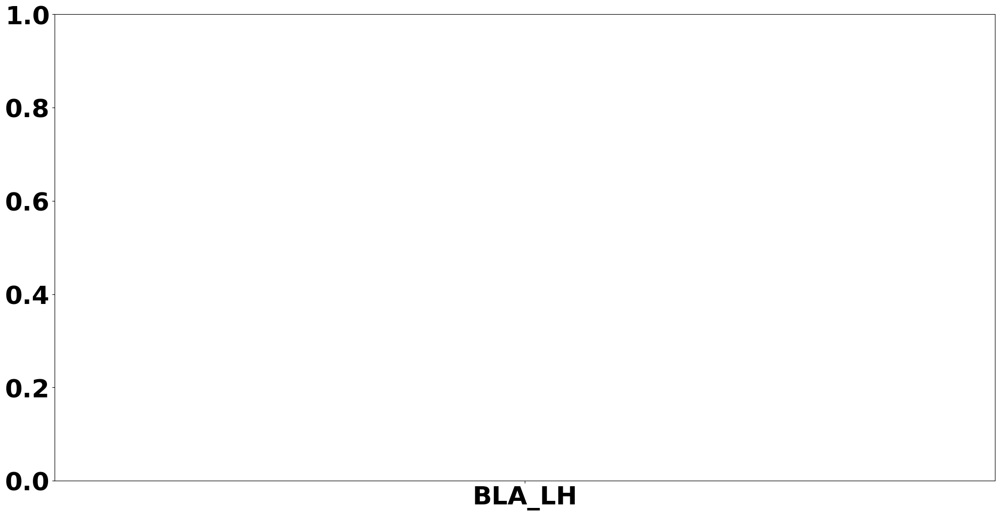

In [194]:
for band, frequency in BAND_TO_FREQ.items(): 
    # Convert the nested dictionary to a DataFrame
    data = []
    for group_name, group_data in region_pair_to_outcome_to_granger[band].items():
        for bar_name, bar_dict in group_data.items():
            data.append({"Group": group_name, "Bar": bar_name, "granger": bar_dict["mean"], "sem": bar_dict["sem"]})
    df = pd.DataFrame(data).sort_values(by=["Group", "Bar"])
    df["color"] = df["Bar"].map(OUTCOME_TO_COLOR)    
    fig, ax = plt.subplots(figsize=(24,12))
    
    
    # Create barplot
    ax = sns.barplot(x='Group', y='granger', hue='Bar', data=df, palette=df["color"], ci=None)
    
    # Adding error bars
    groups = df['Group'].unique()
    bars_per_group = df['Bar'].nunique()
    bar_width = 0.8 / bars_per_group  # the width of the bars
    x_positions = []  # this will store the x positions for the error bars

    for i, group in enumerate(groups):
        group_data = df[df['Group'] == group]  # filter the dataframe for the specific group
        num_bars = group_data.shape[0]  # get the number of bars for this group
        group_positions = np.linspace(i - bar_width*(num_bars-1)/2, i + bar_width*(num_bars-1)/2, num_bars)
        x_positions.extend(group_positions)  # add these positions to the list

        for pos, (idx, row) in zip(group_positions, group_data.iterrows()):
            height = row['granger']
            error = row['sem']
            plt.errorbar(pos, height, yerr=error, color='black', capsize=2, fmt='none', zorder=10)
    
    plt.xticks(rotation=90)
    plt.xlabel("Brain region pairs", fontsize=40)
    plt.ylabel("{} granger".format(band.title()), fontsize=40)
    plt.legend(title="Trial Conditions", loc="lower left", ncol=4)
    plt.title("{} granger".format(band.title()), fontsize=40)
    plt.tight_layout()
    plt.grid()
    plt.ylim(0,0.5)
    # ax.get_legend().remove()

    plt.savefig("./proc/granger/all_zscored_{}_lfp_power_granger.png".format(band))
    # Show the plot
    plt.show()

In [ ]:
trial_outcome_pairs = ("win", "lose"), ("win", "rewarded"), ("lose", "omission")

In [ ]:
for band, frequency in BAND_TO_FREQ.items():
    print(band)

In [ ]:
MERGED_LFP_AND_SLEAP.columns

In [ ]:
MERGED_LFP_AND_SLEAP["trial_outcome"].unique()

In [ ]:
region_to_mannwhitneyu = defaultdict(dict)
region_to_mannwhitneyu = []

for band, frequency in BAND_TO_FREQ.items():
    print(band)
    for region_col in [col for col in MERGED_LFP_AND_SLEAP.columns if band in col]:
        print(region_col)  
        for outcome_pair in trial_outcome_pairs:
            outcome_1_granger = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == outcome_pair[0]][region_col].dropna()
            outcome_2_granger = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == outcome_pair[1]][region_col].dropna()
            statistic, p_value = mannwhitneyu(outcome_1_granger, outcome_2_granger, alternative='two-sided')
            region_to_mannwhitneyu.append({"band": band, "region": region_col, "p_value": p_value, "statistic": statistic, "outcome": outcome_pair})
            
            # region_to_mannwhitneyu[region_col][outcome_pair] = p_value
            # print(region_col)
    
    
    # for outcome in MERGED_LFP_AND_SLEAP[GROUPINGS].unique():
    #     outcome_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP[GROUPINGS] == outcome].copy()
    #     for band_col in BAND_TO_ALL_COL[band]:
    #         region_pair_to_outcome_to_granger[band]["_".join(band_col.split("_")[:-3])][outcome]["mean"] = outcome_df[band_col].mean() 
    #         region_pair_to_outcome_to_granger[band]["_".join(band_col.split("_")[:-3])][outcome]["sem"] = outcome_df[band_col].sem() 




In [ ]:
granger_mannwhitneyu = pd.DataFrame(region_to_mannwhitneyu)

In [ ]:
granger_mannwhitneyu[granger_mannwhitneyu["p_value"] <= 0.001/3].sort_values(["p_value", "region"], ascending=True)

In [ ]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns="functional_graph", errors="ignore")

In [ ]:
MERGED_LFP_AND_SLEAP.to_pickle("./proc/MERGED_LFP_AND_SLEAP.pkl")

In [ ]:
MERGED_LFP_AND_SLEAP

In [ ]:
for col in MERGED_LFP_AND_SLEAP:
    print(col)

# Network Analysis

In [ ]:
raise ValueError()

In [ ]:
feature_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "averaged" in col and "coherence" in col or "averaged" in col and "granger" in col]

In [ ]:
feature_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "gamma" in col]
feature_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "averaged" in col]

In [ ]:
feature_columns

In [ ]:
import networkx as nx


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
import numpy as np

In [ ]:
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold, cross_val_score

# importing random forest classifier from assemble module 
from sklearn.ensemble import RandomForestClassifier 


In [ ]:
from sklearn.preprocessing import StandardScaler


In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
def get_region_network(row, columns, low_index=0, high_index=1):
    directed_graph = nx.DiGraph()
    for col in columns:
        region_1 = col.split("_")[0]
        region_2 = col.split("_")[1]
        directed_graph.add_edge(region_1, region_2, weight=np.mean(row[col][low_index:high_index]))
    return directed_graph

In [ ]:
network_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"].isin(["win", "lose"])]


In [ ]:
network_array = network_df[feature_columns]

In [ ]:
scaler = StandardScaler()
scaler.fit(network_array)

In [ ]:
network_array = scaler.transform(network_array)

In [ ]:
non_nan_mask = ~np.isnan(network_array).any(axis=1)

In [ ]:
from sklearn.model_selection import KFold


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(network_array[non_nan_mask], network_df["trial_outcome"][non_nan_mask], test_size = 0.20) 

In [ ]:
scores=[]
kFold=KFold(n_splits=5,shuffle=False)

# creating a RF classifier 
clf = RandomForestClassifier(n_estimators = 100)   
for train_index,test_index in kFold.split(network_array[non_nan_mask]):
    # print("Train Index: ", train_index, "\n")
    # print("Test Index: ", test_index)
    
    X_train, X_test, y_train, y_test = network_array[non_nan_mask][train_index], network_array[non_nan_mask][test_index], network_df["trial_outcome"][non_nan_mask].values[train_index], network_df["trial_outcome"][non_nan_mask].values[test_index]

    # Training the model on the training dataset 
    # fit function is used to train the model using the training sets as parameters 
    clf.fit(X_train, y_train) 
    scores.append(clf.score(X_test,y_test))
print(np.mean(scores))
# 0.9393939393939394


In [ ]:
scores

In [ ]:

# creating a RF classifier 
clf = RandomForestClassifier(n_estimators = 100)   
  
# Training the model on the training dataset 
# fit function is used to train the model using the training sets as parameters 
clf.fit(X_train, y_train) 
  
# performing predictions on the test dataset 
y_pred = clf.predict(X_test) 
  
# metrics are used to find accuracy or error 
from sklearn import metrics   
print() 
  
# using metrics module for accuracy calculation 
print("ACCURACY OF THE MODEL: ", metrics.accuracy_score(y_test, y_pred)) 

In [ ]:
importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)

In [ ]:
std

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
forest_importances = pd.DataFrame(importances, index=feature_columns).sort_values(0, ascending=False).reset_index()
forest_importances = forest_importances.rename(columns={0: "mdi"})

In [ ]:
forest_importances["brain_regions"] = forest_importances["index"].apply(lambda x: x.split("_")[:2])
forest_importances["measure"] = forest_importances["index"].apply(lambda x: x.split("_")[-1])
forest_importances["band"] = forest_importances["index"].apply(lambda x: x.split("_")[-2])

In [ ]:
forest_importances = forest_importances.iloc[:20]

In [ ]:
font = {'weight' : 'bold',
        'size'   : 12}

matplotlib.rc('font', **font)

In [ ]:
BAND_TO_COLOR = {"theta": "green", "beta": "blue", "gamma": "red"}

In [ ]:
MEASURE_TO_PATTERN = {"granger": "o", "coherence": ""}

In [ ]:
forest_importances["color"] = forest_importances["band"].map(BAND_TO_COLOR)
forest_importances["pattern"] = forest_importances["measure"].map(MEASURE_TO_PATTERN)

In [ ]:
forest_importances

In [ ]:
from collections import OrderedDict

In [ ]:
for index, row in forest_importances.iterrows():
    plt.bar(row["index"], row["mdi"], color=row["color"], label="{} {}".format(row["band"], row["measure"]), hatch=row["pattern"])

plt.xticks(fontsize=10, rotation=90)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())

plt.title("Feature importances for winning/losing", fontsize=20)
plt.ylabel("Mean decrease in impurity", fontsize=20)
# plt.tight_layout()
plt.savefig("./proc/network/rf_feature_importance.png")
plt.show()

In [ ]:
forest_importances.groupby(["measure", "band"])["mdi"].mean()

In [ ]:
from grakel import GraphKernel

In [ ]:
from grakel import Graph

In [ ]:
edges = {(1, 2): 1, (1, 3): 1, (2, 1): 1, (3, 1): 1}
edge_attributes = {(1, 2): [0.2, 0.8, 1.3], (1, 3): [1.1, 0.1, 0.7], (2, 1): [0.2, 0.8, 1.3], (3, 1): [1.1, 0.1, 0.7]}
G = Graph(edges, edge_labels=edge_attributes)

In [ ]:
trial_trace_columns = sorted([col.split("_")[0] for col in MERGED_LFP_AND_SLEAP.columns if "trial_lfp_trace" in col])


In [ ]:
trial_brain_region_pairs = generate_pairs(trial_trace_columns)


In [ ]:
trial_brain_region_pairs

In [ ]:


from itertools import product

In [ ]:
feature_df = pd.DataFrame(feature_columns, columns=["index"])

In [ ]:
feature_df = pd.DataFrame(feature_columns, columns=["index"])
feature_df["brain_regions"] = feature_df["index"].apply(lambda x: x.split("_")[:2])
feature_df["measure"] = feature_df["index"].apply(lambda x: x.split("_")[-1])
feature_df["band"] = feature_df["index"].apply(lambda x: x.split("_")[-2])

In [ ]:
feature_df

In [ ]:
feature_df["brain_regions"].str.contains(region_1)

In [ ]:
edge_attributes

In [ ]:
MERGED_LFP_AND_SLEAP["LH_BLA_averaged_theta_granger"]

In [ ]:
def create_functional_graph(row, columns, brain_region_pairs=None, measures=None, bands=None):
    """
    """
    if brain_region_pairs is None:
        brain_region_pairs = [('BLA', 'LH'),
         ('BLA', 'MD'),
         ('BLA', 'mPFC'),
         ('BLA', 'vHPC'),
         ('LH', 'MD'),
         ('LH', 'mPFC'),
         ('LH', 'vHPC'),
         ('MD', 'mPFC'),
         ('MD', 'vHPC'),
         ('mPFC', 'vHPC')]

    if measures is None:
        measures = ["coherence", "granger"]

    if bands is None:
        bands = ["theta", "beta", "gamma"]
    try:
        feature_df = pd.DataFrame(columns, columns=["index"])
        feature_df["brain_regions"] = feature_df["index"].apply(lambda x: x.split("_")[:2])
        feature_df["measure"] = feature_df["index"].apply(lambda x: x.split("_")[-1])
        feature_df["band"] = feature_df["index"].apply(lambda x: x.split("_")[-2])
        
        edges = {}
        edge_attributes = {}
        all_columns = []
        for region_1, region_2 in brain_region_pairs:
            # print(region_1)
            # print(region_2)
            edges[(region_1, region_2)] = 1
            edges[(region_2, region_1)] = 1
            edge_attributes[(region_1, region_2)] = []
            edge_attributes[(region_2, region_1)] = []
            for measure in measures:
                for band in bands:
                    for col in feature_df[(feature_df["band"] == band) & (feature_df["measure"] == measure) & (feature_df["brain_regions"].apply(lambda x: region_1 in x)) & ((feature_df["brain_regions"].apply(lambda x: region_2 in x)))]["index"]:
                        # print(col)
                        reg_1 = col.split("_")[0]
                        reg_2 = col.split("_")[1]
                        if "coherence" in col:
                            # print(reg_2, reg_1)
                            edge_attributes[(reg_2, reg_1)].append(row[col])      
                        # print(reg_1, reg_2)
                        edge_attributes[(reg_1, reg_2)].append(row[col])
                        all_columns.append(col)
        return all_columns, Graph(edges, edge_labels=edge_attributes)
    except Exception as e: 
        print(e)   
        return np.nan

In [ ]:
edges = {(1, 2): 1, (1, 3): 1, (2, 1): 1, (3, 1): 1}
edge_attributes = {(1, 2): [0.2, 0.8, 1.3], (1, 3): [1.1, 0.1, 0.7], (2, 1): [0.2, 0.8, 1.3], (3, 1): [1.1, 0.1, 0.7]}
G = Graph(edges, edge_labels=edge_attributes)

In [ ]:
G.edge_dictionary

In [ ]:
MERGED_LFP_AND_SLEAP["BLA_LH_averaged_theta_coherence"]

In [ ]:
MERGED_LFP_AND_SLEAP["functional_graph"] = MERGED_LFP_AND_SLEAP.apply(lambda x: create_functional_graph(x, feature_columns), axis=1)

In [ ]:
MERGED_LFP_AND_SLEAP["all_columns"] = MERGED_LFP_AND_SLEAP["functional_graph"].apply(lambda x: x[0])
MERGED_LFP_AND_SLEAP["functional_graph"] = MERGED_LFP_AND_SLEAP["functional_graph"].apply(lambda x: x[1])

In [ ]:
MERGED_LFP_AND_SLEAP["functional_graph"].iloc[0].edge_dictionary

In [ ]:
from grakel.kernels import WeisfeilerLehman, VertexHistogram
wl_kernel = WeisfeilerLehman(n_iter=5, normalize=True, base_graph_kernel=VertexHistogram)

In [ ]:
from grakel.kernels import neighborhood_subgraph_pairwise_distance

In [ ]:
kernel = neighborhood_subgraph_pairwise_distance

In [ ]:
kernel = kernel.NeighborhoodSubgraphPairwiseDistance(n_jobs=5, normalize=True)

In [ ]:
kernel = WeisfeilerLehman(n_iter=5, normalize=True, base_graph_kernel=VertexHistogram)

In [ ]:
from grakel.datasets import fetch_dataset
MUTAG = fetch_dataset("MUTAG", verbose=False)
G = MUTAG.data
y = MUTAG.target

In [ ]:
from sklearn.model_selection import train_test_split
G_train, G_test, y_train, y_test = train_test_split(MERGED_LFP_AND_SLEAP["functional_graph"], MERGED_LFP_AND_SLEAP["trial_outcome"], test_size=0.3, random_state=42)

In [ ]:
from sklearn.model_selection import train_test_split
G_train, G_test, y_train, y_test = train_test_split(G, y, test_size=0.1, random_state=42)

In [ ]:
example = G_train[0]

In [ ]:
example.node_labels

In [ ]:
import networkx as nx

G = nx.Graph()
# Add nodes
G.add_node(1)
G.add_node(2)
G.add_node(3)

# Add weighted edges
G.add_edge(1, 2, weight=0.5)
G.add_edge(1, 2, weight=0.5)
G.add_edge(1, 2, weight=0.5)

G.add_edge(2, 3, weight=1.5)
G.add_edge(1, 3, weight=1.0)

In [ ]:
graph = [(dict(G_train[0].nodes(data=True)), dict(G_train[0].edges(data=True)))]

In [ ]:
K_train = kernel.fit_transform(G_train)

In [ ]:
example.edge_dictionary

In [ ]:
neighborhood_subgraph_pairwise_distance

In [ ]:
example = G_train[0]

In [ ]:
G[0]

In [ ]:
edges = {}
edge_attributes = {}
all_columns = []
for region_1, region_2 in trial_brain_region_pairs:
    print(region_1)
    print(region_2)
    edges[(region_1, region_2)] = 1
    edges[(region_2, region_1)] = 1
    edge_attributes[(region_1, region_2)] = []
    edge_attributes[(region_2, region_1)] = []
    for measure in ["coherence", "granger"]:
        for band in BAND_TO_FREQ:
            for col in feature_df[(feature_df["band"] == band) & (feature_df["measure"] == measure) & (feature_df["brain_regions"].apply(lambda x: region_1 in x)) & ((feature_df["brain_regions"].apply(lambda x: region_2 in x)))]["index"]:
                print(col)
                reg_1 = col.split("_")[0]
                reg_2 = col.split("_")[1]
                if "coherence" in col:
                    print(reg_2, reg_1)
                    edge_attributes[(reg_2, reg_1)].append(MERGED_LFP_AND_SLEAP[col].iloc[0])      
                print(reg_1, reg_2)
                edge_attributes[(reg_1, reg_2)].append(MERGED_LFP_AND_SLEAP[col].iloc[0])
                all_columns.append(col)

In [ ]:
edge_attributes

In [ ]:
BAND_TO_FREQ

In [ ]:
feature_columns

In [ ]:
edges

In [ ]:
feature_columns

In [ ]:
pair_base_name

In [ ]:
edges = {(1, 2): 1, (1, 3): 1, (2, 1): 1, (3, 1): 1}
edge_attributes = {(1, 2): [0.2, 0.8, 1.3], (1, 3): [1.1, 0.1, 0.7], (2, 1): [0.2, 0.8, 1.3], (3, 1): [1.1, 0.1, 0.7]}
G = Graph(edges, edge_labels=edge_attributes)

In [ ]:
MERGED_LFP_AND_SLEAP

In [ ]:
forest_importances.sort_values(0, ascending=False).head(n=25)

In [ ]:
plt.bar(forest_importances.sort_values(0, ascending=False).head(n=25))

In [ ]:
forest_importances = pd.DataFrame(importances, index=feature_columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax, fontsize=5)
ax.set_title("Feature importances using MDI\nfor winning/losing with Gamma Granger Causality", fontsize=10)
ax.set_ylabel("Mean decrease in impurity", fontsize=10)
fig.tight_layout()
plt.savefig("./proc/network/rf_feature_importance.png")

# Exporting the power spectra

In [ ]:
raise ValueError()

In [ ]:
trace_columns

In [ ]:
exported_lfp_and_sleap = MERGED_LFP_AND_SLEAP.drop(columns=trace_columns, errors="ignore").copy()
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "multitaper" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "thorax_velocity" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "frequencies" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "windowed_power" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "connectivity" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "spike_interface" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "index" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "stamp" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "box" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "height" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "width" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "ratio" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "width" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=['individual_subj',
 'all_subj',
 'recording_name',
 'track_names',
 'subject_id',
 'corner_path',
 'corner_parts',
 'rescaled_locations',
 'reward_port'], errors="ignore")
# exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "all_window_power" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "window_averaged_power" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "all_power" in col], errors="ignore")





In [ ]:
exported_lfp_and_sleap["frequencies"] = [MERGED_LFP_AND_SLEAP["BLA_baseline_frequencies"].iloc[0] for _ in range(len(exported_lfp_and_sleap))] 

In [ ]:
for col in exported_lfp_and_sleap.columns:
    print(col)

In [ ]:
exported_lfp_and_sleap.to_pickle("./proc/rce_lfp_power_and_velocity_region_col_baselinetrial_row.pkl")

In [ ]:
raise ValueError()

# Reformatting the data

In [ ]:
exported_lfp_and_sleap

In [ ]:
window_averaged_power_columns

In [ ]:
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "all_window" in col], errors="ignore")


In [ ]:
exported_lfp_and_sleap = pd.melt(exported_lfp_and_sleap, value_vars=window_averaged_power_columns, value_name="power", id_vars=[col for col in exported_lfp_and_sleap.columns if col not in window_averaged_power_columns], var_name="region_and_baseline_or_trial")



In [ ]:
exported_lfp_and_sleap

In [ ]:
exported_lfp_and_sleap["brain_region"] = exported_lfp_and_sleap["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [ ]:
exported_lfp_and_sleap["trial_or_baseline"] = exported_lfp_and_sleap["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [ ]:
exported_lfp_and_sleap.head()

In [ ]:
exported_lfp_and_sleap = exported_lfp_and_sleap.dropna(subset="power")
exported_lfp_and_sleap = exported_lfp_and_sleap[exported_lfp_and_sleap["trial_or_baseline"] == "trial"]
exported_lfp_and_sleap["all_theta_power"] = exported_lfp_and_sleap["power"].apply(lambda x: x[4:13])
exported_lfp_and_sleap["all_beta_power"] = exported_lfp_and_sleap["power"].apply(lambda x: x[13:31])
exported_lfp_and_sleap["all_gamma_power"] = exported_lfp_and_sleap["power"].apply(lambda x: x[30:91])
exported_lfp_and_sleap["mean_theta_power"] = exported_lfp_and_sleap["all_theta_power"].apply(lambda x: x.mean())
exported_lfp_and_sleap["mean_beta_power"] = exported_lfp_and_sleap["all_beta_power"].apply(lambda x: x.mean())
exported_lfp_and_sleap["mean_gamma_power"] = exported_lfp_and_sleap["all_gamma_power"].apply(lambda x: x.mean())

In [ ]:
exported_lfp_and_sleap.head()

In [ ]:
exported_lfp_and_sleap

In [ ]:
exported_lfp_and_sleap.to_pickle("./proc/rce_velocity_parsed_power_spectra_region_and_baselinetrial_rows.pkl")